# Introduction

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import os
import colorsys
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random

from scipy.ndimage import zoom
from PIL import Image, ImageDraw, ImageFilter
from matplotlib.colors import ListedColormap
from tqdm import tqdm
from PIL import Image
from torchvision import datasets, transforms, models
from scipy.signal import find_peaks
from torch.utils.data import TensorDataset, DataLoader, random_split
from scipy.stats import mannwhitneyu
from statsmodels.sandbox.stats.runs import runstest_1samp
from itertools import combinations
from collections import Counter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#@title Model and Dataset Configuration { run: "auto" }
#@markdown Select the model architecture and dataset for analysis.

MODEL = "ResNet50"  #@param ["ResNet50", "ViTL32", "ViTB16", "ResNet18", "VGG16", "CLIP_ViT_B32", "CLIP_ViT_L14", "CLIP_RN50", "CLIP_RN50x4", "DINOV2_S", "DINOV2_B", "DINOV2_L", "BLIP1_BASE", "BLIP1_LARGE", "BLIP2_OPT2", "BLIP2_FLANT5", "GEMMA4_E4B", "GEMMA4_26B"]
DATASET = "ImageNet"  #@param ["ImageNet", "Places365", "Cifar10", "Cifar100", "CustomColorDataset"]

#@markdown ---
#@markdown **Note:** Changing these values will trigger re-execution of dependent cells.

print(f"✅ Configuration loaded: MODEL={MODEL}, DATASET={DATASET}")

✅ Configuration loaded: MODEL=ResNet50, DATASET=ImageNet


In [ ]:
if MODEL == "ResNet50":
    from torchvision.models import resnet50, ResNet50_Weights
elif MODEL == "ViTL32":
    from torchvision.models import vit_l_32, ViT_L_32_Weights
elif MODEL == "ViTB16":
    from torchvision.models import vit_b_16, ViT_B_16_Weights
elif MODEL == "ResNet18":
    from torchvision.models import resnet18, ResNet18_Weights
elif MODEL == "VGG16":
    from torchvision.models import vgg16, VGG16_Weights

# --- MULTIMODAL / FOUNDATION MODELS ---
elif MODEL == "CLIP_ViT_B32":
    # Model from the original Goh et al. study
    from transformers import CLIPModel, CLIPProcessor
    print("CLIP ViT-B/32 selected.")

elif MODEL == "CLIP_ViT_L14":
    from transformers import CLIPModel, CLIPProcessor
    print("CLIP ViT-L/14 selected (Higher visual capacity).")

elif MODEL == "CLIP_RN50":
    from transformers import CLIPModel, CLIPProcessor
    print("CLIP ResNet-50 selected.")

elif MODEL == "CLIP_RN50x4":
    from transformers import CLIPModel, CLIPProcessor
    print("CLIP ResNet-50 4x selected")

# --- DINOv2 MODELS ---
elif MODEL == "DINOV2_S":
    # Small model (~22M parameters) - Ideal for rapid experimentation
    from transformers import AutoModel, AutoImageProcessor
    print("DINOv2-Small (ViT-S/14) selected.")

elif MODEL == "DINOV2_B":
    # Base model (~86M parameters) - Equivalent in size to ViT-Base
    from transformers import AutoModel, AutoImageProcessor
    print("DINOv2-Base (ViT-B/14) selected.")

elif MODEL == "DINOV2_L":
    # Large model (~304M parameters) - Higher representational capacity
    from transformers import AutoModel, AutoImageProcessor
    print("DINOv2-Large (ViT-L/14) selected.")

# --- BLIP MODELS ---
elif MODEL == "BLIP1_BASE":
    # BLIP-1 with ViT-B/16 backbone.
    # Integrated MED architecture (ViT is trained, not frozen).
    from transformers import BlipProcessor, BlipForConditionalGeneration
    print("BLIP-1 Base (ViT-B/16) selected.")

elif MODEL == "BLIP1_LARGE":
    # BLIP-1 with ViT-L/16 backbone.
    from transformers import BlipProcessor, BlipForConditionalGeneration
    print("BLIP-1 Large (ViT-L/16) selected.")

elif MODEL == "BLIP2_OPT2":
    # BLIP-2 with frozen CLIP ViT-B/32 and OPT-2.7B LLM.
    # The vision encoder is completely frozen and isolated.
    from transformers import Blip2Processor, Blip2ForConditionalGeneration
    print("BLIP-2 (ViT-B/32 + OPT-2.7B) selected.")

elif MODEL == "BLIP2_FLANT5":
    # BLIP-2 with frozen CLIP ViT-L/14 and Flan-T5-XL LLM.
    # Larger ViT backbone, still frozen.
    from transformers import Blip2Processor, Blip2ForConditionalGeneration
    print("BLIP-2 (ViT-L/14 + Flan-T5-XL) selected.")

# --- GEMMA 4 VISION MODELS ---
elif MODEL == "GEMMA4_E4B":
    # Gemma 4 Efficient 4B - Lightweight multimodal model
    from transformers import AutoProcessor, Gemma4ForConditionalGeneration
    print("Gemma 4 E4B selected (Efficient 4B vision-language model).")

elif MODEL == "GEMMA4_26B":
    # Gemma 4 26B - High-capacity MoE architecture
    from transformers import AutoProcessor, Gemma4ForConditionalGeneration
    print("Gemma 4 26B selected (MoE vision-language model).")

else:
    print("Model not supported.")

In [ ]:
path = "/content/drive/MyDrive/Research/Computer_Science/Interpretability/Tabular_Explanations"

In [ ]:
import sys
sys.path.append(path)
import data_utils

In [ ]:
if DATASET == "ImageNet":
    !mkdir /content/imagenet_val
    !mkdir /content/imagenet_val/dummy
    !tar -xvf /content/drive/MyDrive/Research/Computer_Science/Interpretability/Tabular_Explanations/data/ILSVRC2012_img_val.tar -C /content/imagenet_val/dummy/
    extract_path = "/content/imagenet_val/dummy/"
    filenames = os.listdir(extract_path)
    dataset_name = 'imagenet_val'
    dataset = data_utils.get_data(dataset_name)
elif DATASET == "Places365":
    dataset = datasets.Places365(root="/content", split='val', download=True)
elif DATASET == "Cifar100":
    dataset = datasets.CIFAR100(root="/content", train=False, download=True)

Se truncaron las últimas líneas 5000 del resultado de transmisión.
ILSVRC2012_val_00049867.JPEG
ILSVRC2012_val_00049494.JPEG
ILSVRC2012_val_00048672.JPEG
ILSVRC2012_val_00048308.JPEG
ILSVRC2012_val_00047912.JPEG
ILSVRC2012_val_00045841.JPEG
ILSVRC2012_val_00044931.JPEG
ILSVRC2012_val_00044439.JPEG
ILSVRC2012_val_00043527.JPEG
ILSVRC2012_val_00042653.JPEG
ILSVRC2012_val_00042377.JPEG
ILSVRC2012_val_00041405.JPEG
ILSVRC2012_val_00040366.JPEG
ILSVRC2012_val_00035524.JPEG
ILSVRC2012_val_00033710.JPEG
ILSVRC2012_val_00031038.JPEG
ILSVRC2012_val_00030167.JPEG
ILSVRC2012_val_00024859.JPEG
ILSVRC2012_val_00024401.JPEG
ILSVRC2012_val_00023858.JPEG
ILSVRC2012_val_00023793.JPEG
ILSVRC2012_val_00022999.JPEG
ILSVRC2012_val_00021691.JPEG
ILSVRC2012_val_00021616.JPEG
ILSVRC2012_val_00020289.JPEG
ILSVRC2012_val_00019766.JPEG
ILSVRC2012_val_00019701.JPEG
ILSVRC2012_val_00017988.JPEG
ILSVRC2012_val_00017438.JPEG
ILSVRC2012_val_00015230.JPEG
ILSVRC2012_val_00014799.JPEG
ILSVRC2012_val_00014292.JPEG
ILSVR

In [ ]:
train_ids = torch.load(path + f"/data/train_ids_{DATASET}.pt")
val_ids   = torch.load(path + f"/data/val_ids_{DATASET}.pt")
test_ids  = torch.load(path + f"/data/test_ids_{DATASET}.pt")

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
# Model loading based on selected architecture
if MODEL == "ResNet50":
    weights = ResNet50_Weights.IMAGENET1K_V1
    studied_model = resnet50(weights=weights)
    studied_model.eval()
    studied_model = studied_model.to(device)

elif MODEL == "ViTL32":
    weights = ViT_L_32_Weights.IMAGENET1K_V1
    studied_model = vit_l_32(weights=weights)
    studied_model.eval()
    studied_model = studied_model.to(device)

elif MODEL == "ViTB16":
    weights = ViT_B_16_Weights.IMAGENET1K_V1
    studied_model = vit_b_16(weights=weights)
    studied_model.eval()
    studied_model = studied_model.to(device)

elif MODEL == "ResNet18":
    !wget http://places2.csail.mit.edu/models_places365/resnet18_places365.pth.tar
    studied_model = models.resnet18(num_classes=365)
    checkpoint = torch.load("resnet18_places365.pth.tar", map_location="cpu")
    state_dict = {k.replace("module.", ""): v for k, v in checkpoint['state_dict'].items()}
    studied_model.load_state_dict(state_dict)
    studied_model.eval()
    studied_model = studied_model.to(device)

elif MODEL == "VGG16":
    studied_model = torch.hub.load("chenyaofo/pytorch-cifar-models", "{}_{}".format("cifar100", "vgg16_bn"), pretrained=True)
    studied_model.eval()
    studied_model = studied_model.to(device)

# --- CLIP MODELS ---
elif MODEL == "CLIP_ViT_B32":
    # CLIP ViT-B/32 - The model used in Goh et al. for most multimodal neuron analysis
    studied_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ CLIP ViT-B/32 loaded (Goh et al. primary model)")

elif MODEL == "CLIP_ViT_L14":
    # CLIP ViT-L/14 - Higher visual capacity variant
    studied_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ CLIP ViT-L/14 loaded")

elif MODEL == "CLIP_RN50":
    # CLIP ResNet-50 - This is CLIP RN50 (1x), not RN50_4x
    studied_model = CLIPModel.from_pretrained("openai/clip-resnet-50")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ CLIP ResNet-50 loaded")

elif MODEL == "CLIP_RN50x4":
    # CLIP ResNet-50 4x - The model where "Neuron 244" was found
    # This uses a 4x wider ResNet-50 backbone
    studied_model = CLIPModel.from_pretrained("openai/clip-resnet-50x4")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ CLIP ResNet-50 4x loaded (Goh et al. Neuron 244 model)")

# --- DINOv2 MODELS ---
elif MODEL == "DINOV2_S":
    studied_model = AutoModel.from_pretrained("facebook/dinov2-small")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ DINOv2-Small (ViT-S/14) loaded")

elif MODEL == "DINOV2_B":
    studied_model = AutoModel.from_pretrained("facebook/dinov2-base")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ DINOv2-Base (ViT-B/14) loaded")

elif MODEL == "DINOV2_L":
    studied_model = AutoModel.from_pretrained("facebook/dinov2-large")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ DINOv2-Large (ViT-L/14) loaded")

# --- BLIP MODELS ---
elif MODEL == "BLIP1_BASE":
    studied_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ BLIP-1 Base (ViT-B/16) loaded")

elif MODEL == "BLIP1_LARGE":
    studied_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ BLIP-1 Large (ViT-L/16) loaded")

elif MODEL == "BLIP2_OPT2":
    studied_model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ BLIP-2 (ViT-B/32 + OPT-2.7B) loaded")

elif MODEL == "BLIP2_FLANT5":
    studied_model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-flan-t5-xl")
    studied_model.eval()
    studied_model = studied_model.to(device)
    print("✅ BLIP-2 (ViT-L/14 + Flan-T5-XL) loaded")

# --- GEMMA 4 VISION MODELS ---
elif MODEL == "GEMMA4_E4B":
    studied_model = Gemma4ForConditionalGeneration.from_pretrained(
        "google/gemma-4-4b-it",
        device_map="auto",
        torch_dtype=torch.bfloat16
    )
    studied_model.eval()
    print("✅ Gemma 4 E4B (4B) loaded")

elif MODEL == "GEMMA4_26B":
    studied_model = Gemma4ForConditionalGeneration.from_pretrained(
        "google/gemma-4-26b-it",
        device_map="auto",
        torch_dtype=torch.bfloat16
    )
    studied_model.eval()
    print("✅ Gemma 4 26B (MoE) loaded")

else:
    raise ValueError(f"Model loading not implemented for: {MODEL}")

print(f"✅ Model {MODEL} successfully loaded and moved to {device}")

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 281MB/s]


✅ Model ResNet50 successfully loaded and moved to cuda


In [ ]:
def resnet_imagenet_preprocess():
    target_mean = [0.485, 0.456, 0.406]
    target_std = [0.229, 0.224, 0.225]
    preprocess = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224),
                   transforms.ToTensor(), transforms.Normalize(mean=target_mean, std=target_std)])
    return preprocess

In [ ]:
def get_cifar_preprocess():
    target_mean = [0.5070, 0.4865, 0.4409]
    target_std = [0.2673, 0.2564, 0.2761]
    preprocess = transforms.Compose([transforms.Resize(32), transforms.ToTensor(),
                         transforms.Normalize(mean=target_mean, std=target_std)])
    return preprocess


In [ ]:
# Determine the appropriate image preprocessing pipeline based on the selected model.
# This ensures images are normalized and resized exactly as expected during training.

if MODEL in ["ResNet50", "ResNet18"]:
    # Standard ImageNet normalization for torchvision ResNets
    transform = resnet_imagenet_preprocess()

elif MODEL == "VGG16":
    # CIFAR-specific preprocessing (32x32, CIFAR normalization)
    transform = get_cifar_preprocess()

elif MODEL in ["ViTL32", "ViTB16"]:
    # Torchvision ViT models use a specific transform provided by their weights object.
    # You need to load the weights object first. Example:
    # weights = ViT_B_16_Weights.IMAGENET1K_V1 (or similar)
    transform = weights.transforms()

# --- HUGGING FACE TRANSFORMERS MODELS ---
# These models ship with their own dedicated processor classes which handle
# resizing, normalization, and tensor conversion correctly.

elif MODEL in ["CLIP_ViT_B32", "CLIP_ViT_L14", "CLIP_RN50","CLIP_RN50x4"]:
    # CLIP expects specific normalization (mean=0.5, std=0.5 usually) and square resizing.
    model_id_map = {
        "CLIP_ViT_B32": "openai/clip-vit-base-patch32",
        "CLIP_ViT_L14": "openai/clip-vit-large-patch14",
        "CLIP_RN50": "openai/clip-resnet-50",
        "CLIP_RN50x4": "openai/clip-resnet-50x4"
    }
    processor = CLIPProcessor.from_pretrained(model_id_map[MODEL])
    # CLIPProcessor handles both images and text; we'll use the image processor part.
    transform = lambda img: processor(images=img, return_tensors="pt")["pixel_values"].squeeze(0)

elif MODEL in ["DINOV2_S", "DINOV2_B", "DINOV2_L"]:
    # DINOv2 uses standard ImageNet normalization but specific resizing.
    model_id_map = {
        "DINOV2_S": "facebook/dinov2-small",
        "DINOV2_B": "facebook/dinov2-base",
        "DINOV2_L": "facebook/dinov2-large"
    }
    processor = AutoImageProcessor.from_pretrained(model_id_map[MODEL])
    transform = lambda img: processor(images=img, return_tensors="pt")["pixel_values"].squeeze(0)

elif MODEL in ["BLIP1_BASE", "BLIP1_LARGE"]:
    model_id_map = {
        "BLIP1_BASE": "Salesforce/blip-image-captioning-base",
        "BLIP1_LARGE": "Salesforce/blip-image-captioning-large"
    }
    processor = BlipProcessor.from_pretrained(model_id_map[MODEL])
    transform = lambda img: processor(images=img, return_tensors="pt")["pixel_values"].squeeze(0)

elif MODEL in ["BLIP2_OPT2", "BLIP2_FLANT5"]:
    model_id_map = {
        "BLIP2_OPT2": "Salesforce/blip2-opt-2.7b",
        "BLIP2_FLANT5": "Salesforce/blip2-flan-t5-xl"
    }
    processor = Blip2Processor.from_pretrained(model_id_map[MODEL])
    transform = lambda img: processor(images=img, return_tensors="pt")["pixel_values"].squeeze(0)

elif MODEL in ["GEMMA4_E4B", "GEMMA4_26B"]:
    model_id_map = {
        "GEMMA4_E4B": "google/gemma-4-4b-it",
        "GEMMA4_26B": "google/gemma-4-26b-it"
    }
    processor = AutoProcessor.from_pretrained(model_id_map[MODEL])
    # Note: Gemma 4 uses chat templates. For pure feature extraction of images,
    # you might still need to wrap it in a chat structure, but the processor handles resizing.
    # Example: messages = [{"role": "user", "content": [{"type": "image", "image": img}]}]
    # For your pipeline, just getting pixel_values is fine.
    transform = lambda img: processor.image_processor(img, return_tensors="pt")["pixel_values"].squeeze(0)

else:
    raise ValueError(f"Preprocessing transform not defined for model: {MODEL}")

print(f"✅ Preprocessing pipeline loaded for {MODEL}")

✅ Preprocessing pipeline loaded for ResNet50


# Layer

In [ ]:
MODEL

'ResNet50'

In [ ]:
studied_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
#studied_model.vision_model.post_layernorm #vision_model.encoder.layers[-1]  # encoder_layer_11

In [ ]:
#studied_model.layer4[0].conv2
#layer = studied_model.layer1 #studied_model.encoder.layers.encoder_layer_23.mlp[1] #studied_model.layer1[0].relu
#layer_name = "layer1" #"encoder.layers.encoder_layer_23.mlp_1" #'layer1_0_relu'

layer = studied_model.encoder.ln #studied_model.encoder.layers.encoder_layer_0.mlp[1]
layer_name = "studied_model.encoder.ln" #encoder.layers.encoder_layer_0.mlp_1"

In [ ]:
layer

LayerNorm((768,), eps=1e-06, elementwise_affine=True)

In [ ]:
# NEEDS SOME FIXES FOR OTHER NETWORKS
def get_target_layer(model, model_name, layer_type="final"):
    """
    Returns the appropriate target layer for activation extraction.

    Args:
        model: Loaded PyTorch model
        model_name: String identifier of the model
        layer_type: Type of layer to extract:
            - "final": Penultimate layer / last LayerNorm (multimodal neurons, Goh et al.)
            - "early": First layer / early features (low-level color features, edges)
            - "mid": Middle layer (intermediate representations)
            - "all": Returns a dict of multiple layers for comparative analysis

    Returns:
        PyTorch module/layer or dict of layers if layer_type="all"
    """

    if layer_type == "all":
        # Return a dictionary of layers for comprehensive analysis
        return get_all_relevant_layers(model, model_name)

    # =========================================================================
    # FINAL LAYER (Penultimate layer - Multimodal neurons, semantic concepts)
    # =========================================================================
    if layer_type == "final":

        # --- CLIP Models (HuggingFace) ---
        if model_name in ["CLIP_ViT_B32", "CLIP_ViT_L14"]:
            # post_layernorm is the penultimate layer of the vision encoder
            # This is where Goh et al. discovered multimodal neurons (768-dim or 1024-dim)
            return model.vision_model.post_layernorm

        elif model_name in ["CLIP_RN50", "CLIP_RN50x4"]:
            # CLIP ResNet uses attention pooling as the penultimate layer
            # For RN50_4x, this is where "Neuron 244" (yellow-green) was found
            return model.vision_model.attnpool

        # --- Torchvision ViT Models ---
        elif model_name in ["ViTL32", "ViTB16"]:
            # Torchvision ViT uses 'encoder.ln' (not 'post_layernorm')
            return studied_model.encoder.ln, "ln"

        # --- DINOv2 Models (HuggingFace) ---
        elif model_name in ["DINOV2_S", "DINOV2_B", "DINOV2_L"]:
            # DINOv2 uses 'norm' for its final LayerNorm (different naming convention)
            if hasattr(model, 'norm'):
                return model.norm
            elif hasattr(model, 'encoder') and hasattr(model.encoder, 'norm'):
                return model.encoder.norm
            else:
                # Fallback: try common naming patterns
                raise AttributeError(f"Cannot find final LayerNorm in {model_name}. Check model structure.")

        # --- BLIP-1 Models (HuggingFace) ---
        elif model_name in ["BLIP1_BASE", "BLIP1_LARGE"]:
            # BLIP-1 vision encoder follows similar structure to CLIP
            if hasattr(model.vision_model, 'post_layernorm'):
                return model.vision_model.post_layernorm
            elif hasattr(model.vision_model, 'encoder') and hasattr(model.vision_model.encoder, 'ln'):
                return model.vision_model.encoder.ln
            else:
                raise AttributeError(f"Cannot find final LayerNorm in {model_name}")

        # --- BLIP-2 Models (HuggingFace) ---
        elif model_name in ["BLIP2_OPT2", "BLIP2_FLANT5"]:
            # BLIP-2 uses a frozen CLIP vision model
            if hasattr(model.vision_model, 'post_layernorm'):
                return model.vision_model.post_layernorm
            elif hasattr(model.vision_model, 'encoder') and hasattr(model.vision_model.encoder, 'ln'):
                return model.vision_model.encoder.ln
            else:
                raise AttributeError(f"Cannot find final LayerNorm in {model_name}")

        # --- ResNet Models (Torchvision) ---
        elif model_name in ["ResNet50", "ResNet18"]:
            # avgpool is the penultimate layer before fc
            return model.avgpool

        # --- VGG16 ---
        elif model_name == "VGG16":
            # Last convolutional layer
            return model.features[-1]

        # --- Gemma 4 Vision Models ---
        elif model_name in ["GEMMA4_E4B", "GEMMA4_26B"]:
            if hasattr(model, 'vision_tower'):
                if hasattr(model.vision_tower, 'post_layernorm'):
                    return model.vision_tower.post_layernorm
                elif hasattr(model.vision_tower, 'encoder') and hasattr(model.vision_tower.encoder, 'ln'):
                    return model.vision_tower.encoder.ln
            raise AttributeError(f"Cannot find vision tower or final LayerNorm in {model_name}")

    # =========================================================================
    # EARLY LAYER (First layers - Low-level features: pure colors, edges, textures)
    # =========================================================================
    elif layer_type == "early":

        # --- CLIP Models (HuggingFace) ---
        if model_name in ["CLIP_ViT_B32", "CLIP_ViT_L14"]:
            # First transformer block (processes patch embeddings)
            return model.vision_model.encoder.layers[0]

        elif model_name in ["CLIP_RN50", "CLIP_RN50x4"]:
            # First convolutional layer
            return model.vision_model.conv1

        # --- Torchvision ViT Models ---
        elif model_name in ["ViTL32", "ViTB16"]:
            return studied_model.encoder.layers.encoder_layer_0.mlp[1], "E0_MLP1"

        # --- DINOv2 Models (HuggingFace) ---
        elif model_name in ["DINOV2_S", "DINOV2_B", "DINOV2_L"]:
            # First encoder block
            if hasattr(model, 'encoder') and hasattr(model.encoder, 'layers'):
                return model.encoder.layers[0]
            elif hasattr(model, 'layers'):
                return model.layers[0]
            else:
                raise AttributeError(f"Cannot find encoder layers in {model_name}")

        # --- BLIP-1 Models (HuggingFace) ---
        elif model_name in ["BLIP1_BASE", "BLIP1_LARGE"]:
            return model.vision_model.encoder.layers[0]

        # --- BLIP-2 Models (HuggingFace) ---
        elif model_name in ["BLIP2_OPT2", "BLIP2_FLANT5"]:
            return model.vision_model.encoder.layers[0]

        # --- ResNet Models (Torchvision) ---
        elif model_name in ["ResNet50", "ResNet18"]:
            # First convolutional layer (7x7 conv, 64 filters)
            return model.layer1, "layer1"

        # --- VGG16 ---
        elif model_name == "VGG16":
            # First convolutional layer
            return model.features[0]

        # --- Gemma 4 Vision Models ---
        elif model_name in ["GEMMA4_E4B", "GEMMA4_26B"]:
            if hasattr(model, 'vision_tower') and hasattr(model.vision_tower, 'encoder'):
                return model.vision_tower.encoder.layers[0]
            raise AttributeError(f"Cannot find early layer in {model_name}")

    # =========================================================================
    # MIDDLE LAYER (Intermediate representations)
    # =========================================================================
    elif layer_type == "mid":

        # --- CLIP Models (HuggingFace) ---
        if model_name in ["CLIP_ViT_B32", "CLIP_ViT_L14"]:
            # Layer 6 of 12 (middle of the transformer)
            return model.vision_model.encoder.layers[5]

        elif model_name in ["CLIP_RN50", "CLIP_RN50x4"]:
            # layer2 is roughly the middle of ResNet
            if hasattr(model.vision_model, 'layer2'):
                return model.vision_model.layer2[-1]
            raise AttributeError(f"Cannot find middle layer in {model_name}")

        # --- Torchvision ViT Models ---
        elif model_name in ["ViTL32", "ViTB16"]:
            num_layers = len(model.encoder.layers)
            return model.encoder.layers[num_layers // 2]

        # --- DINOv2 Models (HuggingFace) ---
        elif model_name in ["DINOV2_S", "DINOV2_B", "DINOV2_L"]:
            if hasattr(model, 'encoder') and hasattr(model.encoder, 'layers'):
                num_layers = len(model.encoder.layers)
                return model.encoder.layers[num_layers // 2]
            elif hasattr(model, 'layers'):
                num_layers = len(model.layers)
                return model.layers[num_layers // 2]
            else:
                raise AttributeError(f"Cannot find middle layer in {model_name}")

        # --- BLIP-1 Models (HuggingFace) ---
        elif model_name in ["BLIP1_BASE", "BLIP1_LARGE"]:
            num_layers = len(model.vision_model.encoder.layers)
            return model.vision_model.encoder.layers[num_layers // 2]

        # --- BLIP-2 Models (HuggingFace) ---
        elif model_name in ["BLIP2_OPT2", "BLIP2_FLANT5"]:
            num_layers = len(model.vision_model.encoder.layers)
            return model.vision_model.encoder.layers[num_layers // 2]

        # --- ResNet Models (Torchvision) ---
        elif model_name in ["ResNet50", "ResNet18"]:
            # layer2 is roughly the middle of ResNet
            return model.layer2[-1]

        # --- VGG16 ---
        elif model_name == "VGG16":
            middle_idx = len(model.features) // 2
            return model.features[middle_idx]

        # --- Gemma 4 Vision Models ---
        elif model_name in ["GEMMA4_E4B", "GEMMA4_26B"]:
            if hasattr(model, 'vision_tower') and hasattr(model.vision_tower, 'encoder'):
                num_layers = len(model.vision_tower.encoder.layers)
                return model.vision_tower.encoder.layers[num_layers // 2]
            raise AttributeError(f"Cannot find middle layer in {model_name}")

    # If we get here, the layer type or model is not supported
    raise ValueError(f"Layer type '{layer_type}' not supported for model: {model_name}")


def get_all_relevant_layers(model, model_name):
    """
    Returns a dictionary of multiple layers for comparative analysis.
    Useful for studying how color selectivity evolves through the network hierarchy.

    Args:
        model: Loaded PyTorch model
        model_name: String identifier of the model

    Returns:
        dict with keys like "early", "mid", "final", and architecture-specific layers
    """
    layers = {}

    # Common layers across all architectures
    layers["early"] = get_target_layer(model, model_name, "early")
    layers["mid"] = get_target_layer(model, model_name, "mid")
    layers["final"] = get_target_layer(model, model_name, "final")

    # Architecture-specific additional layers
    if model_name in ["CLIP_ViT_B32", "CLIP_ViT_L14"]:
        # Patch embedding layer (very first processing step)
        layers["patch_embedding"] = model.vision_model.embeddings.patch_embedding
        # Pre-LayerNorm (before the transformer blocks)
        layers["pre_layernorm"] = model.vision_model.pre_layrnorm

    elif model_name in ["DINOV2_S", "DINOV2_B", "DINOV2_L"]:
        # Patch embedding if available
        if hasattr(model, 'patch_embed'):
            layers["patch_embed"] = model.patch_embed

    elif model_name in ["CLIP_RN50", "CLIP_RN50x4"]:
        # Additional ResNet stages
        if hasattr(model.vision_model, 'layer1'):
            layers["layer1"] = model.vision_model.layer1[-1]
        if hasattr(model.vision_model, 'layer3'):
            layers["layer3"] = model.vision_model.layer3[-1]
        if hasattr(model.vision_model, 'layer4'):
            layers["layer4"] = model.vision_model.layer4[-1]

    elif model_name in ["ResNet50", "ResNet18"]:
        # Additional ResNet stages
        layers["layer1"] = model.layer1[-1]
        layers["layer3"] = model.layer3[-1]
        layers["layer4"] = model.layer4[-1]

    return layers

In [ ]:
layer,layer_name = get_target_layer(studied_model, MODEL, layer_type="early")
layer_name

'layer1'

In [ ]:
# Hook function to capture activations
def get_activation(name, activation_dict):
    def hook(model, input, output):
        activation_dict[name] = output.detach()
    return hook

def N(img, layer=layer):
    """
    Extracts the feature vector from a specified layer for a given image.
    Spatial dimensions are reduced appropriately based on model architecture.

    Args:
        img: PIL Image
        layer: PyTorch module/layer to hook into

    Returns:
        Feature vector (1D tensor) of shape (num_features,)
    """
    # Dictionary to store activation
    activation = {}

    # Register the hook
    handle = layer.register_forward_hook(get_activation(str(layer), activation))

    # Ensure the image is RGB before applying transforms
    img_rgb = img.convert('RGB')

    # Apply preprocessing and add batch dimension
    input_tensor = transform(img_rgb).unsqueeze(0).to(device)

    # Forward pass
    with torch.no_grad():
        # Fix: Call the vision_model directly to avoid text model requiring input_ids
        if MODEL in ["CLIP_ViT_B32", "CLIP_ViT_L14"]:
            studied_model.vision_model(pixel_values=input_tensor)
        else:
            studied_model(input_tensor)

    # Access the layer output
    out = activation[str(layer)]

    # Remove hook to avoid memory leaks
    handle.remove()

    # --- SPATIAL REDUCTION BASED ON MODEL ARCHITECTURE ---
    # The goal is to produce a 1D feature vector by eliminating spatial dimensions.

    if MODEL in ["ResNet50", "ResNet18", "CLIP_RN50"]:
        # CNN output shape: (batch, channels, height, width)
        # Global Average Pooling over spatial dimensions
        out = torch.mean(out[0], dim=[1, 2])  # Shape: (channels,)

    elif MODEL == "VGG16":
        # VGG16 final conv layer shape: (batch, channels, 1, 1) typically
        out = out[0, :, 0, 0]  # Shape: (channels,)

    elif MODEL in ["ViTL32", "ViTB16"]:
        # Torchvision ViT: uses [CLS] token at position 0
        out = out[0, 0, :]  # Shape: (hidden_dim,)

    elif MODEL in ["CLIP_ViT_B32", "CLIP_ViT_L14"]:
        # CLIP Vision Transformer: [CLS] token at position 0
        # The layer hook appears to capture a 2D tensor (batch_size, hidden_dim)
        # instead of a 3D tensor (batch_size, sequence_length, hidden_dim).
        # Therefore, we extract the first (and only) item from the batch.
        out = out[0]  # Original: out[0, 0, :]

    elif MODEL in ["DINOV2_S", "DINOV2_B", "DINOV2_L"]:
        # DINOv2: [CLS] token at position 0
        out = out[0, 0, :]  # Shape: (hidden_dim,)

    elif MODEL in ["BLIP1_BASE", "BLIP1_LARGE"]:
        # BLIP-1 Vision Encoder: uses [CLS] token
        out = out[0, 0, :]  # Shape: (hidden_dim,)

    elif MODEL in ["BLIP2_OPT2", "BLIP2_FLANT5"]:
        # BLIP-2 frozen CLIP ViT: [CLS] token at position 0
        out = out[0, 0, :]  # Shape: (hidden_dim,)

    elif MODEL in ["GEMMA4_E4B", "GEMMA4_26B"]:
        # Gemma 4: The output structure depends on where you hook.
        # If hooking into vision encoder: uses CLIP-style [CLS] token.
        # For neuron analysis, hook into vision_tower.
        out = out[0, 0, :]  # Shape: (hidden_dim,)

    else:
        # Generic fallback: flatten all dimensions except batch
        out = out[0].flatten()
        print(f"Warning: Using generic flatten for {MODEL}. Output shape: {out.shape}")

    return out

In [ ]:
# New function for tensor inputs
def N_tensor_input(input_batch, layer=layer):
    activation = {}
    handle = layer.register_forward_hook(get_activation(str(layer), activation))

    with torch.no_grad():
        _ = studied_model(input_batch)

    out = activation[str(layer)]
    handle.remove()

    if MODEL == "ResNet50" or MODEL == "ResNet18":
        # For ResNet, input_batch would be [batch_size, C, H, W]
        # output 'out' would be [batch_size, channels, H', W']
        out = torch.mean(out, dim=[2, 3]) # Average over spatial dimensions
    elif MODEL == "ViTL32" or MODEL == "ViTB16":
        # For ViT, input_batch would be [batch_size, C, H, W]
        # output 'out' would be [batch_size, 1+num_patches, hidden_dim]
        out = out[:, 0, :] # Extract class token for all images in batch
    elif MODEL == "VGG16":
        # For VGG, if output is [batch_size, channels, 1, 1]
        out = out[:, :, 0, 0]
    return out

In [ ]:
for i in val_ids[0:5]:
    img = dataset[i][0]
    out = N(img)
    #out = torch.mean(out)

In [ ]:
l_layer = out.shape[0]
l_layer

256

# Function-based eXplainability

## Functions

In [ ]:
def OLD_classify_curve(x, alpha=0.05, mixed_thresh=0.3):
    """
    E        : energía de cambio (ranking)
    alpha    : nivel de significancia Wald-Wolfowitz
    mixed_thresh : proporción del rango total que debe superar
                   tanto el extremo positivo como el negativo
                   para clasificar como mixed
    """
    from statsmodels.sandbox.stats.runs import runstest_1samp

    x = np.array(x, dtype=float)

    # --- 1. Energía de cambio ---
    diffs = np.diff(x)
    E = float(np.sum(diffs ** 2))

    # --- 2. Wald-Wolfowitz sobre las diferencias ---
    # runstest_1samp: H0 = secuencia aleatoria
    # si p > alpha no podemos rechazar aleatoriedad → flat
    try:
        _, p_value = runstest_1samp(diffs, correction=False)
        is_random  = p_value > alpha
    except Exception:
        is_random  = True

    if is_random:
        return "flat", E

    # --- 3. Clasificar por signo del extremo dominante ---
    x_mean  = x.mean()
    x_range = x.max() - x.min()

    pos_mag = x.max() - x_mean   # cuánto sube sobre la media
    neg_mag = x_mean - x.min()   # cuánto baja bajo la media

    pos_rel = pos_mag / x_range  # proporción relativa
    neg_rel = neg_mag / x_range

    both_significant = (pos_rel >= mixed_thresh) and (neg_rel >= mixed_thresh)

    if both_significant:
        return "mixed", E
    elif pos_rel >= neg_rel:
        return "excitatory", E
    else:
        return "inhibitory", E

In [ ]:
def classify_curve(x, alpha=0.05, mixed_thresh=0.3):
    """
    E        : energía de cambio (ranking)
    alpha    : nivel de significancia Wald-Wolfowitz
    mixed_thresh : proporción del rango total que debe superar
                   tanto el extremo positivo como el negativo
                   para clasificar como mixed
    """

    # Ensure x is on CPU and then convert to numpy array
    if isinstance(x, torch.Tensor):
        x = x.cpu().numpy()
    x = np.array(x, dtype=float)

    # --- 1. Energía de cambio ---
    diffs = np.diff(x)
    E = float(np.sum(diffs ** 2))

    # --- 2. Wald-Wolfowitz sobre las diferencias ---
    # runstest_1samp: H0 = secuencia aleatoria
    # si p > alpha no podemos rechazar aleatoriedad → flat
    try:
        _, p_value = runstest_1samp(diffs, correction=False)
        is_random  = p_value > alpha
    except Exception:
        is_random  = True

    if is_random:
        return "flat", E

    # --- 3. Clasificar por signo del extremo dominante ---
    x_mean  = x.mean()
    x_range = x.max() - x.min()

    pos_mag = x.max() - x_mean   # cuánto sube sobre la media
    neg_mag = x_mean - x.min()

    pos_rel = pos_mag / x_range  # proporción relativa
    neg_rel = neg_mag / x_range

    both_significant = (pos_rel >= mixed_thresh) and (neg_rel >= mixed_thresh)

    if both_significant:
        return "mixed", E
    elif pos_rel >= neg_rel:
        return "excitatory", E
    else:
        return "inhibitory", E

In [ ]:
def generated_interesting_neurons(patterns):
    interesting_neurons = []
    for neuron_idx in tqdm(range(l_layer)):
        pattern = patterns[neuron_idx]
        classification,_ = classify_curve(pattern)
        if classification != "flat":
            interesting_neurons.append(neuron_idx)

    return interesting_neurons

In [ ]:
def top_k_interesting_neurons(patterns, k):
    scored_neurons = []

    for neuron_idx in range(len(patterns)):
        pattern = patterns[neuron_idx]
        classification, prom = classify_curve(
            pattern
        )

        # Solo consideramos neuronas no planas
        if classification != "flat":
            scored_neurons.append((neuron_idx, prom, classification))

    # Ordenar por prominence (de mayor a menor)
    scored_neurons.sort(key=lambda x: x[1], reverse=True)

    # Tomar las k más interesantes
    return scored_neurons[:k]

In [ ]:
def build_mlp(n_input, n_classes):
    return nn.Sequential(
        nn.Linear(n_input, n_classes)
        #nn.Linear(n_input, 128), nn.ReLU(),
        #nn.Linear(128, 64),      nn.ReLU(),
        #nn.Linear(64, n_classes)
    ).to(device)

In [ ]:
def run_ablation_experiment(ablation_groups, datasetX, datasetY, n_runs=30, min_acc=0.90):
    # --- 1. Extraer activaciones (una sola vez) ---
    activations = []
    for img in datasetX:
        act = N(img).cpu()
        activations.append(act)

    X = torch.stack(activations)
    Y = torch.tensor(datasetY, dtype=torch.long)

    n_input     = X.shape[1]
    n_classes   = len(set(datasetY))
    n_random    = len(next(iter(ablation_groups.values())))  # mismo tamaño para random

    def train_model(model, train_loader, epochs=20):
        optimizer = optim.Adam(model.parameters(), lr=1e-3)
        criterion = nn.CrossEntropyLoss()
        model.train()
        for epoch in range(epochs):
            for xb, yb in train_loader:
                xb, yb = xb.to(device), yb.to(device) # Move tensors to device
                optimizer.zero_grad()
                criterion(model(xb), yb).backward()
                optimizer.step()

    def evaluate(model, loader, ablate_indices=None):
        model.eval()
        correct = total = 0
        with torch.no_grad():
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device) # Move tensors to device
                if ablate_indices is not None:
                    xb = xb.clone()
                    xb[:, ablate_indices] = 0.0
                preds = model(xb).argmax(dim=1)
                correct += (preds == yb).sum().item()
                total   += len(yb)
        return correct / total

    # --- 2. Acumuladores ---
    all_results = {"baseline": [], "random": []}
    for name in ablation_groups:
        all_results[name] = []

    # --- 3. Bucle de experimentos ---
    discarded = 0
    valid_runs = 0
    pbar = tqdm(total=n_runs, desc="Experimentos válidos")

    while valid_runs < n_runs:
        dataset  = TensorDataset(X, Y)
        n_train  = int(0.8 * len(dataset))
        n_test   = len(dataset) - n_train
        train_set, test_set = random_split(dataset, [n_train, n_test])

        train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
        test_loader  = DataLoader(test_set,  batch_size=64, shuffle=False)

        model = build_mlp(n_input, n_classes)
        train_model(model, train_loader)

        # Descartar si no entrenó bien
        acc_base = evaluate(model, test_loader)
        if acc_base < min_acc:
            discarded += 1
            continue

        # Random fresco en cada run válida
        random_indices = random.sample(range(n_input), n_random)

        all_results["baseline"].append(acc_base)
        all_results["random"].append(evaluate(model, test_loader, ablate_indices=random_indices))
        for name, indices in ablation_groups.items():
            all_results[name].append(evaluate(model, test_loader, ablate_indices=indices))

        valid_runs += 1
        pbar.update(1)

    pbar.close()
    print(f"\n(Runs descartadas por accuracy < {min_acc*100:.0f}%: {discarded})")

    # --- 4. Promedios ---
    print("\n=== Resultados (media ± std) ===")
    for name, vals in all_results.items():
        arr = np.array(vals)
        print(f"  {name:20s}: {arr.mean()*100:.2f}% \u00b1 {arr.std()*100:.2f}%")

    # --- 5. Mann-Whitney: cada grupo vs baseline ---
    print("\n=== Mann-Whitney: ablaci\u00f3n vs baseline ===")
    baseline = np.array(all_results["baseline"])
    for name, vals in all_results.items():
        if name == "baseline":
            continue
        arr = np.array(vals)
        stat, p = mannwhitneyu(baseline, arr, alternative="greater")
        sig = "\u2713 significativo" if p < 0.05 else "\u2718 no significativo"
        print(f"  baseline vs {name:20s}: U={stat:.1f}, p={p:.4f}  {sig}")

    # --- 6. Mann-Whitney: grupos entre s\u00ed ---
    print("\n=== Mann-Whitney: ablaciones entre s\u00ed ===")
    group_names = [k for k in all_results if k != "baseline"]
    for a, b in combinations(group_names, 2):
        arr_a = np.array(all_results[a])
        arr_b = np.array(all_results[b])
        stat, p = mannwhitneyu(arr_a, arr_b, alternative="greater")
        sig = "\u2713 significativo" if p < 0.05 else "\u2718 no significativo"
        print(f"  {a:20s} vs {b:20s}: U={stat:.1f}, p={p:.4f}  {sig}")

    return all_results

In [ ]:
def run_training_after_ablation_experiment(
    interesting_neurons,
    ccmas_interesting,
    datasetX,
    datasetY,
    n_runs=30,
    min_acc=0.90
):
    # --- 1. Extraer activaciones una sola vez ---
    activations = []
    for img in datasetX:
        act = N(img).cpu()
        activations.append(act)

    X = torch.stack(activations)          # (n_samples, n_neurons)
    Y = torch.tensor(datasetY, dtype=torch.long)

    n_input   = X.shape[1]
    n_classes = len(set(datasetY))
    group_size = len(interesting_neurons)

    # --- 2. Definir grupos de ablación ---
    ablation_groups = {
        "interesting": interesting_neurons,
        "ccmas": ccmas_interesting
    }


    # --- 4. Entrenamiento ---
    def train_model(model, loader, epochs=20):
        optimizer = optim.Adam(model.parameters(), lr=1e-3)
        criterion = nn.CrossEntropyLoss()
        model.train()
        for epoch in range(epochs):
            for xb, yb in loader:
                optimizer.zero_grad()
                loss = criterion(model(xb), yb)
                loss.backward()
                optimizer.step()

    # --- 5. Evaluación ---
    def evaluate(model, loader):
        model.eval()
        correct = total = 0
        with torch.no_grad():
            for xb, yb in loader:
                preds = model(xb).argmax(dim=1)
                correct += (preds == yb).sum().item()
                total   += len(yb)
        return correct / total

    # --- 6. Acumuladores ---
    all_results = {"random": []}
    for name in ablation_groups:
        all_results[name] = []

    discarded = 0
    valid_runs = 0
    pbar = tqdm(total=n_runs, desc="Valid runs")

    # --- 7. Bucle principal ---
    while valid_runs < n_runs:

        # Split
        dataset    = TensorDataset(X, Y)
        n_train    = int(0.8 * len(dataset))
        n_test     = len(dataset) - n_train
        train_set, test_set = random_split(dataset, [n_train, n_test])

        train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
        test_loader  = DataLoader(test_set,  batch_size=64, shuffle=False)

        # --- Random group (fresh each run) ---
        random_indices = random.sample(range(n_input), group_size)

        # --- Entrenar y evaluar cada grupo ---
        run_valid = True
        run_scores = {}

        for name, indices in [("random", random_indices)] + list(ablation_groups.items()):

            # Abladar antes de entrenar
            X_train_mod = X.clone()
            X_train_mod[:, indices] = 0.0

            # Dataset modificado
            dataset_mod = TensorDataset(X_train_mod, Y)
            train_set_mod, test_set_mod = random_split(dataset_mod, [n_train, n_test])

            train_loader_mod = DataLoader(train_set_mod, batch_size=32, shuffle=True)
            test_loader_mod  = DataLoader(test_set_mod,  batch_size=64, shuffle=False)

            # Entrenar
            model = build_mlp(n_input, n_classes)
            train_model(model, train_loader_mod)

            # Evaluar
            acc = evaluate(model, test_loader_mod)

            # Validación mínima
            if acc < min_acc:
                run_valid = False
                break

            run_scores[name] = acc

        if not run_valid:
            discarded += 1
            continue

        # Guardar resultados
        for name, acc in run_scores.items():
            all_results[name].append(acc)

        valid_runs += 1
        pbar.update(1)

    pbar.close()
    print(f"\nDiscarded runs (< {min_acc*100:.0f}% accuracy): {discarded}")

    # --- 8. Estadísticas finales ---
    print("\n=== Mean ± Std ===")
    for name, vals in all_results.items():
        arr = np.array(vals)
        print(f"{name:15s}: {arr.mean():.4f} ± {arr.std():.4f}")

    # --- 9. Mann-Whitney tests ---
    print("\n=== Mann-Whitney comparisons ===")
    for a, b in combinations(all_results.keys(), 2):
        arr_a = np.array(all_results[a])
        arr_b = np.array(all_results[b])
        stat, p = mannwhitneyu(arr_a, arr_b, alternative="two-sided")
        sig = "✓ significant" if p < 0.05 else "✗ not significant"
        print(f"{a:15s} vs {b:15s}: U={stat:.1f}, p={p:.4f}  {sig}")

    return all_results

In [ ]:
def train_and_evaluate_subset(datasetX, datasetY, active_neurons,
                               epochs=20, verbose=True):
    """
    Entrena y evalúa un MLP usando únicamente active_neurons como features.

    active_neurons : lista de índices de neuronas a usar
    verbose        : mostrar progreso de entrenamiento
    """
    # --- 1. Extraer activaciones y filtrar columnas ---
    activations = []
    for img in datasetX:
        act = N(img).cpu()
        activations.append(act)

    X_full = torch.stack(activations).to(device)
    X      = X_full[:, active_neurons]
    Y      = torch.tensor(datasetY, dtype=torch.long).to(device)

    n_input   = X.shape[1]
    n_classes = len(set(datasetY))

    print(f"Neuronas activas: {n_input} / {X_full.shape[1]}")

    # --- 2. MLP ---
    model = nn.Sequential(
        nn.Linear(n_input, n_classes)
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.CrossEntropyLoss()

    # --- 3. Split fijo ---
    dataset  = TensorDataset(X, Y)
    n_train  = int(0.8 * len(dataset))
    n_test   = len(dataset) - n_train
    train_set, test_set = random_split(dataset, [n_train, n_test])
    train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
    test_loader  = DataLoader(test_set,  batch_size=64, shuffle=False)

    # --- 4. Entrenamiento ---
    iterator = tqdm(range(epochs), desc="Entrenando") if verbose else range(epochs)
    model.train()
    for epoch in iterator:
        total_loss = 0
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        if verbose:
            iterator.set_postfix(loss=f"{total_loss/len(train_loader):.4f}")

    # --- 5. Evaluación ---
    model.eval()
    correct = total = 0
    with torch.no_grad():
        for xb, yb in test_loader:
            xb, yb = xb.to(device), yb.to(device)
            preds = model(xb).argmax(dim=1)
            correct += (preds == yb).sum().item()
            total   += len(yb)

    acc = correct / total
    print(f"Accuracy: {acc*100:.2f}%")

    return {"acc": acc, "model": model, "active_neurons": active_neurons}

In [ ]:
def intervention_hook(name, intervention_fn):
    def hook(model, input, output):
        # Aplica tu función de intervención
        modified_output = intervention_fn(output)
        return modified_output
    return hook

# Ejemplo: suprimir ciertas neuronas
def suppress_neurons(output, neuron_indices=[100, 200, 300]):
    modified = output.clone()
    if len(modified.shape) == 3:  # [batch, seq, hidden]
        modified[:, :, :] = 0
    #modified = 0
    return modified

In [ ]:
def CCMAS(datasetX,datasetY):
    classes = max(datasetY) + 1
    A = torch.zeros(classes,l_layer)
    B = torch.zeros(classes,l_layer)
    C = torch.zeros(classes,l_layer)
    ccmas = torch.zeros(classes,l_layer)
    A = A.to(device)
    B = B.to(device)
    C = C.to(device)
    ccmas = ccmas.to(device)

    for i,img in tqdm(enumerate(datasetX)):
        out = N(img)
        for k in range(classes):
            if datasetY[i] == k:
                A[k] += out
                C[k] += torch.ones(out.shape).to(device)
            else:
                B[k] += out


    for k in range(classes):
        mu_A = A[k] / C[k]
        mu_B = B[k] / (len(datasetX) - C[k])
        ccmas[k] = (mu_A -mu_B) /(mu_A + mu_B )
    return ccmas

In [ ]:
def top_k_ccmas_neurons(ccmas_layer, k):
    # Score por neurona: cuántos estímulos superan 0.5 (o puedes usar la media)
    scores = (ccmas_layer > 0.5).sum(dim=0).float()  # shape: (l_layer,)
    top_k_indices = torch.argsort(scores, descending=True)[:k]
    return top_k_indices.tolist()

In [ ]:
def greedy_ablation_search(datasetX, datasetY, datasetX_test,datasetY_test, max_neurons,
                           candidate_pool=None, min_acc=-1,
                           backward_every=5, backward_thresh=0.01):
    """
    SFFS: Sequential Floating Forward Selection para ablación.

    backward_every   : cada cuántos forward steps se hace backward pruning
    backward_thresh  : una neurona se elimina del conjunto si quitarla
                       no sube el accuracy más de este umbral (es sobrante)
    """
    # --- 1. Extraer activaciones ---
    activations = []
    for img in datasetX:
        act = N(img).cpu()
        activations.append(act)

    activations_test = []
    for img in datasetX_test:
        act = N(img).cpu()
        activations_test.append(act)

    X = torch.stack(activations).to(device)
    Y = torch.tensor(datasetY, dtype=torch.long).to(device)

    X_test = torch.stack(activations_test).to(device)
    Y_test = torch.tensor(datasetY_test, dtype=torch.long).to(device)

    n_input   = X.shape[1]
    n_classes = len(set(datasetY))

    if candidate_pool is None:
        candidate_pool = list(range(n_input))


    def train_model(model, train_loader, epochs=20):
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
        criterion = nn.CrossEntropyLoss()
        model.train()
        for _ in range(epochs):
            for xb, yb in train_loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                criterion(model(xb), yb).backward()
                optimizer.step()

    def evaluate(model, loader, ablate_indices):
        model.eval()
        correct = total = 0
        with torch.no_grad():
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)
                xb = xb.clone()
                if ablate_indices:
                    xb[:, ablate_indices] = 0.0
                preds = model(xb).argmax(dim=1)
                correct += (preds == yb).sum().item()
                total   += len(yb)
        return correct / total

    # --- 3. Split fijo + entrenar ---
    dataset = TensorDataset(X, Y)
    dataset_test = TensorDataset(X_test, Y_test)
    n_train = len(dataset)
    n_test  = len(dataset_test)

    while True: # deleted in practice. Setting min_acc = -1
        train_set, test_set = dataset,dataset_test #random_split(dataset, [n_train, n_test])
        train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
        test_loader  = DataLoader(test_set,  batch_size=64, shuffle=False)

        model = build_mlp(n_input, n_classes)
        train_model(model, train_loader)

        acc_base = evaluate(model, test_loader, ablate_indices=[])
        if acc_base >= min_acc:
            break
        print(f"  Red descartada (acc={acc_base*100:.1f}%), reentrenando...")

    print(f"Baseline accuracy: {acc_base*100:.2f}%")
    print(f"Pool de búsqueda:  {len(candidate_pool)} neuronas\n")

    # --- 4. SFFS ---
    selected  = []
    remaining = list(candidate_pool)
    history   = []
    step      = 0

    pbar = tqdm(total=max_neurons, desc="SFFS ablation")

    while len(selected) < max_neurons and remaining:

        # --- Forward: añadir la neurona más dañina ---
        best_neuron = None
        best_acc    = float("inf")

        for neuron in remaining:
            acc = evaluate(model, test_loader, ablate_indices=selected + [neuron])
            if acc < best_acc:
                best_acc    = acc
                best_neuron = neuron

        selected.append(best_neuron)
        remaining.remove(best_neuron)
        step += 1
        drop = acc_base - best_acc
        history.append({"step": step, "action": "forward",
                         "neuron": best_neuron, "acc": best_acc, "drop": drop})

        print(f"  [F] Step {step:3d} | neurona {best_neuron:4d} | "
              f"acc: {best_acc*100:.2f}% | caída acumulada: {drop*100:.2f}%")
        pbar.update(1)

        if best_acc == 0.0:
            print("  Accuracy llegó a 0%, deteniendo.")
            break

        # --- Backward: cada backward_every steps, podar sobrantes ---
        if step % backward_every == 0 and len(selected) > 1:
            print(f"  [backward pruning sobre {len(selected)} neuronas]")
            improved = True

            while improved and len(selected) > 1:
                improved = False
                worst_neuron  = None
                worst_delta   = -float("inf")  # buscamos la que menos aporte

                acc_current = evaluate(model, test_loader, ablate_indices=selected)

                for neuron in selected:
                    # ¿cuánto sube el accuracy si la quitamos?
                    candidate = [n for n in selected if n != neuron]
                    acc_without = evaluate(model, test_loader, ablate_indices=candidate)
                    delta = acc_without - acc_current  # positivo = sube = es sobrante

                    if delta > worst_delta:
                        worst_delta  = delta
                        worst_neuron = neuron

                # Eliminar solo si su ausencia no mejora el accuracy más del umbral
                if worst_delta <= backward_thresh:
                    selected.remove(worst_neuron)
                    remaining.append(worst_neuron)
                    acc_after = evaluate(model, test_loader, ablate_indices=selected)
                    drop_after = acc_base - acc_after
                    history.append({"step": step, "action": "backward",
                                     "neuron": worst_neuron, "acc": acc_after,
                                     "drop": drop_after})
                    print(f"  [B] Eliminada neurona {worst_neuron:4d} (delta={worst_delta*100:.2f}%) | "
                          f"acc: {acc_after*100:.2f}% | caída acumulada: {drop_after*100:.2f}%")
                    improved = True
                    pbar.total += 1  # necesitamos un forward más
                    pbar.refresh()

    pbar.close()

    # --- 5. Conjunto final ---
    acc_final = evaluate(model, test_loader, ablate_indices=selected)
    print(f"\n=== Resultado SFFS ===")
    print(f"  Neuronas finales ({len(selected)}): {sorted(selected)}")
    print(f"  Accuracy con ablación: {acc_final*100:.2f}%")
    print(f"  Caída total:           {(acc_base - acc_final)*100:.2f}%")

    # --- 6. Plot ---
    forward_history = [h for h in history if h["action"] == "forward"]
    steps = [h["step"] for h in forward_history]
    accs  = [h["acc"]  for h in forward_history]

    # --- Estilo elegante ---
    sns.set_style("white")
    plt.figure(figsize=(8, 4))

    # Línea principal
    plt.plot(
        steps,
        [a for a in accs],
        marker=".",
        #markersize=6,
        linewidth=2.2,
        color="black",
        label="SFFS"
    )

    # Baseline
    plt.axhline(
        acc_base,
        color="gray",
        linestyle="--",
        linewidth=1.4,
        label="baseline"
    )

    # Chance level
    plt.axhline(
        1 / n_classes,
        color="red",
        linestyle="--",
        linewidth=1.4,
        label="chance"
    )

    # Backward steps
    backward_steps = [h["step"] for h in history if h["action"] == "backward"]
    for bs in backward_steps:
        plt.axvline(
            bs,
            color="orange",
            linestyle=":",
            linewidth=1.2,
            alpha=0.6,
            label = "backward pruning"
        )

    # --- Ejes limpios ---
    plt.xlabel("Forward steps", fontsize=12)
    plt.ylabel("Accuracy", fontsize=12)

    sns.despine(trim=True)  # elimina bordes superiores y derechos

    #plt.title("SFFS Greedy Ablation Search", fontsize=14, pad=10)
    plt.legend(frameon=False, fontsize=11)
    plt.tight_layout()
    plt.show()


    return {"selected": selected, "history": history, "baseline": acc_base}

In [ ]:
# ---------------------------------------------------------
# 1. Train MLP once
# ---------------------------------------------------------
def train_single_mlp(datasetX, datasetY, device):

    # Activations
    acts = [N(img).cpu() for img in datasetX]
    X = torch.stack(acts)
    Y = torch.tensor(datasetY, dtype=torch.long)

    n_input   = X.shape[1]
    n_classes = len(set(datasetY))

    # Split
    dataset    = torch.utils.data.TensorDataset(X, Y)
    n_train    = int(0.8 * len(dataset))
    n_test     = len(dataset) - n_train
    train_set, test_set = torch.utils.data.random_split(
        dataset, [n_train, n_test],
        generator=torch.Generator().manual_seed(42)
    )

    train_loader = torch.utils.data.DataLoader(train_set, batch_size=32, shuffle=True)
    test_loader  = torch.utils.data.DataLoader(test_set,  batch_size=64, shuffle=False)

    # MLP
    model = nn.Sequential(
        nn.Linear(n_input, n_classes)
    ).to(device)

    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.CrossEntropyLoss()

    # Train
    model.train()
    for epoch in range(20):
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

    return model, test_loader, X.to(device), Y.to(device)


# ---------------------------------------------------------
# 2. Evaluate with progressive ablation
# ---------------------------------------------------------
def progressive_ablation(model, X, Y, neuron_order, k_values):
    accs = []

    for k in k_values:
        ablated = X.clone()
        ablated[:, neuron_order[:k]] = 0.0

        preds = model(ablated).argmax(dim=1)
        acc = (preds == Y).float().mean().item()
        accs.append(acc)

    return accs


# ---------------------------------------------------------
# 3. Full experiment
# ---------------------------------------------------------
def run_fast_ablation_experiment(
    patterns,
    ccmas_layer,
    datasetX,
    datasetY,
    l_layer,
    k_step=20,
    device=device
):

    # Train once
    model, test_loader, X, Y = train_single_mlp(datasetX, datasetY, device)

    # k values
    k_values = list(range(0, l_layer, k_step))

    # --- 1. Interesting neurons ---
    top_int = top_k_interesting_neurons(patterns, l_layer)
    order_int = [idx for idx, prom, cls in top_int]

    # --- 2. CCMAS neurons ---
    order_ccm = top_k_ccmas_neurons(ccmas_layer, l_layer)

    # --- 3. Random neurons ---
    order_rand = random.sample(range(l_layer), l_layer)

    # Progressive ablation
    acc_int  = progressive_ablation(model, X, Y, order_int,  k_values)
    acc_ccm  = progressive_ablation(model, X, Y, order_ccm,  k_values)
    acc_rand = progressive_ablation(model, X, Y, order_rand, k_values)

    return k_values, acc_int, acc_ccm, acc_rand


# ---------------------------------------------------------
# 4. Elegant plot (no title)
# ---------------------------------------------------------
def plot_ablation_curves(k_values, acc_int, acc_ccm, acc_rand):

    sns.set_style("white")
    plt.figure(figsize=(8, 4))

    plt.plot(k_values, acc_int,  color="green", marker=".",
             linewidth=1, label="Interesting neurons")

    plt.plot(k_values, acc_ccm,  color="blue", marker=".",
             linewidth=1, label="CCMAS neurons")

    plt.plot(k_values, acc_rand, color="red", marker=".",
             linewidth=1, label="Random neurons")

    plt.xlabel("Number of ablated neurons (k)", fontsize=12)
    plt.ylabel("Accuracy", fontsize=12)

    sns.despine(trim=True)
    plt.legend(frameon=False, fontsize=11)
    plt.tight_layout()
    plt.show()

In [ ]:
def train_single_mlp_silent(datasetX, datasetY, device):
    acts = [N(img).cpu() for img in datasetX]
    X = torch.stack(acts)
    Y = torch.tensor(datasetY, dtype=torch.long)

    n_input   = X.shape[1]
    n_classes = len(set(datasetY))

    dataset  = TensorDataset(X, Y)
    n_train  = int(0.8 * len(dataset))
    n_test   = len(dataset) - n_train
    train_set, test_set = random_split(dataset, [n_train, n_test])

    train_loader = DataLoader(train_set, batch_size=32, shuffle=True)

    model = nn.Sequential(nn.Linear(n_input, n_classes)).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.CrossEntropyLoss()

    model.train()
    for _ in range(20):
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            criterion(model(xb), yb).backward()
            optimizer.step()

    # Extraer solo test set
    test_indices = test_set.indices
    X_test = X[test_indices].to(device)
    Y_test = Y[test_indices].to(device)

    # Baseline accuracy sobre test
    model.eval()
    with torch.no_grad():
        preds = model(X_test).argmax(dim=1)
        acc = (preds == Y_test).float().mean().item()

    return model, X_test, Y_test, acc


def progressive_ablation_silent(model, X_test, Y_test, neuron_order, k_values):
    accs = []
    model.eval()
    with torch.no_grad():
        for k in k_values:
            ablated = X_test.clone()
            if k > 0:
                ablated[:, neuron_order[:k]] = 0.0
            preds = model(ablated).argmax(dim=1)
            accs.append((preds == Y_test).float().mean().item())
    return accs


def run_ablation_experiment_30(
    patterns,
    ccmas_layer,
    datasetX,
    datasetY,
    l_layer,
    k_step=5,
    n_runs=30,
    min_acc=0.90,
    device=device
):
    k_values  = list(range(0, l_layer + 1, k_step))
    all_int   = []
    all_ccm   = []
    all_rand  = []

    order_int = [idx for idx, prom, cls in top_k_interesting_neurons(patterns, l_layer)]
    order_ccm = top_k_ccmas_neurons(ccmas_layer, l_layer)

    valid_runs = 0
    discarded  = 0
    attempt    = 0
    max_attempts = n_runs * 10

    pbar = tqdm(total=n_runs, desc="Runs válidas")

    while valid_runs < n_runs and attempt < max_attempts:
        attempt += 1
        pbar.set_postfix({
            "válidas": valid_runs,
            "descartadas": discarded,
            "intentos": attempt
        })

        model, X_test, Y_test, acc_base = train_single_mlp_silent(
            datasetX, datasetY, device
        )

        if acc_base < min_acc:
            discarded += 1
            tqdm.write(f"  [intento {attempt}] descartada — acc={acc_base*100:.1f}% < {min_acc*100:.0f}%")
            continue

        order_rand = random.sample(range(l_layer), l_layer)

        tqdm.write(f"  [intento {attempt}] válida — acc={acc_base*100:.1f}%  "
                   f"ablando {len(k_values)} k-values...")

        all_int.append( progressive_ablation_silent(model, X_test, Y_test, order_int,  k_values))
        all_ccm.append( progressive_ablation_silent(model, X_test, Y_test, order_ccm,  k_values))
        all_rand.append(progressive_ablation_silent(model, X_test, Y_test, order_rand, k_values))

        valid_runs += 1
        pbar.update(1)

    pbar.close()

    if attempt >= max_attempts:
        print(f"⚠ Límite de intentos alcanzado ({max_attempts}). "
              f"Solo se completaron {valid_runs}/{n_runs} runs válidas.")
    if discarded:
        print(f"Runs descartadas: {discarded} / {attempt} intentos totales")

    return k_values, np.array(all_int), np.array(all_ccm), np.array(all_rand)


def plot_ablation_spaghetti(k_values, all_int, all_ccm, all_rand):
    sns.set_style("white")
    fig, ax = plt.subplots(figsize=(9, 5))

    groups = [
        (all_int,  "green", "Structured neurons"),
        (all_ccm,  "blue",  "CCMAS neurons"),
        (all_rand, "red",   "Random neurons"),
    ]

    for data, color, label in groups:
        for curve in data:
            ax.plot(k_values, curve, color=color, alpha=0.08, linewidth=0.8)
        mean_curve = data.mean(axis=0)
        ax.plot(k_values, mean_curve, color=color, linewidth=2.5,
                label=label, zorder=5)

    ax.set_xlabel("Number of ablated neurons (k)", fontsize=12)
    ax.set_ylabel("Accuracy", fontsize=12)
    sns.despine(trim=True)
    ax.legend(frameon=False, fontsize=11)
    plt.tight_layout()
    plt.show()

In [ ]:
def train_single_mlp_fast(X, Y, device, epochs=10):
    n_input   = X.shape[1]
    n_classes = len(torch.unique(Y))

    dataset  = TensorDataset(X, Y)
    n_train  = int(0.8 * len(dataset))
    n_test   = len(dataset) - n_train
    train_set, test_set = random_split(dataset, [n_train, n_test])

    train_loader = DataLoader(train_set, batch_size=64, shuffle=True)

    model = nn.Sequential(nn.Linear(n_input, n_classes)).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.CrossEntropyLoss()

    model.train()
    for _ in range(epochs):  # menos épocas
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()

    # Test
    test_indices = test_set.indices
    X_test = X[test_indices].to(device)
    Y_test = Y[test_indices].to(device)

    model.eval()
    with torch.no_grad():
        preds = model(X_test).argmax(dim=1)
        acc = (preds == Y_test).float().mean().item()

    return model, X_test, Y_test, acc

In [ ]:
def run_ablation_experiment_30(
    patterns,
    ccmas_layer,
    datasetX,
    datasetY,
    l_layer,
    k_step=5,
    n_runs=30,
    min_acc=0.90,
    device=device
):
    # --- Precompute activations una sola vez ---
    acts = [N(img).cpu() for img in datasetX]
    X = torch.stack(acts).to(device)
    Y = torch.tensor(datasetY, dtype=torch.long).to(device)

    k_values  = list(range(0, l_layer + 1, k_step))
    all_int   = []
    all_ccm   = []
    all_rand  = []

    order_int = [idx for idx, prom, cls in top_k_interesting_neurons(patterns, l_layer)]
    order_ccm = top_k_ccmas_neurons(ccmas_layer, l_layer)

    valid_runs = 0
    discarded  = 0
    attempt    = 0
    max_attempts = n_runs * 10

    pbar = tqdm(total=n_runs, desc="Runs válidas")

    while valid_runs < n_runs and attempt < max_attempts:
        attempt += 1
        pbar.set_postfix({
            "válidas": valid_runs,
            "descartadas": discarded,
            "intentos": attempt
        })

        # --- Entrenar MLP rápido ---
        model, X_test, Y_test, acc_base = train_single_mlp_fast(X, Y, device, epochs=10)

        if acc_base < min_acc:
            discarded += 1
            tqdm.write(f"  [intento {attempt}] descartada — acc={acc_base*100:.1f}% < {min_acc*100:.0f}%")
            continue

        order_rand = random.sample(range(l_layer), l_layer)

        tqdm.write(f"  [intento {attempt}] válida — acc={acc_base*100:.1f}%  "
                   f"ablando {len(k_values)} k-values...")

        all_int.append(progressive_ablation_silent(model, X_test, Y_test, order_int,  k_values))
        all_ccm.append(progressive_ablation_silent(model, X_test, Y_test, order_ccm,  k_values))
        all_rand.append(progressive_ablation_silent(model, X_test, Y_test, order_rand, k_values))

        valid_runs += 1
        pbar.update(1)

    pbar.close()

    if attempt >= max_attempts:
        print(f"⚠ Límite de intentos alcanzado ({max_attempts}). "
              f"Solo se completaron {valid_runs}/{n_runs} runs válidas.")
    if discarded:
        print(f"Runs descartadas: {discarded} / {attempt} intentos totales")

    return k_values, np.array(all_int), np.array(all_ccm), np.array(all_rand)

In [ ]:
def plot_ablation_spaghetti2(k_values, all_int, all_ccm, all_rand):
    sns.set_style("white")
    fig, ax = plt.subplots(figsize=(9, 5))

    groups = [
        #(all_int,  "green", "Structured neurons"),
        (all_ccm,  "blue",  "CCMAS neurons"),
        (all_rand, "red",   "Random neurons"),
    ]

    for data, color, label in groups:
        for curve in data:
            ax.plot(k_values, curve, color=color, alpha=0.08, linewidth=0.8)
        mean_curve = data.mean(axis=0)
        ax.plot(k_values, mean_curve, color=color, linewidth=2.5,
                label=label, zorder=5)

    ax.set_xlabel("Number of ablated neurons (k)", fontsize=12)
    ax.set_ylabel("Accuracy", fontsize=12)
    sns.despine(trim=True)
    ax.legend(frameon=False, fontsize=11)
    plt.tight_layout()
    plt.show()

In [ ]:
# ---------------------------------------------------------
# 3. Correlación patterns [l_layer,40] vs spectral [l_layer,10]
# ---------------------------------------------------------
def correlate_patterns(patterns, spectral_means, l_layer):
    """
    Correlación neurona por neurona (Pearson + Spearman)
    entre patterns sintéticos [l_layer,40] y spectral_means [l_layer,10].
    Para comparar escalas distintas, interpolamos spectral a 40 puntos.
    """
    from scipy.stats import pearsonr, spearmanr
    from scipy.interpolate import interp1d

    n_bins     = spectral_means.shape[1]
    x_orig     = np.linspace(0, 1, n_bins)
    x_target   = np.linspace(0, 1, patterns.shape[1])

    pearson_r  = []
    pearson_p  = []
    spearman_r = []
    spearman_p = []

    for neuron in range(l_layer):
        syn  = patterns[neuron].numpy()
        nat  = spectral_means[neuron].numpy()

        # Interpolar natural a 40 puntos para alinear con sintético
        f   = interp1d(x_orig, nat, kind="linear")
        nat_interp = f(x_target)

        pr, pp = pearsonr(syn, nat_interp)
        sr, sp = spearmanr(syn, nat_interp)

        pearson_r.append(pr);  pearson_p.append(pp)
        spearman_r.append(sr); spearman_p.append(sp)

    pearson_r  = np.array(pearson_r)
    spearman_r = np.array(spearman_r)

    print(f"\n=== Correlación sintético vs natural ===")
    print(f"  Pearson  r: media={pearson_r.mean():.3f} ± {pearson_r.std():.3f}  "
          f"(p<0.05 en {(np.array(pearson_p)<0.05).sum()}/{l_layer} neuronas)")
    print(f"  Spearman r: media={spearman_r.mean():.3f} ± {spearman_r.std():.3f}  "
          f"(p<0.05 en {(np.array(spearman_p)<0.05).sum()}/{l_layer} neuronas)")

    return {
        "pearson_r":  pearson_r,  "pearson_p":  np.array(pearson_p),
        "spearman_r": spearman_r, "spearman_p": np.array(spearman_p),
    }

In [ ]:
def create_subpatterns(datasetX, datasetY, l_layer):
    """
    Para cada neurona y cada bin de luminancia, calcula media y SEM
    sobre las imágenes naturales del dataset.
    Devuelve:
        means  : tensor [l_layer, n_bins]
        sems   : tensor [l_layer, n_bins]
        counts : lista con n imágenes por bin
    """
    n_bins = max(datasetY) + 1

    bins = {i: [] for i in range(n_bins)}
    for img, y in zip(datasetX,datasetY):
        bins[y].append(img)

    counts = [len(bins[i]) for i in range(n_bins)]
    print("Imágenes por bin de luminancia:", counts)

    means = torch.zeros(l_layer, n_bins)
    sems  = torch.zeros(l_layer, n_bins)

    for bin_idx in tqdm(range(n_bins), desc="Calculando activaciones..."):
        imgs = bins[bin_idx]
        if len(imgs) == 0:
            continue
        acts = torch.stack([N(img).cpu() for img in imgs])  # [n_imgs, l_layer]
        means[:, bin_idx] = acts.mean(dim=0)
        sems[:, bin_idx]  = acts.std(dim=0) / (len(imgs) ** 0.5)

    return means, sems, counts

In [ ]:
def plot_intensity_neuron(neuron_idx, intensity_means, intensity_sems,
                          intensity_datasetX, intensity_datasetY, problem="intensity"):

    if problem == "intensity":
        intensity_labels = ["very_dark", "dark", "medium", "bright", "very_bright"]
    elif problem == "blur":
        intensity_labels = ["very_low", "low", "medium", "high", "very_high"]

    n_bins      = max(intensity_datasetY) + 1
    bin_centers = np.linspace(0.1, 0.9, n_bins)  # central value for each bin
    labels      = intensity_labels[:n_bins]
    means       = intensity_means[neuron_idx].numpy()
    sems        = intensity_sems[neuron_idx].numpy()

    fig = plt.figure(figsize=(14, 7), dpi=150)
    gs  = fig.add_gridspec(2, 1, height_ratios=[3, 1], hspace=0.05)
    ax      = fig.add_subplot(gs[0])
    ax_imgs = fig.add_subplot(gs[1])

    # --- Main curve ---
    ax.plot(bin_centers, means, color="black", linewidth=2.5,
            label=f"Neuron {neuron_idx}")
    ax.fill_between(bin_centers,
                    means - sems,
                    means + sems,
                    alpha=0.25, color="gray", label="±SEM")

    # Points colored by luminance
    for lum, m in zip(bin_centers, means):
        gray = (lum, lum, lum)
        ax.scatter(lum, m, color=gray,
                   s=120, edgecolor="black", linewidth=0.5, zorder=3)

    ax.set_ylabel("Activation", fontsize=13)
    ax.set_xticks([])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(frameon=False, fontsize=11)

    # --- Bottom bar with gray patches or blur examples ---
    ax_imgs.set_xlim(bin_centers[0] - 0.1, bin_centers[-1] + 0.1)
    ax_imgs.set_ylim(-1, 2)
    ax_imgs.axis("off")

    bins_imgs = {i: [] for i in range(n_bins)}
    for img, y in zip(intensity_datasetX, intensity_datasetY):
        bins_imgs[y].append(img)

    for b_idx, (lum, label) in enumerate(zip(bin_centers, labels)):
        if problem == "intensity":
            # Gray patch
            gray_val = int(lum * 255)
            arr = np.ones((10, 10, 3), dtype=np.uint8) * gray_val
            ax_imgs.imshow(arr, extent=(lum-0.07, lum+0.07, -0.5, 0.5), aspect="auto")
        elif problem == "blur":
            # Blur patch using synthetic image
            synthetic_img = generate_synthetic_image()  # define or reuse your base image
            sigma = b_idx  # blur level associated with bin
            blurred = apply_blur(synthetic_img, sigma)
            thumb = np.array(blurred.resize((30, 30)))
            ax_imgs.imshow(thumb, extent=(lum-0.07, lum+0.07, -0.5, 0.5), aspect="auto")

        # Semantic label
        ax_imgs.text(lum, -0.75, label, ha="center", va="top",
                     fontsize=8, color="black")

        # Natural example image
        imgs_bin = bins_imgs[b_idx]
        if imgs_bin:
            simg = random.choice(imgs_bin)
            thumb = np.array(simg.resize((30, 30)))
            ax_imgs.imshow(thumb,
                           extent=(lum-0.07, lum+0.07, 0.6, 1.4),
                           aspect="auto")

    ax_imgs.set_xlabel("Luminance" if problem=="intensity" else "Blur level", fontsize=13)

    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                str(neuron_idx) + "_" + problem + "_natural.png",
                bbox_inches="tight")
    plt.show()

In [ ]:
def compute_selectivity(neuron_idx, all_acts, datasetY):
    n_bins = max(datasetY) + 1

    ccmas_vals  = []
    dprime_vals = []

    for k in range(n_bins):
        acts_k = all_acts[k][:, neuron_idx].numpy() if all_acts[k] is not None else np.array([])
        acts_rest = np.concatenate([
            all_acts[j][:, neuron_idx].numpy()
            for j in range(n_bins)
            if j != k and all_acts[j] is not None
        ])

        if len(acts_k) == 0 or len(acts_rest) == 0:
            ccmas_vals.append(np.nan)
            dprime_vals.append(np.nan)
            continue

        mu_k    = acts_k.mean()
        mu_rest = acts_rest.mean()

        # CCMAS
        denom = mu_k + mu_rest
        ccmas_vals.append((mu_k - mu_rest) / denom if denom != 0 else np.nan)

        # d-prime
        pooled_std = np.sqrt((acts_k.std() ** 2 + acts_rest.std() ** 2) / 2)
        dprime_vals.append((mu_k - mu_rest) / pooled_std if pooled_std != 0 else np.nan)

    return {"ccmas": np.array(ccmas_vals), "dprime": np.array(dprime_vals)}

In [ ]:
def create_patterns_with_stats(datasetX, datasetY, l_layer):
    """
    Universal: funciona para luminancia, color, blur o cualquier dataset.
    Devuelve means, q1s, q3s, counts, all_acts.
    """
    n_bins = max(datasetY) + 1

    bins = {i: [] for i in range(n_bins)}
    for img, y in zip(datasetX, datasetY):
        bins[y].append(img)

    counts   = [len(bins[i]) for i in range(n_bins)]
    print("Imágenes por bin:", counts)

    means    = torch.zeros(l_layer, n_bins)
    q1s      = torch.zeros(l_layer, n_bins)
    q3s      = torch.zeros(l_layer, n_bins)
    all_acts = []

    for bin_idx in tqdm(range(n_bins), desc="Calculando activaciones"):
        imgs = bins[bin_idx]
        if len(imgs) == 0:
            all_acts.append(None)
            continue
        acts = torch.stack([N(img).cpu() for img in imgs])
        all_acts.append(acts)
        means[:, bin_idx] = acts.mean(dim=0)
        q1s[:, bin_idx]   = acts.quantile(0.25, dim=0)
        q3s[:, bin_idx]   = acts.quantile(0.75, dim=0)

    return means, q1s, q3s, counts, all_acts

In [ ]:
def plot_neuron_tuning(
    neuron_idx,
    # Train: for plot and visual calibration
    means, q1s, q3s, all_acts,
    datasetX, datasetY,
    # Validation: for threshold calibration (Youden index)
    all_acts_val, datasetY_val,
    # Test: for Mann-Whitney, F1, precision, recall
    all_acts_test, datasetY_test,
    # Full sweep (natural images without prior filter)
    dataset_full, test_idx,
    # Parameters
    mode="color",
    bin_labels=None,
    bin_centers=None,
    show_boxplot=1,
    filename_tag="tuning",
    alternative = "greater"
):
    from scipy.stats import mannwhitneyu, kruskal
    from sklearn.metrics import f1_score, precision_score, recall_score
    from sklearn.metrics import roc_curve

    n_bins = max(datasetY) + 1
    if bin_labels  is None: bin_labels  = [str(i) for i in range(n_bins)]
    if bin_centers is None: bin_centers = list(range(n_bins))
    bin_centers = np.array(bin_centers, dtype=float)

    mu = means[neuron_idx].numpy()
    q1 = q1s[neuron_idx].numpy()
    q3 = q3s[neuron_idx].numpy()

    # --- Activations per bin (train) ---
    acts_per_bin = []
    for k in range(n_bins):
        if all_acts[k] is not None:
            acts_per_bin.append(all_acts[k][:, neuron_idx].numpy())
        else:
            acts_per_bin.append(np.array([]))

    # --- Preferred bin (CCMAS on train) ---

    sel           = compute_selectivity(neuron_idx, all_acts, datasetY)
    ccmas = sel['ccmas'].copy()
    ccmas[np.isnan(ccmas)] = -np.inf
    preferred_idx = np.nanargmax(ccmas)
    bonferroni    = 0.05 / (n_bins - 1)


    # -------------------------------------------------------
    # Threshold calibration via Youden index on validation set
    # -------------------------------------------------------
    if all_acts_val[preferred_idx] is None:
        #print("ERROR")
        ccmas[preferred_idx] = -np.inf
        preferred_idx = np.nanargmax(ccmas)
        bonferroni    = 0.05 / (n_bins - 1)

    acts_val_preferred = all_acts_val[preferred_idx][:, neuron_idx].numpy()
    acts_val_rest      = np.concatenate([
        all_acts_val[k][:, neuron_idx].numpy()
        for k in range(n_bins)
        if k != preferred_idx and all_acts_val[k] is not None
    ])

    y_val_true  = np.array([1] * len(acts_val_preferred) +
                            [0] * len(acts_val_rest))
    y_val_score = np.concatenate([acts_val_preferred, acts_val_rest])

    fpr, tpr, thresholds = roc_curve(y_val_true, y_val_score)
    youden_idx  = np.argmax(tpr - fpr)
    threshold   = thresholds[youden_idx]

    print(f"\n=== Neuron {neuron_idx} — Selectivity report ===")
    print(f"  Preferred bin : {bin_labels[preferred_idx]}")
    print(f"  Youden threshold (val): {threshold:.4f}  "
          f"(TPR={tpr[youden_idx]:.3f}, FPR={fpr[youden_idx]:.3f})")

    # -------------------------------------------------------
    # Mann-Whitney on test set (one-sided: preferred > rest)
    # -------------------------------------------------------
    acts_test_preferred = all_acts_test[preferred_idx][:, neuron_idx].numpy()
    acts_test_rest_bins = [
        all_acts_test[k][:, neuron_idx].numpy()
        for k in range(n_bins)
        if k != preferred_idx and all_acts_test[k] is not None
    ]
    acts_test_rest = np.concatenate(acts_test_rest_bins)

    # Kruskal-Wallis across all bins
    all_test_bins  = [all_acts_test[k][:, neuron_idx].numpy()
                      for k in range(n_bins) if all_acts_test[k] is not None]
    kw_stat, kw_p  = kruskal(*all_test_bins)

    print(f"\n  Kruskal-Wallis (test): H={kw_stat:.3f}, p={kw_p:.4f} "
          f"{'✓' if kw_p < 0.05 else '✗'}")
    print(f"\n  {'Bin':<15} {'CCMAS':>8} {'d-prime':>8} "
          f"{'MW p (one-sided)':>18} {'sig':>5}")

    for i, label in enumerate(bin_labels):
        if i == preferred_idx:
            print(f"  {label:<15} {sel['ccmas'][i]:>8.3f} "
                  f"{sel['dprime'][i]:>8.3f} {'—':>18} {'★':>5}")
            continue
        if all_acts_test[i] is None or len(all_acts_test[i]) == 0:
            continue
        acts_i     = all_acts_test[i][:, neuron_idx].numpy()
        _, mw_p    = mannwhitneyu(acts_test_preferred, acts_i,
                                   alternative=alternative)
        sig = "✓" if mw_p < bonferroni else "✗"
        d   = sel['dprime'][i]
        print(f"  {label:<15} {sel['ccmas'][i]:>8.3f} "
              f"{d:>8.3f} {mw_p:>18.4f} {sig:>5}")

    # -------------------------------------------------------
    # F1 / Precision / Recall on test set (bin-level)
    # -------------------------------------------------------
    print(f"\n  --- Classification metrics on test set "
          f"(threshold={threshold:.4f}) ---")
    print(f"  {'vs bin':<15} {'Precision':>10} {'Recall':>8} {'F1':>8}")

    all_y_true  = []
    all_y_pred  = []

    for i, label in enumerate(bin_labels):
        if i == preferred_idx or all_acts_test[i] is None:
            continue
        acts_i  = all_acts_test[i][:, neuron_idx].numpy()
        y_true  = np.array([1] * len(acts_test_preferred) +
                            [0] * len(acts_i))
        y_score = np.concatenate([acts_test_preferred, acts_i])
        y_pred  = (y_score >= threshold).astype(int)

        prec = precision_score(y_true, y_pred, zero_division=0)
        rec  = recall_score(y_true, y_pred, zero_division=0)
        f1   = f1_score(y_true, y_pred, zero_division=0)
        print(f"  {label:<15} {prec:>10.3f} {rec:>8.3f} {f1:>8.3f}")

        all_y_true.extend(y_true.tolist())
        all_y_pred.extend(y_pred.tolist())

    # Global metrics (preferred vs all rest)
    y_true_global  = np.array([1] * len(acts_test_preferred) +
                               [0] * len(acts_test_rest))
    y_pred_global  = (np.concatenate([acts_test_preferred,
                                       acts_test_rest]) >= threshold).astype(int)
    prec_g = precision_score(y_true_global, y_pred_global, zero_division=0)
    rec_g  = recall_score(y_true_global, y_pred_global, zero_division=0)
    f1_g   = f1_score(y_true_global, y_pred_global, zero_division=0)
    print(f"  {'[global]':<15} {prec_g:>10.3f} {rec_g:>8.3f} {f1_g:>8.3f}")

    # -------------------------------------------------------
    # Full sweep on natural images (test_idx)
    # -------------------------------------------------------
    print(f"\n  --- Full sweep on natural images (test_idx) ---")

    preferred_wl_lo, preferred_wl_hi = list(spectral_ranges.values())[preferred_idx]

    acts_sweep_pos = []  # images matching preferred color
    acts_sweep_neg = []  # images not matching

    for i in tqdm(test_idx, desc="Full sweep", leave=False):
        img = dataset_full[i][0]
        arr = np.array(img.resize((64, 64))).astype(np.float32) / 255.0
        arr_flat = arr.reshape(-1, 3)

        # HSV filter consistent with create_spectral_dataset
        hsv_arr  = np.array([colorsys.rgb_to_hsv(*p) for p in arr_flat])
        h_vals   = hsv_arr[:, 0] * 360
        s_vals   = hsv_arr[:, 1]

        if s_vals.mean() < 0.3:
            continue

        intervals = spectral_hue_ranges[bin_labels[preferred_idx]]
        mask      = np.zeros(len(h_vals), dtype=bool)
        for lo, hi in intervals:
            mask |= (h_vals >= lo) & (h_vals < hi)
        proportion = mask.mean()

        act = N(img)[neuron_idx].cpu().item()

        if proportion >= 0.5:
            acts_sweep_pos.append(act)
        else:
            acts_sweep_neg.append(act)

    acts_sweep_pos = np.array(acts_sweep_pos)
    acts_sweep_neg = np.array(acts_sweep_neg)

    _, mw_sweep = mannwhitneyu(acts_sweep_pos, acts_sweep_neg,
                                alternative=alternative)
    y_true_sweep = np.array([1] * len(acts_sweep_pos) +
                              [0] * len(acts_sweep_neg))
    y_pred_sweep = (np.concatenate([acts_sweep_pos,
                                     acts_sweep_neg]) >= threshold).astype(int)

    prec_sw = precision_score(y_true_sweep, y_pred_sweep, zero_division=0)
    rec_sw  = recall_score(y_true_sweep, y_pred_sweep, zero_division=0)
    f1_sw   = f1_score(y_true_sweep, y_pred_sweep, zero_division=0)

    print(f"  Positive (color match) : n={len(acts_sweep_pos)}, "
          f"mean={acts_sweep_pos.mean():.3f}")
    print(f"  Negative (no match)    : n={len(acts_sweep_neg)}, "
          f"mean={acts_sweep_neg.mean():.3f}")
    print(f"  Mann-Whitney (one-sided): p={mw_sweep:.4f} "
          f"{'✓' if mw_sweep < 0.05 else '✗'}")
    print(f"  Precision={prec_sw:.3f}  Recall={rec_sw:.3f}  F1={f1_sw:.3f}")

    # -------------------------------------------------------
    # Plot
    # -------------------------------------------------------
    def get_point_color(b_idx):
        if mode == "color":
            rgb = wavelength_to_rgb(bin_centers[b_idx])
            return np.array(rgb) / 255
        elif mode == "intensity":
            lum = bin_centers[b_idx]
            return (lum, lum, lum)
        else:
            return "black"

    half = (bin_centers[1] - bin_centers[0]) * 0.35 if n_bins > 1 else 0.3
    span = bin_centers[-1] - bin_centers[0]
    pad  = span * 0.08

    bins_imgs = {i: [] for i in range(n_bins)}
    for img, y in zip(datasetX, datasetY):
        bins_imgs[y].append(img)

    if mode == "blur":
        fig, ax = plt.subplots(figsize=(14, 7), dpi=150)
    else:
        fig = plt.figure(figsize=(14, 7), dpi=150)
        gs  = fig.add_gridspec(2, 1, height_ratios=[3, 1], hspace=0.0)
        ax      = fig.add_subplot(gs[0])
        ax_imgs = fig.add_subplot(gs[1])

    # Threshold line
    ax.axhline(threshold, color="black", linestyle=":", linewidth=1.2,
               alpha=0.6, label=f"Youden threshold ({threshold:.3f})")

    for b_idx in range(n_bins):
        acts  = acts_per_bin[b_idx]
        if len(acts) == 0:
            continue
        xpos  = bin_centers[b_idx]
        color = get_point_color(b_idx)
        jitter = np.random.uniform(-half * 0.4, half * 0.4, size=len(acts))

        if show_boxplot in (0, 1):
            ax.scatter(xpos + jitter, acts, color=color, s=25,
                       alpha=0.5 if show_boxplot == 1 else 0.8,
                       edgecolor="none", zorder=2)

        if show_boxplot in (1, 2):
            box_alpha = 0.6 if show_boxplot == 1 else 1.0
            c = color if isinstance(color, str) else tuple(color)
            ax.boxplot(acts, positions=[xpos], widths=half * 1.2,
                       patch_artist=True, manage_ticks=False,
                       medianprops=dict(color="black", linewidth=2),
                       boxprops=dict(facecolor=c, alpha=box_alpha),
                       whiskerprops=dict(linewidth=1.2),
                       capprops=dict(linewidth=1.2),
                       flierprops=dict(marker="", linestyle="none"),
                       zorder=3)

        ax.scatter(xpos, mu[b_idx], color=color, s=100,
                   edgecolor="black", linewidth=1.2, zorder=4, marker="D")

    ax.plot(bin_centers, mu, color="black", linewidth=1.5,
            linestyle="--", alpha=0.5, zorder=1)
    ax.axvspan(bin_centers[preferred_idx] - half,
               bin_centers[preferred_idx] + half,
               alpha=0.08, color="gold", zorder=0)
    ax.set_ylabel("Activation", fontsize=13)
    ax.set_xticks([])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(frameon=False, fontsize=9)

    if mode == "blur":
        pass # to complete
    else:
        ax_imgs.set_xlim(bin_centers[0] - pad, bin_centers[-1] + pad)
        ax_imgs.set_ylim(-1, 2)
        ax_imgs.axis("off")

        for b_idx, (xpos, label) in enumerate(zip(bin_centers, bin_labels)):
            imgs_bin = bins_imgs[b_idx]
            if imgs_bin:
                simg  = random.choice(imgs_bin)
                thumb = np.array(simg.resize((30, 30)))
                ax_imgs.imshow(thumb,
                               extent=(xpos - half, xpos + half, 0.3, 1.4),
                               aspect="auto")

            if mode == "color":
                rgb = wavelength_to_rgb(xpos)
                arr = np.ones((10, 10, 3), dtype=np.uint8) * np.array(rgb)
            else:
                gray_val = int(xpos * 255)
                arr = np.ones((10, 10, 3), dtype=np.uint8) * gray_val

            ax_imgs.imshow(arr,
                           extent=(xpos - half, xpos + half, -0.5, 0.5),
                           aspect="auto")
            ax_imgs.text(xpos, -0.65, label, ha="center", va="top",
                         fontsize=8, color="black")

    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                str(neuron_idx) + f"_{filename_tag}.png",
                bbox_inches="tight")
    plt.show()

    return {
        "threshold":       threshold,
        "preferred_idx":   preferred_idx,
        "preferred_label": bin_labels[preferred_idx],
        "kw_stat":         kw_stat,   "kw_p":    kw_p,
        "f1_global":       f1_g,      "prec_global": prec_g,
        "rec_global":      rec_g,
        "f1_sweep":        f1_sw,     "prec_sweep":  prec_sw,
        "rec_sweep":       rec_sw,    "mw_sweep_p":  mw_sweep,
    }

In [ ]:
def top_k_activations(neuron_idx, datasetX, datasetY=None, k=10,
                      show=True, cols=5, mode="max"):
    """
    Encuentra las k imágenes que más activan a neuron_idx.

    datasetY : opcional, si se pasa se muestra la clase bajo cada imagen
    show     : mostrar grid de imágenes
    cols     : columnas en el grid
    """
    scores = []

    for i, img in enumerate(tqdm(datasetX, desc="Scoring")):
        act = N(img)[neuron_idx].cpu().item()
        if mode == "min":
            act = -act*1
        scores.append((act, i, img))

    scores.sort(key=lambda x: x[0], reverse=True)
    top = scores[:k]

    if show:
        rows = int(np.ceil(k / cols))
        fig, axes = plt.subplots(rows, cols,
                                 figsize=(cols * 2.5, rows * 2.8), dpi=120)
        axes = np.array(axes).flatten()

        for ax in axes:
            ax.axis("off")

        for rank, (act, idx, img) in enumerate(top):
            ax = axes[rank]
            ax.imshow(img)
            ax.axis("off")
            title = f"#{rank+1}  act={act:.3f}"
            if datasetY is not None:
                title += f"\nclass={datasetY[idx]}"
            ax.set_title(title, fontsize=8)

        #fig.suptitle(f"Top-{k} activations — Neuron {neuron_idx}",
        #             fontsize=12, y=1.01)
        plt.tight_layout()
        plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                    str(neuron_idx) + f"_top{k}_{mode}.png",
                    bbox_inches="tight")
        plt.show()

    return [(act, idx) for act, idx, _ in top]

## Colors

In [ ]:
def predominant_color(img, threshold=0.6):
    """
    Devuelve el color predominante según HSV o None si no hay predominio claro.
    threshold: proporción mínima de píxeles que deben pertenecer al color candidato.
    """
    arr = np.array(img.resize((64,64))) / 255.0
    hsv_arr = np.array([colorsys.rgb_to_hsv(*pixel) for row in arr for pixel in row])
    h_vals, s_vals, v_vals = hsv_arr[:,0], hsv_arr[:,1], hsv_arr[:,2]

    # Clasificación neutros
    #if v_vals.mean() < 0.1:
    #    return "black"
    #if v_vals.mean() > 0.9 and s_vals.mean() < 0.1:
    #    return "white"


    # Hue en grados
    hue_deg = h_vals * 360

    # Definir rangos de colores
    ranges = {
        "red": [(0,30), (330,360)],
        "yellow": [(60,90)],
        "green": [(90,150)],
        "blue": [(150,270)],
        "purple": [(270,330)]
    }

    # Contar proporción de píxeles en cada rango
    counts = {}
    for color, intervals in ranges.items():
        mask = np.zeros_like(hue_deg, dtype=bool)
        for low, high in intervals:
            mask |= (hue_deg >= low) & (hue_deg < high)
        counts[color] = mask.mean()

    # Seleccionar color con mayor proporción
    candidate, proportion = max(counts.items(), key=lambda x: x[1])

    # Validar predominio estricto
    if proportion >= threshold and s_vals.mean() > 0.5:
        return candidate
    else:
        return None

In [ ]:
# ---------------------------------------------------------
# Definición de los 10 rangos espectrales con semántica
# ---------------------------------------------------------
spectral_ranges = {
    "violet":     (380, 417),
    "indigo":     (417, 454),
    "blue":       (454, 491),
    "cyan":       (491, 528),
    "green":      (528, 565),
    "chartreuse": (565, 602),
    "yellow":     (602, 639),
    "orange":     (639, 676),
    "red":        (676, 713),
    "deep_red":   (713, 750),
}

# Hue ranges en HSV para cada banda (para filtrar imágenes naturales)
spectral_hue_ranges = {
    "violet":     [(270, 290)],
    "indigo":     [(250, 270)],
    "blue":       [(210, 250)],
    "cyan":       [(170, 210)],
    "green":      [(90,  150)],
    "chartreuse": [(70,   90)],
    "yellow":     [(45,   70)],
    "orange":     [(15,   45)],
    "red":        [(0,    15), (345, 360)],
    "deep_red":   [(330, 345)],
}

spectral_ids = {name: idx for idx, name in enumerate(spectral_ranges.keys())}


# ---------------------------------------------------------
# 1. Crear dataset natural por rango espectral
# ---------------------------------------------------------
def OLD_create_spectral_dataset(dataset, train_ids, threshold=0.5, sat_thresh=0.3):
    """
    Filtra imágenes naturales por rango espectral usando HSV.
    Devuelve spectral_datasetX, spectral_datasetY.
    """
    spectral_datasetX = []
    spectral_datasetY = []

    for i in tqdm(train_ids, desc="Filtrando dataset espectral"):
        img = dataset[i][0]
        arr = np.array(img.resize((64, 64))) / 255.0
        hsv_arr = np.array([colorsys.rgb_to_hsv(*pixel)
                            for row in arr for pixel in row])
        h_vals = hsv_arr[:, 0] * 360
        s_vals = hsv_arr[:, 1]

        if s_vals.mean() < sat_thresh:
            continue

        counts = {}
        for color, intervals in spectral_hue_ranges.items():
            mask = np.zeros(len(h_vals), dtype=bool)
            for lo, hi in intervals:
                mask |= (h_vals >= lo) & (h_vals < hi)
            counts[color] = mask.mean()

        candidate, proportion = max(counts.items(), key=lambda x: x[1])

        if proportion >= threshold:
            spectral_datasetX.append(img)
            spectral_datasetY.append(spectral_ids[candidate])

    print(f"Dataset espectral: {len(spectral_datasetX)} imágenes")
    for name, idx in spectral_ids.items():
        n = sum(1 for y in spectral_datasetY if y == idx)
        print(f"  {name:12s}: {n}")

    return spectral_datasetX, spectral_datasetY

def build_wavelength_lookup(n=1000):
    """
    Precalcula tabla RGB -> wavelength usando Bruton.
    Retorna:
        table_rgb : np.array [n, 3] float32  (colores normalizados 0-1)
        table_wl  : np.array [n]    float32  (wavelengths en nm)
    """
    table_wl  = np.linspace(380, 750, n).astype(np.float32)
    table_rgb = np.array(
        [wavelength_to_rgb(wl) for wl in table_wl],
        dtype=np.float32
    ) / 255.0
    return table_rgb, table_wl


def pixel_array_to_wavelengths(arr_flat, table_rgb, table_wl, sat_thresh=0.3):
    """
    Convierte array de píxeles [N, 3] a wavelengths dominantes.
    Píxeles acromáticos (saturación < sat_thresh) devuelven NaN.

    arr_flat : np.array [N, 3] float, valores 0-1
    Retorna  : np.array [N] con wavelengths en nm (NaN = acromático)
    """
    # Saturación HSV vectorizada
    c_max = arr_flat.max(axis=1) + 0.00001
    c_min = arr_flat.min(axis=1)
    sat   = np.where(c_max > 0, (c_max - c_min) / c_max, 0.0)
    chromatic_mask = sat >= sat_thresh

    result = np.full(len(arr_flat), np.nan, dtype=np.float32)

    if chromatic_mask.sum() == 0:
        return result

    # Solo píxeles cromáticos: distancia al cuadrado contra tabla [N_chrom, 1000]
    chrom_pixels = arr_flat[chromatic_mask]               # [N_chrom, 3]
    # Broadcasting: [N_chrom, 1, 3] - [1, 1000, 3] -> [N_chrom, 1000]
    dists = ((chrom_pixels[:, None, :] - table_rgb[None, :, :]) ** 2).sum(axis=2)
    best  = dists.argmin(axis=1)
    result[chromatic_mask] = table_wl[best]

    return result


def create_spectral_dataset(dataset, train_ids,
                             threshold=0.5, sat_thresh=0.3,
                             use_wavelength=False,
                             lookup_table=None):
    """
    Filtra imágenes naturales por rango espectral.

    use_wavelength : False = método HSV original
                     True  = método wavelength via Bruton (más consistente)
    lookup_table   : tuple (table_rgb, table_wl) de build_wavelength_lookup().
                     Requerido si use_wavelength=True.
    """
    if use_wavelength and lookup_table is None:
        raise ValueError("Debes pasar lookup_table si use_wavelength=True. "
                         "Llama build_wavelength_lookup() primero.")

    spectral_datasetX = []
    spectral_datasetY = []

    if use_wavelength:
        table_rgb, table_wl = lookup_table
        # Precomputar límites de bandas como array para búsqueda rápida
        band_names  = list(spectral_ranges.keys())
        band_limits = np.array([(lo, hi)
                                for lo, hi in spectral_ranges.values()],
                               dtype=np.float32)  # [10, 2]

    for i in tqdm(train_ids, desc="Filtrando dataset espectral"):
        img = dataset[i][0]
        arr = np.array(img.resize((64, 64))).astype(np.float32) / 255.0
        arr_flat = arr.reshape(-1, 3)  # [4096, 3]

        if use_wavelength:
            # --- Método wavelength ---
            wls = pixel_array_to_wavelengths(arr_flat, table_rgb, table_wl,
                                             sat_thresh=sat_thresh)
            chromatic_mask = ~np.isnan(wls)
            n_chromatic    = chromatic_mask.sum()

            if n_chromatic < len(arr_flat) * 0.1:  # <10% píxeles cromáticos
                continue

            wls_chrom = wls[chromatic_mask]

            # Contar proporción de píxeles en cada banda espectral
            counts = {}
            for name, (lo, hi) in spectral_ranges.items():
                counts[name] = ((wls_chrom >= lo) & (wls_chrom < hi)).sum()

            total     = n_chromatic
            props     = {k: v / total for k, v in counts.items()}
            candidate = max(props, key=props.get)

            if props[candidate] >= threshold:
                spectral_datasetX.append(img)
                spectral_datasetY.append(spectral_ids[candidate])

        else:
            # --- Método HSV original ---
            hsv_arr = np.array([colorsys.rgb_to_hsv(*pixel)
                                for pixel in arr_flat])
            h_vals  = hsv_arr[:, 0] * 360
            s_vals  = hsv_arr[:, 1]

            if s_vals.mean() < sat_thresh:
                continue

            counts = {}
            for color, intervals in spectral_hue_ranges.items():
                mask = np.zeros(len(h_vals), dtype=bool)
                for lo, hi in intervals:
                    mask |= (h_vals >= lo) & (h_vals < hi)
                counts[color] = mask.mean()

            candidate, proportion = max(counts.items(), key=lambda x: x[1])

            if proportion >= threshold:
                spectral_datasetX.append(img)
                spectral_datasetY.append(spectral_ids[candidate])

    print(f"Dataset espectral: {len(spectral_datasetX)} imágenes "
          f"({'wavelength' if use_wavelength else 'HSV'})")
    for name, idx in spectral_ids.items():
        n = sum(1 for y in spectral_datasetY if y == idx)
        print(f"  {name:12s}: {n}")

    return spectral_datasetX, spectral_datasetY


# ---------------------------------------------------------
# 2. Calcular tensor de activaciones [n_neurons, 10]
# ---------------------------------------------------------
def create_spectral_patterns(spectral_datasetX, spectral_datasetY, l_layer):
    """
    Para cada neurona y cada rango espectral, calcula media y SEM
    sobre las imágenes naturales del dataset.
    Devuelve:
        means  : tensor [l_layer, 10]
        sems   : tensor [l_layer, 10]
        counts : lista con n imágenes por rango
    """
    n_bins = len(spectral_ranges)

    # Agrupar imágenes por clase
    bins = {i: [] for i in range(n_bins)}
    for img, y in zip(spectral_datasetX, spectral_datasetY):
        bins[y].append(img)

    counts = [len(bins[i]) for i in range(n_bins)]
    print("Imágenes por rango:", counts)

    means = torch.zeros(l_layer, n_bins)
    sems  = torch.zeros(l_layer, n_bins)

    for bin_idx in tqdm(range(n_bins), desc="Calculando activaciones por rango"):
        imgs = bins[bin_idx]
        if len(imgs) == 0:
            continue

        # Activaciones de todas las imágenes del bin: [n_imgs, l_layer]
        acts = torch.stack([N(img).cpu() for img in imgs])  # [n_imgs, l_layer]

        means[:, bin_idx] = acts.mean(dim=0)
        sems[:, bin_idx]  = acts.std(dim=0) / (len(imgs) ** 0.5)

    return means, sems, counts



# ---------------------------------------------------------
# 4. Plot neurona con imágenes naturales + márgenes de error
# ---------------------------------------------------------
def plot_spectral_neuron(neuron_idx, spectral_means, spectral_sems,
                         spectral_datasetX, spectral_datasetY, n_examples=1):

    n_bins      = len(spectral_ranges)
    bin_names   = list(spectral_ranges.keys())
    bin_centers = [np.mean(v) for v in spectral_ranges.values()]
    means       = spectral_means[neuron_idx].numpy()
    sems        = spectral_sems[neuron_idx].numpy()

    fig = plt.figure(figsize=(14, 7), dpi=150)
    gs  = fig.add_gridspec(2, 1, height_ratios=[3, 1], hspace=0.05)
    ax      = fig.add_subplot(gs[0])
    ax_imgs = fig.add_subplot(gs[1])

    # --- Curva principal ---
    ax.plot(bin_centers, means, color="black", linewidth=2.5,
            label=f"Neuron {neuron_idx}")
    ax.fill_between(bin_centers,
                    means - sems,
                    means + sems,
                    alpha=0.25, color="gray", label="±SEM")

    for wl, m, name in zip(bin_centers, means, bin_names):
        rgb = wavelength_to_rgb(wl)
        ax.scatter(wl, m, color=np.array(rgb)/255,
                   s=120, edgecolor="black", linewidth=0.5, zorder=3)

    ax.set_ylabel("Activation", fontsize=13)
    ax.set_xticks([])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(frameon=False, fontsize=11)

    # --- Barra de colores + 1 imagen de ejemplo ---
    ax_imgs.set_xlim(bin_centers[0] - 20, bin_centers[-1] + 20)
    ax_imgs.set_ylim(-1, 2)
    ax_imgs.axis("off")

    bins_imgs = {i: [] for i in range(n_bins)}
    for img, y in zip(spectral_datasetX, spectral_datasetY):
        bins_imgs[y].append(img)

    for b_idx, (wl, name) in enumerate(zip(bin_centers, bin_names)):
        rgb = wavelength_to_rgb(wl)
        arr = np.ones((10, 10, 3), dtype=np.uint8) * np.array(rgb)
        ax_imgs.imshow(arr, extent=(wl-15, wl+15, -0.5, 0.5), aspect="auto")

        imgs_bin = bins_imgs[b_idx]
        if imgs_bin:
            simg = random.choice(imgs_bin)
            thumb = np.array(simg.resize((30, 30)))
            ax_imgs.imshow(thumb,
                           extent=(wl-15, wl+15, 0.6, 1.4),
                           aspect="auto")

    ax_imgs.set_xlabel("Wavelength (nm)", fontsize=13)

    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                str(neuron_idx) + "_spectral_natural.png",
                bbox_inches="tight")
    plt.show()

In [ ]:
def create_color_patterns():
    wavelengths = np.linspace(380, 750, 40)  # 40 colors across spectrum

    # --- Precompute all color images ---
    imgs = []
    for wl in wavelengths:
        rgb = wavelength_to_rgb(wl)
        img = solid_color_image(rgb)
        tensor_img = transform(img).unsqueeze(0)  # aplica tu transform aquí
        imgs.append(tensor_img)

    # --- Batch of all colors ---
    batch = torch.cat(imgs, dim=0).to(device)  # shape [40, C, H, W]

    # --- Forward once ---
    with torch.no_grad():
        acts = N_tensor_input(batch,layer).cpu()  # Changed N to N_tensor_input

    # --- Transpose to [neurons, wavelengths] ---
    A = acts.T  # shape [l_layer, 40]

    return A

In [ ]:
def wavelength_to_rgb(wavelength):
    """
    Buton, 1996
    Convert a wavelength in nm (380–750) to an approximate RGB color.
    Based on standard approximations of human-visible spectrum.
    """
    gamma = 0.8
    intensity_max = 1.0

    if 380 <= wavelength < 440:
        attenuation = 0.3 + 0.7*(wavelength - 380) / (440 - 380)
        R = ((-(wavelength - 440) / (440 - 380)) * attenuation)
        G = 0.0
        B = (1.0 * attenuation)

    elif 440 <= wavelength < 490:
        R = 0.0
        G = ((wavelength - 440) / (490 - 440))
        B = 1.0

    elif 490 <= wavelength < 510:
        R = 0.0
        G = 1.0
        B = (-(wavelength - 510) / (510 - 490))

    elif 510 <= wavelength < 580:
        R = ((wavelength - 510) / (580 - 510))
        G = 1.0
        B = 0.0

    elif 580 <= wavelength < 645:
        R = 1.0
        G = (-(wavelength - 645) / (645 - 580))
        B = 0.0

    elif 645 <= wavelength <= 750:
        attenuation = 0.3 + 0.7*(750 - wavelength) / (750 - 645)
        R = 1.0 * attenuation
        G = 0.0
        B = 0.0

    else:
        R = G = B = 0.0

    return (
        int((R**gamma) * 255),
        int((G**gamma) * 255),
        int((B**gamma) * 255)
    )


# ---------------------------------------------------------
# 2. Generate solid-color images for each wavelength
# ---------------------------------------------------------
def solid_color_image(rgb, size=256):
    arr = np.zeros((size, size, 3), dtype=np.uint8)
    arr[:, :] = rgb
    return Image.fromarray(arr)

In [ ]:
def load_or_create_color_dataset(path, dataset, ids, color_ids, split_name="train", save_to_disk=True):
    """
    Carga o crea un dataset de color desde un split específico.

    Parámetros:
        path       : ruta base (ej. /ruta/al/proyecto)
        dataset    : dataset de PyTorch/ImageFolder
        ids        : lista de índices (train_ids, val_ids, test_ids)
        color_ids  : diccionario {color_name: idx}
        split_name : "train", "val", o "test" (para guardar en subcarpetas separadas)
        save_to_disk : si es False, no guarda las imágenes a disco
    """
    color_datasetX, color_datasetY = [], []
    base_dir = os.path.join(path, "color_dataset", split_name)  # ← subcarpeta por split

    if save_to_disk and os.path.exists(base_dir) and any(os.scandir(base_dir)):
        print(f"✅ Color dataset ({split_name}) already exists, loading...")
        for color_name in os.listdir(base_dir):
            color_dir = os.path.join(base_dir, color_name)
            if not os.path.isdir(color_dir):
                continue
            for fname in os.listdir(color_dir):
                fpath = os.path.join(color_dir, fname)
                try:
                    img = Image.open(fpath).convert("RGB")
                    color_datasetX.append(img)
                    color_datasetY.append(color_ids[color_name])
                except Exception as e:
                    print(f"⚠ Error loading {fpath}: {e}")
        print(f"Loaded {len(color_datasetX)} images from {len(set(color_datasetY))} colors.")
        return color_datasetX, color_datasetY

    print(f"⚠ Color dataset ({split_name}) not found, creating...")
    if save_to_disk:
        os.makedirs(base_dir, exist_ok=True)
    for i in range(len(ids)):
        img = dataset[ids[i]][0]
        color_name = predominant_color(img)
        if color_name:
            if save_to_disk:
                color_dir = os.path.join(base_dir, color_name)
                os.makedirs(color_dir, exist_ok=True)
                filename = os.path.join(color_dir, f"imagenet_{split_name}_{i}.png")
                img.save(filename)
            color_datasetX.append(img)
            color_datasetY.append(color_ids[color_name])
        if i % 1000 == 0:
            print(f"{i}/{len(ids)}")
    print(f"Created dataset with {len(color_datasetX)} images.")
    return color_datasetX, color_datasetY

In [ ]:
color_ids = {'red': 0,
 'green': 1,
 'blue': 2,
 'yellow': 3,
 'purple': 4,
 'white': 5,
 'black': 6}

In [ ]:
# Train (se guarda en color_dataset/train/)
color_datasetX,color_datasetY = load_or_create_color_dataset(
    path, dataset, train_ids, color_ids, split_name="train", save_to_disk=True
)

# Val (se guarda en color_dataset/val/)
all_test_and_val_ids = torch.cat((test_ids, val_ids)).tolist()

color_datasetX_val, color_datasetY_val = load_or_create_color_dataset(
    path, dataset, all_test_and_val_ids, color_ids, split_name="val"
)

✅ Color dataset (train) already exists, loading...
Loaded 2160 images from 5 colors.
✅ Color dataset (val) already exists, loading...
Loaded 1004 images from 5 colors.


In [ ]:
def balance_color_dataset(color_datasetX, color_datasetY):
    # 1. Filter class 4 due to insufficient numbers
    X_filtered = []
    Y_filtered = []
    for img, label in zip(color_datasetX, color_datasetY):
        if label != 4:
            X_filtered.append(img)
            Y_filtered.append(label)

    # 2. Agrupar por clase
    class_to_samples = {}
    for img, label in zip(X_filtered, Y_filtered):
        if label not in class_to_samples:
            class_to_samples[label] = []
        class_to_samples[label].append(img)

    # 3. Encontrar el mínimo tamaño
    min_count = min(len(samples) for samples in class_to_samples.values())

    # 4. Truncar cada clase al mínimo
    X_balanced = []
    Y_balanced = []
    for label, samples in class_to_samples.items():
        random.shuffle(samples)  # mezclar aleatoriamente
        selected = samples[:min_count]
        X_balanced.extend(selected)
        Y_balanced.extend([label] * min_count)

    print("Clases finales balanceadas:")
    for label in sorted(class_to_samples.keys()):
        print(f"Clase {label}: {Y_balanced.count(label)} ejemplos")

    return X_balanced, Y_balanced

In [ ]:
color_datasetX, color_datasetY = balance_color_dataset(color_datasetX, color_datasetY)

Clases finales balanceadas:
Clase 0: 139 ejemplos
Clase 1: 139 ejemplos
Clase 2: 139 ejemplos
Clase 3: 139 ejemplos


In [ ]:
color_datasetX_val, color_datasetY_val = balance_color_dataset(color_datasetX_val, color_datasetY_val)

Clases finales balanceadas:
Clase 0: 60 ejemplos
Clase 1: 60 ejemplos
Clase 2: 60 ejemplos
Clase 3: 60 ejemplos


In [ ]:
def create_color_patterns():
    wavelengths = np.linspace(380, 750, 60)  # 60 colors across spectrum

    # --- Precompute all color images ---
    imgs = []
    for wl in wavelengths:
        rgb = wavelength_to_rgb(wl)
        img = solid_color_image(rgb)
        tensor_img = transform(img).unsqueeze(0)  # aplica tu transform aquí
        imgs.append(tensor_img)

    # --- Batch of all colors ---
    batch = torch.cat(imgs, dim=0).to(device)  # shape [40, C, H, W]

    # --- Forward once ---
    with torch.no_grad():
        acts = N_tensor_input(batch,layer).cpu()  # Changed N to N_tensor_input

    # --- Transpose to [neurons, wavelengths] ---
    A = acts.T  # shape [l_layer, 40]

    return A

#patterns = create_color_patterns()

In [ ]:
#patterns.shape

torch.Size([3072, 60])

Filtrando dataset espectral: 100%|██████████| 35000/35000 [04:55<00:00, 118.55it/s]


Dataset espectral: 9305 imágenes (HSV)
  violet      : 2
  indigo      : 6
  blue        : 669
  cyan        : 751
  green       : 585
  chartreuse  : 495
  yellow      : 620
  orange      : 5541
  red         : 625
  deep_red    : 11


Filtrando dataset espectral: 100%|██████████| 10000/10000 [01:24<00:00, 117.65it/s]


Dataset espectral: 2615 imágenes (HSV)
  violet      : 1
  indigo      : 5
  blue        : 183
  cyan        : 167
  green       : 173
  chartreuse  : 145
  yellow      : 178
  orange      : 1551
  red         : 209
  deep_red    : 3


Filtrando dataset espectral: 100%|██████████| 5000/5000 [00:42<00:00, 117.30it/s]


Dataset espectral: 1322 imágenes (HSV)
  violet      : 1
  indigo      : 0
  blue        : 106
  cyan        : 110
  green       : 73
  chartreuse  : 73
  yellow      : 88
  orange      : 764
  red         : 106
  deep_red    : 1
Imágenes por rango: [2, 6, 669, 751, 585, 495, 620, 5541, 625, 11]


Calculando activaciones por rango: 100%|██████████| 10/10 [00:55<00:00,  5.60s/it]


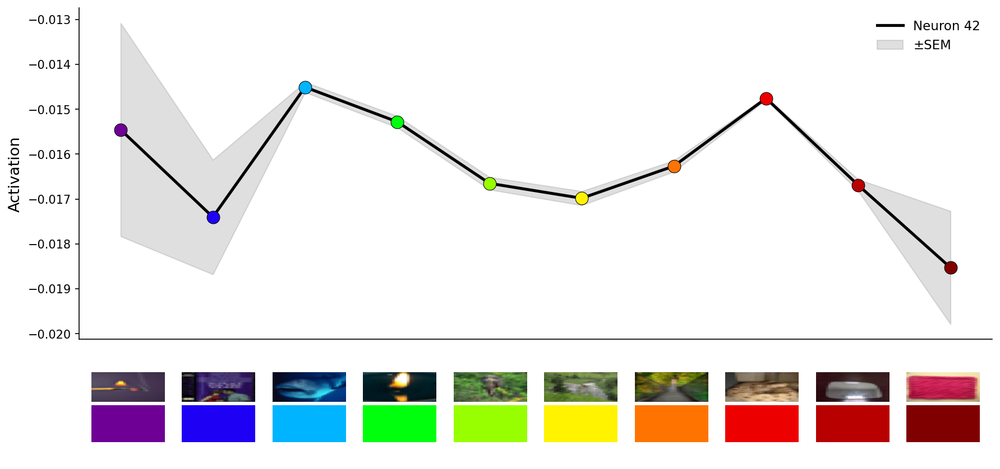

In [ ]:
# 1. Crear dataset
spectral_datasetX, spectral_datasetY = create_spectral_dataset(dataset, train_ids)

spectral_datasetX_test, spectral_datasetY_test = create_spectral_dataset(dataset, test_ids)

spectral_datasetX_val, spectral_datasetY_val = create_spectral_dataset(dataset, val_ids)


# 2. Calcular tensor [256, 10]
spectral_means, spectral_sems, counts = create_spectral_patterns(
    spectral_datasetX, spectral_datasetY, l_layer
)

# 3. Correlación con patterns sintéticos
# corr = correlate_patterns(patterns, spectral_means, l_layer)

# 4. Plot de una neurona
plot_spectral_neuron(42, spectral_means, spectral_sems,
                     spectral_datasetX, spectral_datasetY)

In [ ]:
#interesting_neurons = generated_interesting_neurons(patterns)

#all_neurons = set(range(l_layer))
#interesting_set = set(interesting_neurons)


100%|██████████| 3072/3072 [00:00<00:00, 3489.03it/s]


In [ ]:
#ccmas_layer = CCMAS(color_datasetX,color_datasetY)

556it [00:05, 103.69it/s]


In [ ]:
#len(interesting_neurons)

3072

### Experiment D

In [ ]:
layer

GELU(approximate='none')

Baseline accuracy: 83.75%
Pool de búsqueda:  4096 neuronas



SFFS ablation:   2%|▏         | 1/50 [00:04<03:30,  4.29s/it]

  [F] Step   1 | neurona 1793 | acc: 81.25% | caída acumulada: 2.50%


SFFS ablation:   4%|▍         | 2/50 [00:08<03:25,  4.27s/it]

  [F] Step   2 | neurona 1873 | acc: 79.58% | caída acumulada: 4.17%


SFFS ablation:   6%|▌         | 3/50 [00:12<03:20,  4.27s/it]

  [F] Step   3 | neurona  114 | acc: 77.92% | caída acumulada: 5.83%


SFFS ablation:   8%|▊         | 4/50 [00:17<03:17,  4.29s/it]

  [F] Step   4 | neurona  417 | acc: 76.67% | caída acumulada: 7.08%


SFFS ablation:  10%|█         | 5/50 [00:21<03:13,  4.29s/it]

  [F] Step   5 | neurona  608 | acc: 75.42% | caída acumulada: 8.33%
  [backward pruning sobre 5 neuronas]


SFFS ablation:  12%|█▏        | 6/50 [00:25<03:08,  4.30s/it]

  [F] Step   6 | neurona 1513 | acc: 74.58% | caída acumulada: 9.17%


SFFS ablation:  14%|█▍        | 7/50 [00:30<03:04,  4.29s/it]

  [F] Step   7 | neurona 1481 | acc: 73.75% | caída acumulada: 10.00%


SFFS ablation:  16%|█▌        | 8/50 [00:34<03:00,  4.30s/it]

  [F] Step   8 | neurona  367 | acc: 73.33% | caída acumulada: 10.42%


SFFS ablation:  18%|█▊        | 9/50 [00:38<02:56,  4.30s/it]

  [F] Step   9 | neurona 2373 | acc: 72.92% | caída acumulada: 10.83%


SFFS ablation:  20%|██        | 10/50 [00:42<02:51,  4.29s/it]

  [F] Step  10 | neurona 2014 | acc: 72.50% | caída acumulada: 11.25%
  [backward pruning sobre 10 neuronas]


SFFS ablation:  22%|██▏       | 11/50 [00:47<02:47,  4.30s/it]

  [F] Step  11 | neurona 2090 | acc: 72.08% | caída acumulada: 11.67%


SFFS ablation:  24%|██▍       | 12/50 [00:51<02:43,  4.29s/it]

  [F] Step  12 | neurona 2616 | acc: 71.25% | caída acumulada: 12.50%


SFFS ablation:  26%|██▌       | 13/50 [00:55<02:38,  4.29s/it]

  [F] Step  13 | neurona 2982 | acc: 69.17% | caída acumulada: 14.58%


SFFS ablation:  28%|██▊       | 14/50 [01:00<02:34,  4.29s/it]

  [F] Step  14 | neurona 2413 | acc: 67.08% | caída acumulada: 16.67%


SFFS ablation:  30%|███       | 15/50 [01:04<02:30,  4.30s/it]

  [F] Step  15 | neurona 3320 | acc: 65.00% | caída acumulada: 18.75%
  [backward pruning sobre 15 neuronas]


SFFS ablation:  32%|███▏      | 16/50 [01:08<02:26,  4.30s/it]

  [F] Step  16 | neurona   23 | acc: 64.58% | caída acumulada: 19.17%


SFFS ablation:  34%|███▍      | 17/50 [01:12<02:21,  4.30s/it]

  [F] Step  17 | neurona 1050 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  36%|███▌      | 18/50 [01:17<02:17,  4.29s/it]

  [F] Step  18 | neurona    0 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  38%|███▊      | 19/50 [01:21<02:13,  4.29s/it]

  [F] Step  19 | neurona    1 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  40%|████      | 20/50 [01:25<02:08,  4.30s/it]

  [F] Step  20 | neurona    2 | acc: 64.17% | caída acumulada: 19.58%
  [backward pruning sobre 20 neuronas]


SFFS ablation:  42%|████▏     | 21/50 [01:30<02:04,  4.30s/it]

  [F] Step  21 | neurona    3 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  44%|████▍     | 22/50 [01:34<02:00,  4.30s/it]

  [F] Step  22 | neurona    4 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  46%|████▌     | 23/50 [01:38<01:56,  4.31s/it]

  [F] Step  23 | neurona    5 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  48%|████▊     | 24/50 [01:43<01:51,  4.31s/it]

  [F] Step  24 | neurona    7 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  50%|█████     | 25/50 [01:47<01:47,  4.30s/it]

  [F] Step  25 | neurona    8 | acc: 64.17% | caída acumulada: 19.58%
  [backward pruning sobre 25 neuronas]


SFFS ablation:  52%|█████▏    | 26/50 [01:51<01:43,  4.31s/it]

  [F] Step  26 | neurona    6 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  54%|█████▍    | 27/50 [01:56<01:38,  4.30s/it]

  [F] Step  27 | neurona   16 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  56%|█████▌    | 28/50 [02:00<01:34,  4.30s/it]

  [F] Step  28 | neurona   17 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  58%|█████▊    | 29/50 [02:04<01:30,  4.29s/it]

  [F] Step  29 | neurona   12 | acc: 64.17% | caída acumulada: 19.58%


SFFS ablation:  60%|██████    | 30/50 [02:08<01:25,  4.29s/it]

  [F] Step  30 | neurona 1488 | acc: 63.75% | caída acumulada: 20.00%
  [backward pruning sobre 30 neuronas]


SFFS ablation:  62%|██████▏   | 31/50 [02:13<01:21,  4.29s/it]

  [F] Step  31 | neurona    9 | acc: 63.75% | caída acumulada: 20.00%


SFFS ablation:  64%|██████▍   | 32/50 [02:17<01:17,  4.29s/it]

  [F] Step  32 | neurona  705 | acc: 63.33% | caída acumulada: 20.42%


SFFS ablation:  66%|██████▌   | 33/50 [02:21<01:12,  4.29s/it]

  [F] Step  33 | neurona  237 | acc: 62.92% | caída acumulada: 20.83%


SFFS ablation:  68%|██████▊   | 34/50 [02:26<01:08,  4.29s/it]

  [F] Step  34 | neurona 2764 | acc: 62.50% | caída acumulada: 21.25%


SFFS ablation:  70%|███████   | 35/50 [02:30<01:04,  4.29s/it]

  [F] Step  35 | neurona 3311 | acc: 62.08% | caída acumulada: 21.67%
  [backward pruning sobre 35 neuronas]


SFFS ablation:  72%|███████▏  | 36/50 [02:34<01:00,  4.30s/it]

  [F] Step  36 | neurona   10 | acc: 62.08% | caída acumulada: 21.67%


SFFS ablation:  74%|███████▍  | 37/50 [02:38<00:55,  4.29s/it]

  [F] Step  37 | neurona 2857 | acc: 61.67% | caída acumulada: 22.08%


SFFS ablation:  76%|███████▌  | 38/50 [02:43<00:51,  4.29s/it]

  [F] Step  38 | neurona  290 | acc: 61.25% | caída acumulada: 22.50%


SFFS ablation:  78%|███████▊  | 39/50 [02:47<00:47,  4.29s/it]

  [F] Step  39 | neurona   58 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  80%|████████  | 40/50 [02:51<00:42,  4.29s/it]

  [F] Step  40 | neurona   11 | acc: 60.83% | caída acumulada: 22.92%
  [backward pruning sobre 40 neuronas]


SFFS ablation:  82%|████████▏ | 41/50 [02:56<00:38,  4.30s/it]

  [F] Step  41 | neurona   13 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  84%|████████▍ | 42/50 [03:00<00:34,  4.30s/it]

  [F] Step  42 | neurona   14 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  86%|████████▌ | 43/50 [03:04<00:30,  4.30s/it]

  [F] Step  43 | neurona   15 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  88%|████████▊ | 44/50 [03:08<00:25,  4.29s/it]

  [F] Step  44 | neurona   18 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  90%|█████████ | 45/50 [03:13<00:21,  4.29s/it]

  [F] Step  45 | neurona   19 | acc: 60.83% | caída acumulada: 22.92%
  [backward pruning sobre 45 neuronas]


SFFS ablation:  92%|█████████▏| 46/50 [03:17<00:17,  4.30s/it]

  [F] Step  46 | neurona   20 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  94%|█████████▍| 47/50 [03:21<00:12,  4.30s/it]

  [F] Step  47 | neurona   21 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  96%|█████████▌| 48/50 [03:26<00:08,  4.30s/it]

  [F] Step  48 | neurona   22 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation:  98%|█████████▊| 49/50 [03:30<00:04,  4.30s/it]

  [F] Step  49 | neurona   24 | acc: 60.83% | caída acumulada: 22.92%


SFFS ablation: 100%|██████████| 50/50 [03:34<00:00,  4.30s/it]

  [F] Step  50 | neurona   25 | acc: 60.83% | caída acumulada: 22.92%
  [backward pruning sobre 50 neuronas]

=== Resultado SFFS ===
  Neuronas finales (50): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 58, 114, 237, 290, 367, 417, 608, 705, 1050, 1481, 1488, 1513, 1793, 1873, 2014, 2090, 2373, 2413, 2616, 2764, 2857, 2982, 3311, 3320]
  Accuracy con ablación: 60.83%
  Caída total:           22.92%


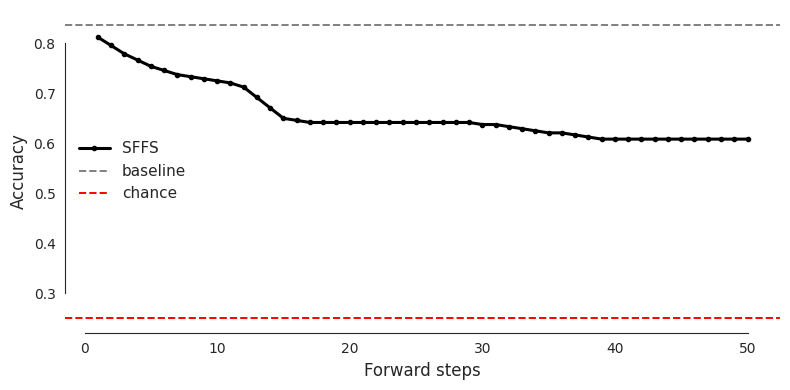

In [ ]:
greedy_ablation = greedy_ablation_search(color_datasetX, color_datasetY,color_datasetX_val,color_datasetY_val, max_neurons=50,min_acc=-1)

In [ ]:
selected = []
prev = 1
for i in range(50):
    change = prev - greedy_ablation['history'][i]['acc']
    prev = greedy_ablation['history'][i]['acc']
    if change > 0:
        selected.append(greedy_ablation['history'][i]['neuron'])


In [ ]:
print(selected)

[1793, 1873, 114, 417, 608, 1513, 1481, 367, 2373, 2014, 2090, 2616, 2982, 2413, 3320, 23, 1050, 1488, 705, 237, 2764, 3311, 2857, 290, 58]


In [ ]:
len(selected)

25

### Plots

In [ ]:
neuron_idx = selected[0] # torch.argmax(ccmas_layer[c_id])
print(neuron_idx)

1793


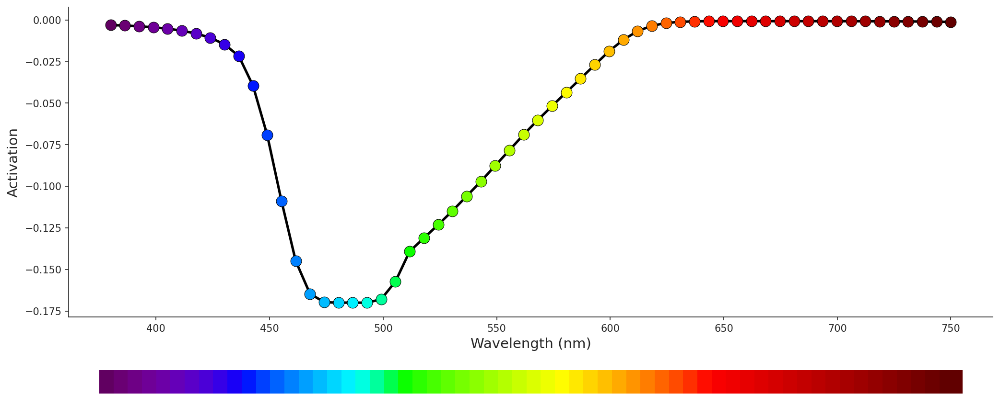

In [ ]:
# ---------------------------------------------------------
# 4. Sweep wavelengths and collect activations
# ---------------------------------------------------------

wavelengths = np.linspace(380, 750, 60)  # 40 colors across spectrum
activations = []
colors_rgb = []

for wl in wavelengths:
    rgb = wavelength_to_rgb(wl)
    colors_rgb.append(rgb)
    img = solid_color_image(rgb)
    act = N(img)[neuron_idx]
    activations.append(act.cpu().item()) # FIX: Convert tensor to CPU scalar


# ---------------------------------------------------------
# Professional plotting with stimulus bar
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 6), dpi=150)

# Main tuning curve
ax.plot(
    wavelengths,
    activations,
    color="black",
    linewidth=2.5,
    label=f"Neuron {neuron_idx}"
)

# Color-coded scatter points
for wl, act, rgb in zip(wavelengths, activations, colors_rgb):
    ax.scatter(
        wl, act,
        color=np.array(rgb)/255,
        s=120,
        edgecolor="black",
        linewidth=0.5,
        zorder=3
    )

# Labels and title
ax.set_xlabel("Wavelength (nm)", fontsize=14)
ax.set_ylabel("Activation", fontsize=14)
#ax.set_title("Spectral Tuning Curve of Neuron", fontsize=16)

# Axis cleaning
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.tick_bottom()
ax.yaxis.tick_left()

# Force layout calculation
fig.canvas.draw()

# ---------------------------------------------------------
# Stimulus bar aligned with X-axis
# ---------------------------------------------------------
bar_ax = ax.inset_axes([0, -0.30, 1, 0.18])
bar_ax.set_xlim(ax.get_xlim())
bar_ax.set_ylim(-1.2, 1.2)
bar_ax.axis("off")

for wl, rgb in zip(wavelengths, colors_rgb):
    arr = np.ones((20, 20, 3), dtype=np.uint8) * np.array(rgb)
    extent = (wl-5, wl+5, -0.5, 0.5)
    bar_ax.imshow(arr, extent=extent, aspect="auto")

    # Optional: label wavelength
    # bar_ax.text(wl, -0.7, f"{int(wl)}", ha="center", va="top", fontsize=9)

plt.tight_layout()
if type(neuron_idx) == int:
    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" + str(neuron_idx) + "_spectrum.png")
else:
    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                str(neuron_idx.cpu().item()) + "_" + "_spectrum.png")
plt.show()

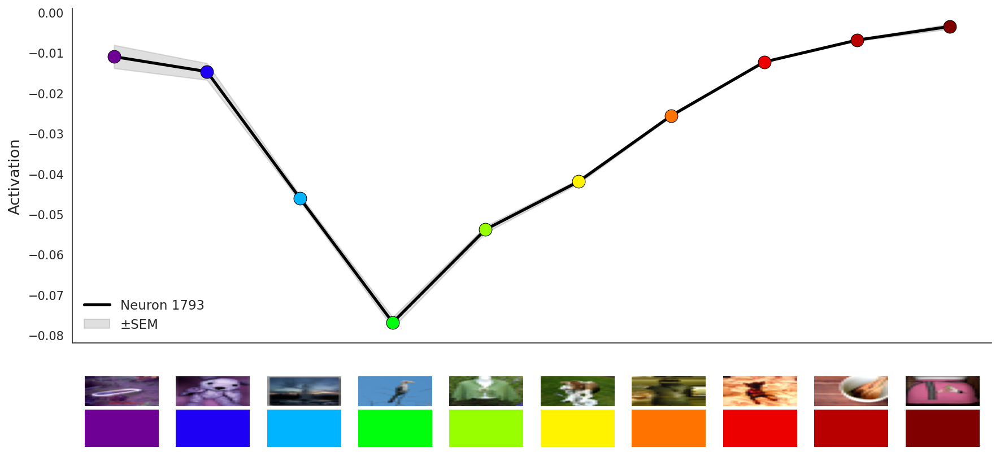

In [ ]:
plot_spectral_neuron(neuron_idx, spectral_means, spectral_sems,
                     spectral_datasetX, spectral_datasetY)

In [ ]:
classify_curve(activations)

('inhibitory', 0.00612726190369625)

In [ ]:
i_color = torch.argmax(torch.tensor(activations))

In [ ]:
i_color = torch.argmin(torch.tensor(activations))

In [ ]:
wl = wavelengths[i_color]

In [ ]:
wavelengths

array([380.        , 386.27118644, 392.54237288, 398.81355932,
       405.08474576, 411.3559322 , 417.62711864, 423.89830508,
       430.16949153, 436.44067797, 442.71186441, 448.98305085,
       455.25423729, 461.52542373, 467.79661017, 474.06779661,
       480.33898305, 486.61016949, 492.88135593, 499.15254237,
       505.42372881, 511.69491525, 517.96610169, 524.23728814,
       530.50847458, 536.77966102, 543.05084746, 549.3220339 ,
       555.59322034, 561.86440678, 568.13559322, 574.40677966,
       580.6779661 , 586.94915254, 593.22033898, 599.49152542,
       605.76271186, 612.03389831, 618.30508475, 624.57627119,
       630.84745763, 637.11864407, 643.38983051, 649.66101695,
       655.93220339, 662.20338983, 668.47457627, 674.74576271,
       681.01694915, 687.28813559, 693.55932203, 699.83050847,
       706.10169492, 712.37288136, 718.6440678 , 724.91525424,
       731.18644068, 737.45762712, 743.72881356, 750.        ])

In [ ]:
i_color

tensor(18)

In [ ]:
wl

np.float64(492.8813559322034)

### Individual study

In [ ]:
def filterDataset(color,datasetX,datasetY):
    filteredX = []
    for i in range(len(datasetX)):
        if datasetY[i] == color:
            filteredX.append(datasetX[i])
    return filteredX

In [ ]:
def color_shift_experiment(neuron_idx, images, preferred_wl,
                           n_steps=10, alpha_max=0.8,
                           use_band_center=True):
    """
    Gradually shifts the hue of each image toward the preferred wavelength
    and measures the activation of neuron_idx.

    images          : list of PIL images (e.g., top-k from tuning experiment)
    preferred_wl    : preferred wavelength in nm (380--750)
    n_steps         : number of interpolation steps (0 = original, 1 = max shift)
    alpha_max       : maximum hue shift intensity (0--1)
    use_band_center : if True, finds the spectral band containing preferred_wl
                      and uses the center of its HSV hue interval as target,
                      ensuring consistency with natural image categorization.
                      if False, derives the target hue directly via Bruton's
                      wavelength-to-RGB conversion.
    """
    from scipy.stats import spearmanr
    import colorsys

    # --- Determine target hue in HSV ---
    if use_band_center:
        preferred_band_name = None
        for name, (lo, hi) in spectral_ranges.items():
            if lo <= preferred_wl < hi:
                preferred_band_name = name
                break

        if preferred_band_name is not None:
            hue_ranges = spectral_hue_ranges[preferred_band_name]
            # Weighted center of the HSV intervals for the band
            total_len = sum(hi - lo for lo, hi in hue_ranges)
            center_hue = (sum((lo + hi) / 2 * (hi - lo)
                              for lo, hi in hue_ranges) / total_len / 360.0)
            target_h = center_hue
            target_s = 1.0
            target_v = 1.0
        else:
            # Fallback: Bruton (should not occur with valid band definitions)
            target_rgb = np.array(wavelength_to_rgb(preferred_wl)) / 255.0
            target_h, target_s, target_v = colorsys.rgb_to_hsv(*target_rgb)
    else:
        target_rgb = np.array(wavelength_to_rgb(preferred_wl)) / 255.0
        target_h, target_s, target_v = colorsys.rgb_to_hsv(*target_rgb)

    alphas = np.linspace(0, alpha_max, n_steps)

    def shift_image_hue_fast(img, alpha):
        """Interpolate each pixel's hue toward target_h by weight alpha."""
        arr = np.array(img.resize((224, 224))).astype(float) / 255.0
        h_arr = np.zeros(arr.shape[:2])
        s_arr = np.zeros(arr.shape[:2])
        v_arr = np.zeros(arr.shape[:2])
        for i in range(arr.shape[0]):
            for j in range(arr.shape[1]):
                h_arr[i, j], s_arr[i, j], v_arr[i, j] = colorsys.rgb_to_hsv(
                    arr[i, j, 0], arr[i, j, 1], arr[i, j, 2])

        # Circular hue interpolation
        dh = target_h - h_arr
        dh[dh > 0.5] -= 1.0
        dh[dh < -0.5] += 1.0
        new_h = (h_arr + alpha * dh) % 1.0
        new_s = s_arr  # saturation unchanged, preserves spatial structure

        out = np.zeros_like(arr)
        for i in range(arr.shape[0]):
            for j in range(arr.shape[1]):
                out[i, j] = colorsys.hsv_to_rgb(new_h[i, j], new_s[i, j],
                                                v_arr[i, j])
        return Image.fromarray((out * 255).astype(np.uint8))

    # --- Compute activations ---
    all_acts = []         # [n_images, n_steps]
    shifted_examples = [] # first image shifted versions for display

    for img in tqdm(images, desc="Processing images"):
        acts = []
        for alpha in alphas:
            shifted = shift_image_hue_fast(img, alpha)
            act = N(shifted)[neuron_idx].cpu().item()
            acts.append(act)
        all_acts.append(acts)

    for alpha in alphas:
        shifted_examples.append(shift_image_hue_fast(images[0], alpha))

    all_acts = np.array(all_acts)
    mean_acts = all_acts.mean(axis=0)
    sem_acts = all_acts.std(axis=0) / np.sqrt(len(images))

    # --- Spearman correlation on mean curve ---
    r, p = spearmanr(alphas, mean_acts)
    print(f"\n=== Spearman (activation vs shift intensity) ===")
    print(f"  r = {r:.3f},  p = {p:.4f}  "
          f"{'✓ significant' if p < 0.05 else '✗ not significant'}")
    print(f"  Interpretation: "
          f"{'activation increases with preferred color' if r > 0 else 'activation decreases'}")

    # --- Plot ---
    fig = plt.figure(figsize=(14, 7), dpi=150)
    gs = fig.add_gridspec(2, 1, height_ratios=[3, 1], hspace=0.0)
    ax = fig.add_subplot(gs[0])
    ax_imgs = fig.add_subplot(gs[1])

    # Individual image curves
    for acts in all_acts:
        ax.plot(alphas, acts, color="gray", alpha=0.15, linewidth=0.8)

    # Mean curve with target color
    target_color = np.array(colorsys.hsv_to_rgb(target_h, target_s, target_v))
    ax.plot(alphas, mean_acts, color=target_color, linewidth=2.5,
            label=f"Mean  (r={r:.2f}, p={p:.3f})")
    ax.fill_between(alphas, mean_acts - sem_acts, mean_acts + sem_acts,
                    alpha=0.2, color=target_color)

    ax.set_ylabel("Activation", fontsize=13)
    ax.set_xticks([])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(frameon=False, fontsize=11)

    # --- Bottom row: shifted example images ---
    ax_imgs.set_xlim(alphas[0] - 0.05, alphas[-1] + 0.05)
    ax_imgs.set_ylim(-1, 2)
    ax_imgs.axis("off")

    half = (alphas[1] - alphas[0]) * 0.4
    for i, (alpha, simg) in enumerate(zip(alphas, shifted_examples)):
        thumb = np.array(simg.resize((30, 30)))
        ax_imgs.imshow(thumb,
                       extent=(alpha - half, alpha + half, -0.5, 1.4),
                       aspect="auto")

    ax_imgs.set_xlabel(f"Color shift intensity → wavelength {preferred_wl:.0f}nm",
                       fontsize=12)

    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                str(neuron_idx) + f"_colorshift_{int(preferred_wl)}nm.png",
                bbox_inches="tight")
    plt.show()

    return all_acts, alphas, r, p

In [ ]:
# Color espectral
means, q1s, q3s, counts, all_acts = create_patterns_with_stats(
    spectral_datasetX, spectral_datasetY, l_layer
)

Imágenes por bin: [2, 6, 669, 751, 585, 495, 620, 5541, 625, 11]


Calculando activaciones: 100%|██████████| 10/10 [00:56<00:00,  5.64s/it]


In [ ]:
_, _, _, _, all_acts_val = create_patterns_with_stats(
    spectral_datasetX_val, spectral_datasetY_val, l_layer
)

_, _, _, _, all_acts_test = create_patterns_with_stats(
    spectral_datasetX_test, spectral_datasetY_test, l_layer
)

Imágenes por bin: [1, 0, 106, 110, 73, 73, 88, 764, 106, 1]


Calculando activaciones: 100%|██████████| 10/10 [00:07<00:00,  1.26it/s]


Imágenes por bin: [1, 5, 183, 167, 173, 145, 178, 1551, 209, 3]


Calculando activaciones: 100%|██████████| 10/10 [00:15<00:00,  1.57s/it]


In [ ]:
def plot_neuron_tuning(
    neuron_idx,
    # Train: for plot and visual calibration
    means, q1s, q3s, all_acts,
    datasetX, datasetY,
    # Validation: for threshold calibration (Youden index)
    all_acts_val, datasetY_val,
    # Test: for Mann-Whitney, F1, precision, recall
    all_acts_test, datasetY_test,
    # Full sweep (natural images without prior filter)
    dataset_full, test_idx,
    # Parameters
    mode="color",
    bin_labels=None,
    bin_centers=None,
    show_boxplot=1,
    filename_tag="tuning",
    alternative="greater"
):
    from scipy.stats import mannwhitneyu, kruskal
    from sklearn.metrics import (
        f1_score,
        precision_score,
        recall_score,
        roc_curve
    )

    n_bins = max(datasetY) + 1

    if bin_labels is None:
        bin_labels = [str(i) for i in range(n_bins)]

    if bin_centers is None:
        bin_centers = list(range(n_bins))

    bin_centers = np.array(bin_centers, dtype=float)

    mu = means[neuron_idx].numpy()
    q1 = q1s[neuron_idx].numpy()
    q3 = q3s[neuron_idx].numpy()

    # ============================================================
    # Direction of selectivity
    # greater  -> higher activation means positive class
    # less     -> lower activation means positive class
    # ============================================================

    score_sign = 1 if alternative == "greater" else -1

    def oriented_score(x):
        return score_sign * x

    # ============================================================
    # Activations per bin (train)
    # ============================================================

    acts_per_bin = []

    for k in range(n_bins):
        if all_acts[k] is not None:
            acts_per_bin.append(
                all_acts[k][:, neuron_idx].numpy()
            )
        else:
            acts_per_bin.append(np.array([]))

    # ============================================================
    # Preferred bin (CCMAS on train)
    # ============================================================

    sel = compute_selectivity(
        neuron_idx,
        all_acts,
        datasetY
    )

    ccmas = sel['ccmas'].copy()
    ccmas[np.isnan(ccmas)] = -np.inf

    preferred_idx = np.nanargmax(ccmas)

    bonferroni = 0.05 / (n_bins - 1)

    # ============================================================
    # Threshold calibration via Youden index on validation set
    # ============================================================

    if all_acts_val[preferred_idx] is None:
        ccmas[preferred_idx] = -np.inf
        preferred_idx = np.nanargmax(ccmas)
        bonferroni = 0.05 / (n_bins - 1)

    acts_val_preferred = (
        all_acts_val[preferred_idx][:, neuron_idx]
        .numpy()
    )

    acts_val_rest = np.concatenate([
        all_acts_val[k][:, neuron_idx].numpy()
        for k in range(n_bins)
        if (
            k != preferred_idx and
            all_acts_val[k] is not None
        )
    ])

    y_val_true = np.array(
        [1] * len(acts_val_preferred) +
        [0] * len(acts_val_rest)
    )

    # IMPORTANT:
    # invert score when alternative == "less"
    y_val_score = np.concatenate([
        oriented_score(acts_val_preferred),
        oriented_score(acts_val_rest)
    ])

    fpr, tpr, thresholds = roc_curve(
        y_val_true,
        y_val_score
    )

    youden_idx = np.argmax(tpr - fpr)

    threshold_oriented = thresholds[youden_idx]

    # threshold in original activation space
    threshold = threshold_oriented * score_sign

    print(f"\n=== Neuron {neuron_idx} — Selectivity report ===")
    print(f"  Preferred bin : {bin_labels[preferred_idx]}")
    print(
        f"  Youden threshold (val): {threshold:.4f}  "
        f"(TPR={tpr[youden_idx]:.3f}, "
        f"FPR={fpr[youden_idx]:.3f})"
    )

    # ============================================================
    # Mann-Whitney on test set
    # ============================================================

    acts_test_preferred = (
        all_acts_test[preferred_idx][:, neuron_idx]
        .numpy()
    )

    acts_test_rest_bins = [
        all_acts_test[k][:, neuron_idx].numpy()
        for k in range(n_bins)
        if (
            k != preferred_idx and
            all_acts_test[k] is not None
        )
    ]

    acts_test_rest = np.concatenate(
        acts_test_rest_bins
    )

    # Kruskal-Wallis across all bins
    all_test_bins = [
        all_acts_test[k][:, neuron_idx].numpy()
        for k in range(n_bins)
        if all_acts_test[k] is not None
    ]

    kw_stat, kw_p = kruskal(*all_test_bins)

    print(
        f"\n  Kruskal-Wallis (test): "
        f"H={kw_stat:.3f}, p={kw_p:.4f} "
        f"{'✓' if kw_p < 0.05 else '✗'}"
    )

    print(
        f"\n  {'Bin':<15} "
        f"{'CCMAS':>8} "
        f"{'d-prime':>8} "
        f"{'MW p (one-sided)':>18} "
        f"{'sig':>5}"
    )

    for i, label in enumerate(bin_labels):

        if i == preferred_idx:
            print(
                f"  {label:<15} "
                f"{sel['ccmas'][i]:>8.3f} "
                f"{sel['dprime'][i]:>8.3f} "
                f"{'—':>18} {'★':>5}"
            )
            continue

        if (
            all_acts_test[i] is None or
            len(all_acts_test[i]) == 0
        ):
            continue

        acts_i = (
            all_acts_test[i][:, neuron_idx]
            .numpy()
        )

        _, mw_p = mannwhitneyu(
            acts_test_preferred,
            acts_i,
            alternative=alternative
        )

        sig = "✓" if mw_p < bonferroni else "✗"

        d = sel['dprime'][i]

        print(
            f"  {label:<15} "
            f"{sel['ccmas'][i]:>8.3f} "
            f"{d:>8.3f} "
            f"{mw_p:>18.4f} "
            f"{sig:>5}"
        )

    # ============================================================
    # F1 / Precision / Recall on test set
    # ============================================================

    print(
        f"\n  --- Classification metrics on test set "
        f"(threshold={threshold:.4f}) ---"
    )

    print(
        f"  {'vs bin':<15} "
        f"{'Precision':>10} "
        f"{'Recall':>8} "
        f"{'F1':>8}"
    )

    for i, label in enumerate(bin_labels):

        if (
            i == preferred_idx or
            all_acts_test[i] is None
        ):
            continue

        acts_i = (
            all_acts_test[i][:, neuron_idx]
            .numpy()
        )

        y_true = np.array(
            [1] * len(acts_test_preferred) +
            [0] * len(acts_i)
        )

        y_score = np.concatenate([
            acts_test_preferred,
            acts_i
        ])

        # IMPORTANT:
        # oriented comparison
        y_pred = (
            oriented_score(y_score)
            >= threshold_oriented
        ).astype(int)

        prec = precision_score(
            y_true,
            y_pred,
            zero_division=0
        )

        rec = recall_score(
            y_true,
            y_pred,
            zero_division=0
        )

        f1 = f1_score(
            y_true,
            y_pred,
            zero_division=0
        )

        print(
            f"  {label:<15} "
            f"{prec:>10.3f} "
            f"{rec:>8.3f} "
            f"{f1:>8.3f}"
        )

    # ============================================================
    # Global metrics
    # ============================================================

    y_true_global = np.array(
        [1] * len(acts_test_preferred) +
        [0] * len(acts_test_rest)
    )

    y_score_global = np.concatenate([
        acts_test_preferred,
        acts_test_rest
    ])

    y_pred_global = (
        oriented_score(y_score_global)
        >= threshold_oriented
    ).astype(int)

    prec_g = precision_score(
        y_true_global,
        y_pred_global,
        zero_division=0
    )

    rec_g = recall_score(
        y_true_global,
        y_pred_global,
        zero_division=0
    )

    f1_g = f1_score(
        y_true_global,
        y_pred_global,
        zero_division=0
    )

    print(
        f"  {'[global]':<15} "
        f"{prec_g:>10.3f} "
        f"{rec_g:>8.3f} "
        f"{f1_g:>8.3f}"
    )

    # ============================================================
    # Full sweep on natural images
    # ============================================================

    print(f"\n  --- Full sweep on natural images (test_idx) ---")

    preferred_wl_lo, preferred_wl_hi = (
        list(spectral_ranges.values())[preferred_idx]
    )

    acts_sweep_pos = []
    acts_sweep_neg = []

    for i in tqdm(
        test_idx,
        desc="Full sweep",
        leave=False
    ):

        img = dataset_full[i][0]

        arr = (
            np.array(img.resize((64, 64)))
            .astype(np.float32) / 255.0
        )

        arr_flat = arr.reshape(-1, 3)

        hsv_arr = np.array([
            colorsys.rgb_to_hsv(*p)
            for p in arr_flat
        ])

        h_vals = hsv_arr[:, 0] * 360
        s_vals = hsv_arr[:, 1]

        if s_vals.mean() < 0.3:
            continue

        intervals = spectral_hue_ranges[
            bin_labels[preferred_idx]
        ]

        mask = np.zeros(
            len(h_vals),
            dtype=bool
        )

        for lo, hi in intervals:
            mask |= (
                (h_vals >= lo) &
                (h_vals < hi)
            )

        proportion = mask.mean()

        act = N(img)[neuron_idx].cpu().item()

        if proportion >= 0.5:
            acts_sweep_pos.append(act)
        else:
            acts_sweep_neg.append(act)

    acts_sweep_pos = np.array(acts_sweep_pos)
    acts_sweep_neg = np.array(acts_sweep_neg)

    _, mw_sweep = mannwhitneyu(
        acts_sweep_pos,
        acts_sweep_neg,
        alternative=alternative
    )

    y_true_sweep = np.array(
        [1] * len(acts_sweep_pos) +
        [0] * len(acts_sweep_neg)
    )

    y_score_sweep = np.concatenate([
        acts_sweep_pos,
        acts_sweep_neg
    ])

    y_pred_sweep = (
        oriented_score(y_score_sweep)
        >= threshold_oriented
    ).astype(int)

    prec_sw = precision_score(
        y_true_sweep,
        y_pred_sweep,
        zero_division=0
    )

    rec_sw = recall_score(
        y_true_sweep,
        y_pred_sweep,
        zero_division=0
    )

    f1_sw = f1_score(
        y_true_sweep,
        y_pred_sweep,
        zero_division=0
    )

    print(
        f"  Positive (color match) : "
        f"n={len(acts_sweep_pos)}, "
        f"mean={acts_sweep_pos.mean():.3f}"
    )

    print(
        f"  Negative (no match)    : "
        f"n={len(acts_sweep_neg)}, "
        f"mean={acts_sweep_neg.mean():.3f}"
    )

    print(
        f"  Mann-Whitney (one-sided): "
        f"p={mw_sweep:.4f} "
        f"{'✓' if mw_sweep < 0.05 else '✗'}"
    )

    print(
        f"  Precision={prec_sw:.3f}  "
        f"Recall={rec_sw:.3f}  "
        f"F1={f1_sw:.3f}"
    )

    # ============================================================
    # Plot
    # ============================================================

    def get_point_color(b_idx):

        if mode == "color":
            rgb = wavelength_to_rgb(
                bin_centers[b_idx]
            )
            return np.array(rgb) / 255

        elif mode == "intensity":
            lum = bin_centers[b_idx]
            return (lum, lum, lum)

        else:
            return "black"

    half = (
        (bin_centers[1] - bin_centers[0]) * 0.35
        if n_bins > 1 else 0.3
    )

    span = bin_centers[-1] - bin_centers[0]
    pad = span * 0.08

    bins_imgs = {i: [] for i in range(n_bins)}

    for img, y in zip(datasetX, datasetY):
        bins_imgs[y].append(img)

    if mode == "blur":
        fig, ax = plt.subplots(
            figsize=(14, 7),
            dpi=150
        )
    else:
        fig = plt.figure(
            figsize=(14, 7),
            dpi=150
        )

        gs = fig.add_gridspec(
            2, 1,
            height_ratios=[3, 1],
            hspace=0.0
        )

        ax = fig.add_subplot(gs[0])
        ax_imgs = fig.add_subplot(gs[1])

    # threshold line
    ax.axhline(
        threshold,
        color="black",
        linestyle=":",
        linewidth=1.2,
        alpha=0.6,
        label=f"Youden threshold ({threshold:.3f})"
    )

    for b_idx in range(n_bins):

        acts = acts_per_bin[b_idx]

        if len(acts) == 0:
            continue

        xpos = bin_centers[b_idx]

        color = get_point_color(b_idx)

        jitter = np.random.uniform(
            -half * 0.4,
            half * 0.4,
            size=len(acts)
        )

        if show_boxplot in (0, 1):

            ax.scatter(
                xpos + jitter,
                acts,
                color=color,
                s=25,
                alpha=0.5 if show_boxplot == 1 else 0.8,
                edgecolor="none",
                zorder=2
            )

        if show_boxplot in (1, 2):

            box_alpha = (
                0.6 if show_boxplot == 1 else 1.0
            )

            c = (
                color if isinstance(color, str)
                else tuple(color)
            )

            ax.boxplot(
                acts,
                positions=[xpos],
                widths=half * 1.2,
                patch_artist=True,
                manage_ticks=False,
                medianprops=dict(
                    color="black",
                    linewidth=2
                ),
                boxprops=dict(
                    facecolor=c,
                    alpha=box_alpha
                ),
                whiskerprops=dict(
                    linewidth=1.2
                ),
                capprops=dict(
                    linewidth=1.2
                ),
                flierprops=dict(
                    marker="",
                    linestyle="none"
                ),
                zorder=3
            )

        ax.scatter(
            xpos,
            mu[b_idx],
            color=color,
            s=100,
            edgecolor="black",
            linewidth=1.2,
            zorder=4,
            marker="D"
        )

    ax.plot(
        bin_centers,
        mu,
        color="black",
        linewidth=1.5,
        linestyle="--",
        alpha=0.5,
        zorder=1
    )

    ax.axvspan(
        bin_centers[preferred_idx] - half,
        bin_centers[preferred_idx] + half,
        alpha=0.08,
        color="gold",
        zorder=0
    )

    ax.set_ylabel(
        "Activation",
        fontsize=13
    )

    ax.set_xticks([])

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=9
    )

    if mode == "blur":
        pass

    else:

        ax_imgs.set_xlim(
            bin_centers[0] - pad,
            bin_centers[-1] + pad
        )

        ax_imgs.set_ylim(-1, 2)
        ax_imgs.axis("off")

        for b_idx, (xpos, label) in enumerate(
            zip(bin_centers, bin_labels)
        ):

            imgs_bin = bins_imgs[b_idx]

            if imgs_bin:
                simg = random.choice(imgs_bin)

                thumb = np.array(
                    simg.resize((30, 30))
                )

                ax_imgs.imshow(
                    thumb,
                    extent=(
                        xpos - half,
                        xpos + half,
                        0.3,
                        1.4
                    ),
                    aspect="auto"
                )

            if mode == "color":

                rgb = wavelength_to_rgb(xpos)

                arr = (
                    np.ones((10, 10, 3),
                    dtype=np.uint8)
                    * np.array(rgb)
                )

            else:

                gray_val = int(xpos * 255)

                arr = (
                    np.ones((10, 10, 3),
                    dtype=np.uint8)
                    * gray_val
                )

            ax_imgs.imshow(
                arr,
                extent=(
                    xpos - half,
                    xpos + half,
                    -0.5,
                    0.5
                ),
                aspect="auto"
            )

            ax_imgs.text(
                xpos,
                -0.65,
                label,
                ha="center",
                va="top",
                fontsize=8,
                color="black"
            )

    plt.savefig(
        path + "/figures/" +
        MODEL + "_" +
        layer_name + "_" +
        str(neuron_idx) +
        f"_{filename_tag}.png",
        bbox_inches="tight"
    )

    plt.show()

    return {
        "threshold": threshold,
        "preferred_idx": preferred_idx,
        "preferred_label": bin_labels[preferred_idx],

        "kw_stat": kw_stat,
        "kw_p": kw_p,

        "f1_global": f1_g,
        "prec_global": prec_g,
        "rec_global": rec_g,

        "f1_sweep": f1_sw,
        "prec_sweep": prec_sw,
        "rec_sweep": rec_sw,

        "mw_sweep_p": mw_sweep,
    }


=== Neuron 1793 — Selectivity report ===
  Preferred bin : cyan
  Youden threshold (val): -0.0378  (TPR=0.964, FPR=0.144)

  Kruskal-Wallis (test): H=1780.406, p=0.0000 ✓

  Bin                CCMAS  d-prime   MW p (one-sided)   sig
  violet            -0.384    0.769             0.0060     ✗
  indigo            -0.254    0.554             0.0000     ✓
  blue               0.334   -1.024             0.0000     ✓
  cyan               0.587   -2.001                  —     ★
  green              0.407   -1.403             0.0000     ✓
  chartreuse         0.279   -0.929             0.0000     ✓
  yellow             0.021   -0.055             0.0000     ✓
  orange            -0.554    1.381             0.0000     ✓
  red               -0.582    1.034             0.0000     ✓
  deep_red          -0.753    1.195             0.0000     ✓

  --- Classification metrics on test set (threshold=-0.0378) ---
  vs bin           Precision   Recall       F1
  violet               1.000    0.862    0.

  Positive (color match) : n=167, mean=-0.081
  Negative (no match)    : n=4437, mean=-0.022
  Mann-Whitney (one-sided): p=0.0000 ✓
  Precision=0.193  Recall=0.862  F1=0.316


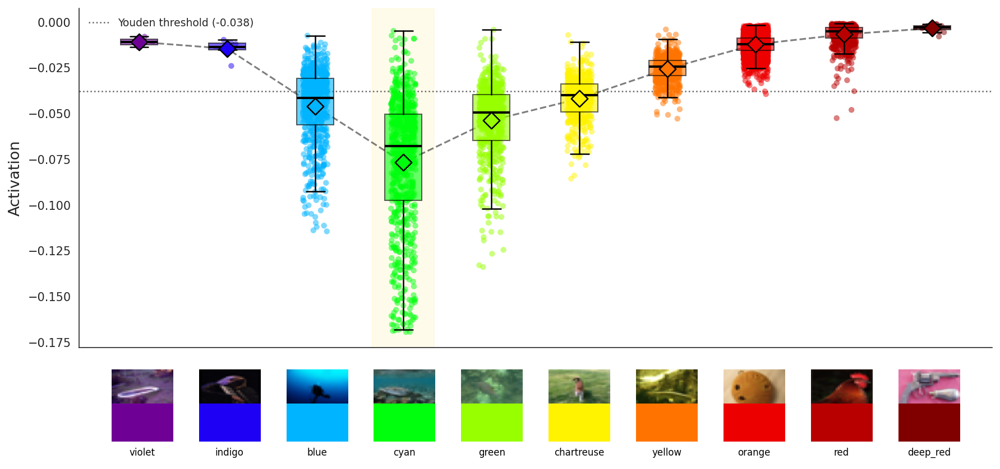

In [ ]:
output_tuning = plot_neuron_tuning(
    neuron_idx,
    # Train: for plot and visual calibration
    means, q1s, q3s, all_acts,
    spectral_datasetX, spectral_datasetY,
    # Validation: for threshold calibration (Youden index)
    all_acts_val, spectral_datasetY_val,
    # Test: for Mann-Whitney, F1, precision, recall
    all_acts_test, spectral_datasetY_test,
    # Full sweep (natural images without prior filter)
    dataset, test_ids,
    # Parameters
    mode="color",
    bin_labels=list(spectral_ranges.keys()),
    bin_centers=[np.mean(v) for v in spectral_ranges.values()],
    show_boxplot=1,
    filename_tag="tuning",
    alternative= "less"
)

In [ ]:
len(all_acts_val)

10

In [ ]:
output_tuning

{'threshold': np.float32(0.22336394),
 'preferred_idx': np.int64(4),
 'preferred_label': 'green',
 'kw_stat': np.float64(1432.852069295217),
 'kw_p': np.float64(6.16177547319235e-303),
 'f1_global': 0.4938650306748466,
 'prec_global': 0.33611691022964507,
 'rec_global': 0.930635838150289,
 'f1_sweep': 0.28146853146853146,
 'prec_sweep': 0.16580844490216273,
 'rec_sweep': 0.930635838150289,
 'mw_sweep_p': np.float64(4.214939884978933e-88)}

In [ ]:
output_tuning['preferred_idx']

In [ ]:
selected_color = output_tuning['preferred_label']
wl2 = (spectral_ranges[selected_color][0] + spectral_ranges[selected_color][1]	)/ 2
wl2

509.5

In [ ]:
print(wl)

492.8813559322034


In [ ]:
abs(wl2-wl)

np.float64(16.618644067796595)

Scoring: 100%|██████████| 10000/10000 [01:00<00:00, 164.85it/s]


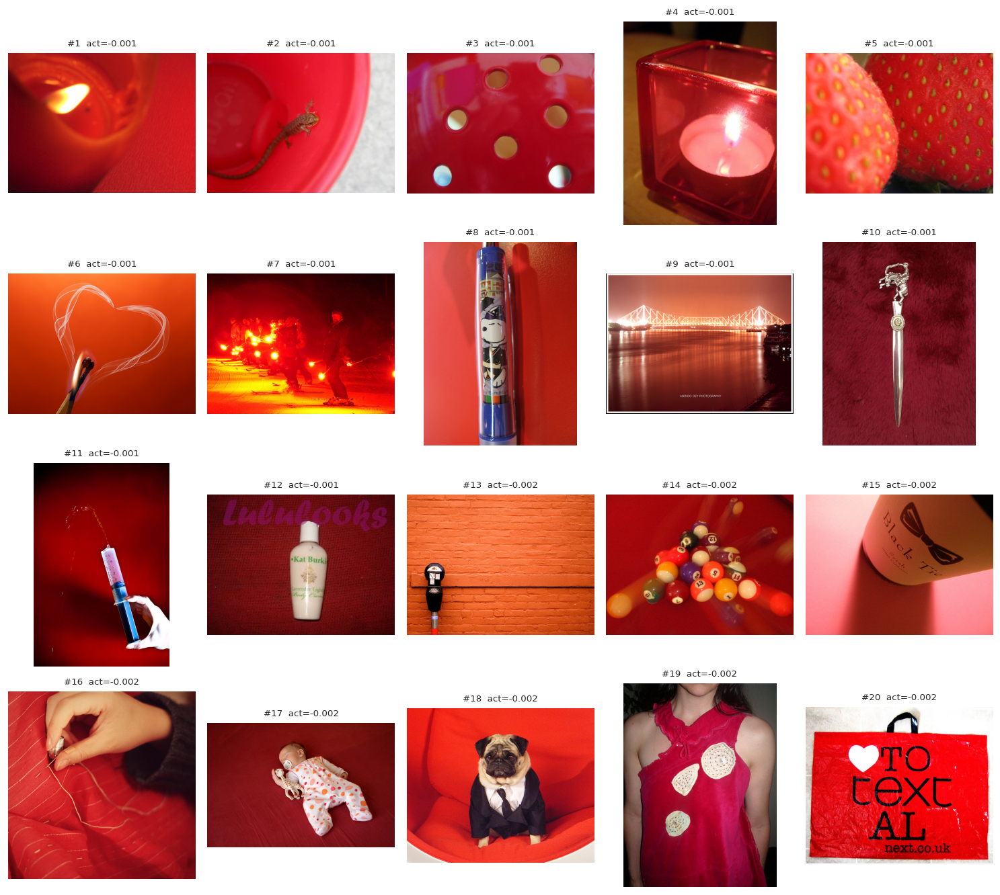

In [ ]:
top = top_k_activations(neuron_idx, datasetX=[dataset[i][0] for i in test_ids],
                         k=20, cols=5)

Scoring: 100%|██████████| 10000/10000 [01:00<00:00, 165.06it/s]


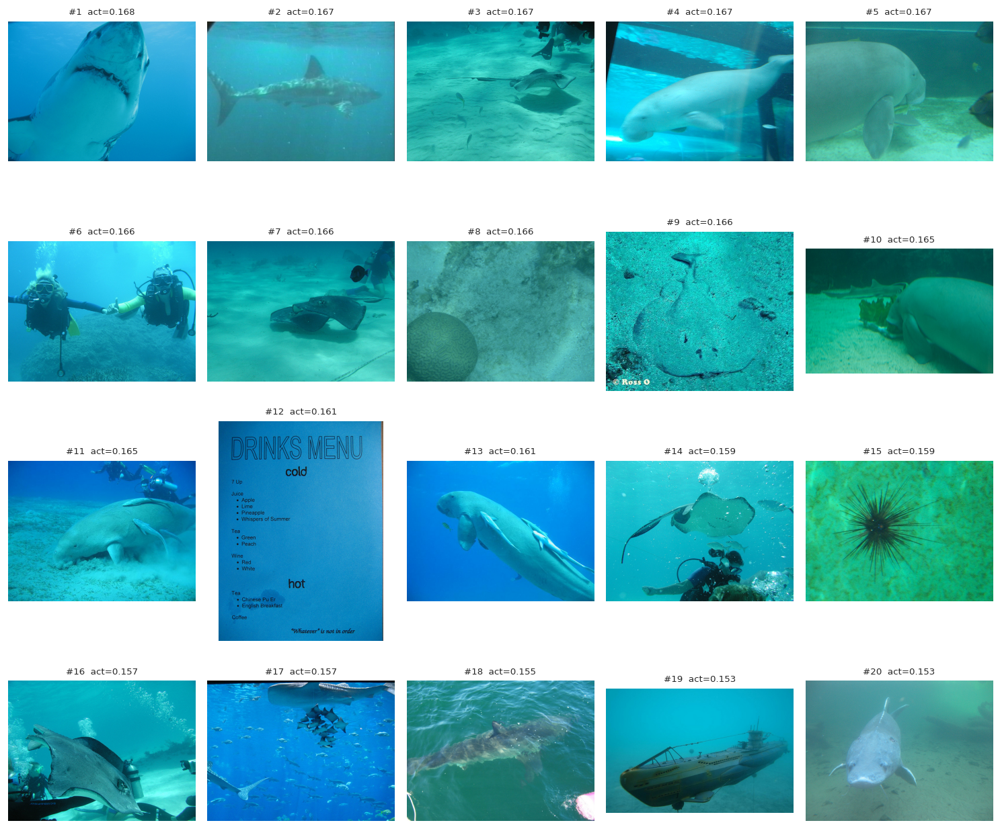

In [ ]:
top = top_k_activations(neuron_idx, datasetX=[dataset[i][0] for i in test_ids],
                         k=20, cols=5,mode="min")

In [ ]:
output_tuning['preferred_idx']

np.int64(4)

In [ ]:
wl

np.float64(492.8813559322034)

In [ ]:
filter_X_top = filterDataset(output_tuning['preferred_idx'],spectral_datasetX_test,spectral_datasetY_test)

Scoring: 100%|██████████| 167/167 [00:01<00:00, 156.41it/s]


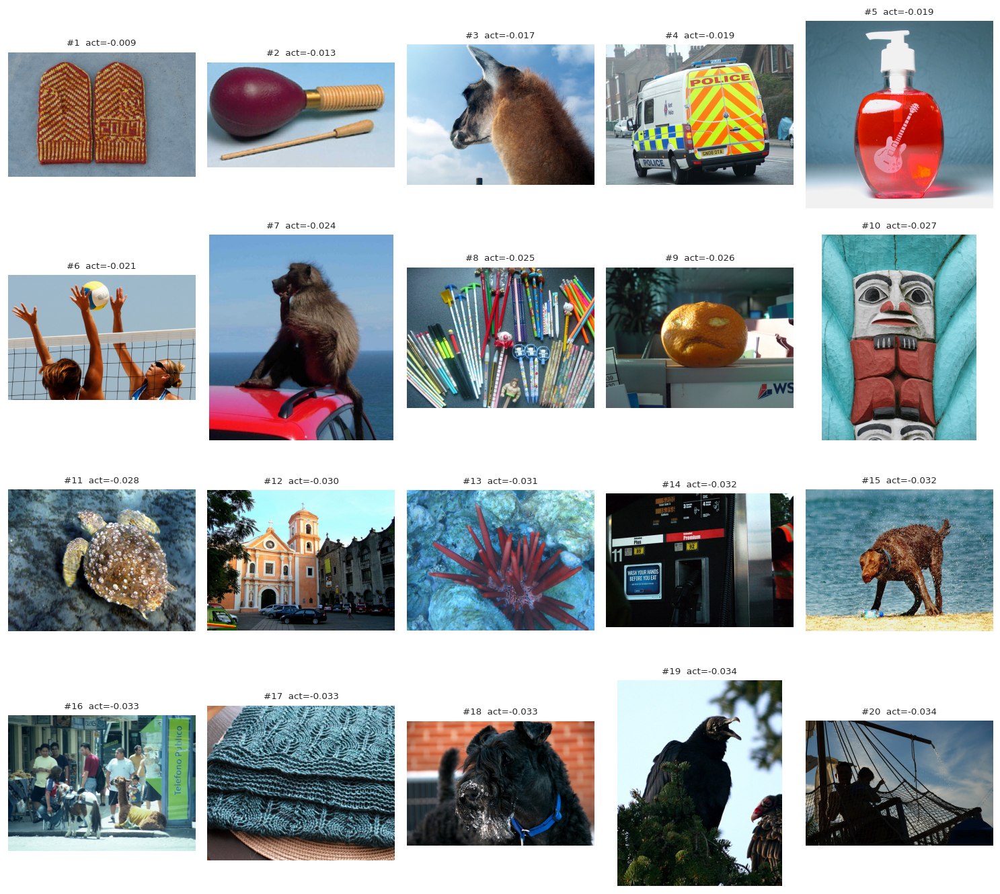

In [ ]:
top_max = top_k_activations(neuron_idx, datasetX=filter_X_top,
                         k=20, cols=5, mode="max")

Scoring: 100%|██████████| 167/167 [00:01<00:00, 158.70it/s]


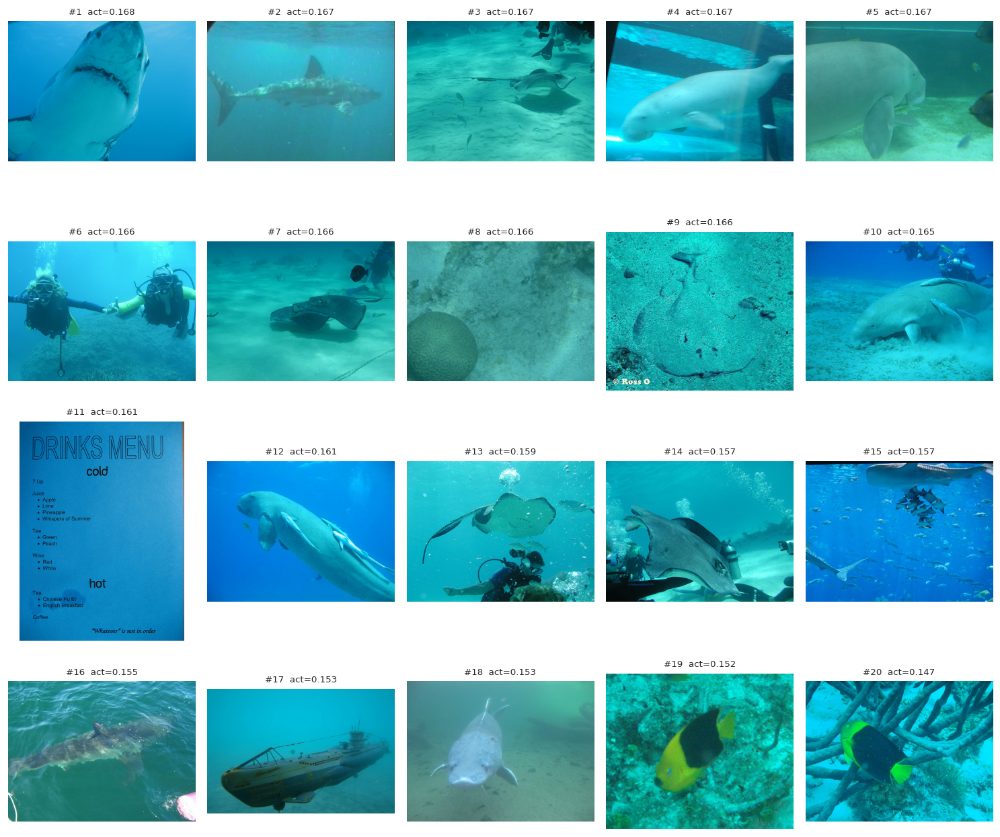

In [ ]:
top_min = top_k_activations(neuron_idx, datasetX=filter_X_top,
                         k=20, cols=5, mode="min")

Processing images: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


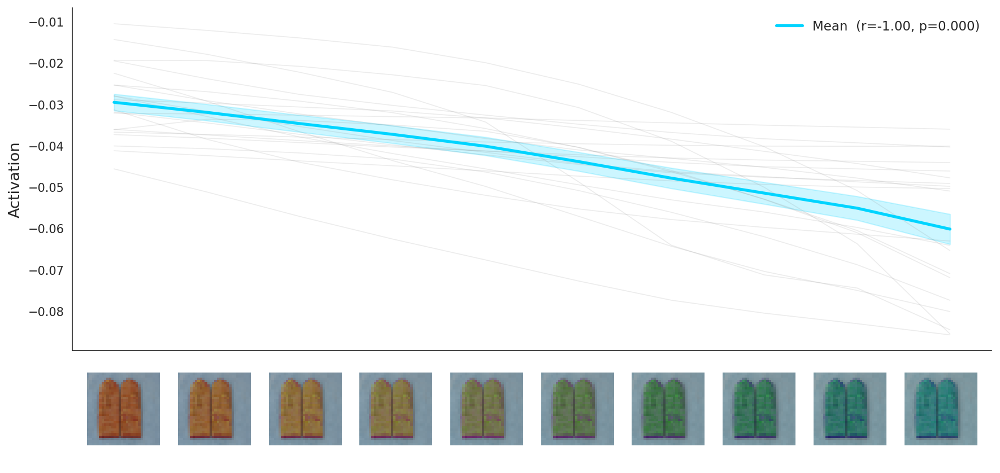

In [ ]:
# Extraer las imágenes
top_images = [filter_X_top[idx] for _, idx in top_max]

# Experimento de shift
all_acts, alphas, r, p = color_shift_experiment(
    neuron_idx  = neuron_idx,
    images      = top_images,
    preferred_wl= wl2,   # wavelength preferido en nm
    n_steps     = 10,
    alpha_max   = 0.8,
    use_band_center=True
)

In [ ]:
wavelengths[i_color]

np.float64(492.8813559322034)

In [ ]:
wl2

509.5

Processing images: 100%|██████████| 20/20 [00:19<00:00,  1.03it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


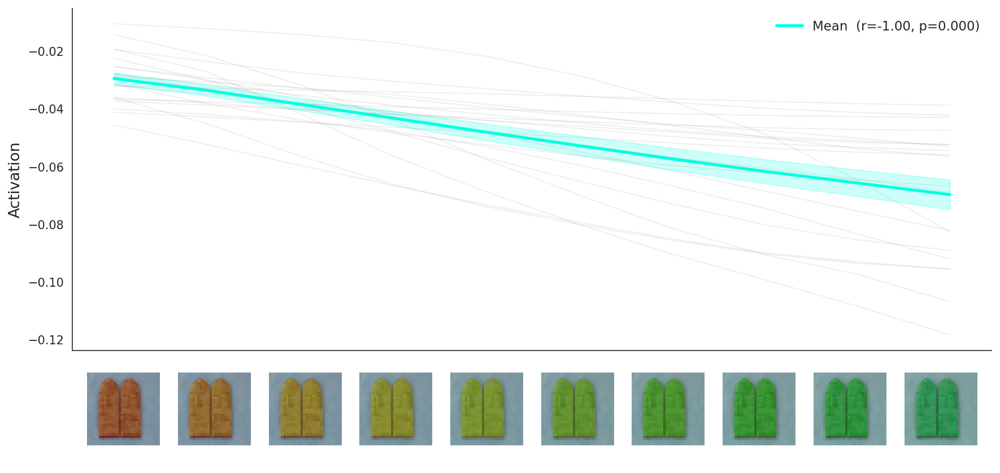

In [ ]:
# Extraer las imágenes
top_images = [filter_X_top[idx] for _, idx in top_max]

# Experimento de shift
all_acts, alphas, r, p = color_shift_experiment(
    neuron_idx  = neuron_idx,
    images      = top_images,
    preferred_wl= wavelengths[i_color],   # wavelength preferido en nm
    n_steps     = 10,
    alpha_max   = 0.8,
    use_band_center=False
)

Processing images: 100%|██████████| 20/20 [00:19<00:00,  1.01it/s]



=== Spearman (activation vs shift intensity) ===
  r = -0.988,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


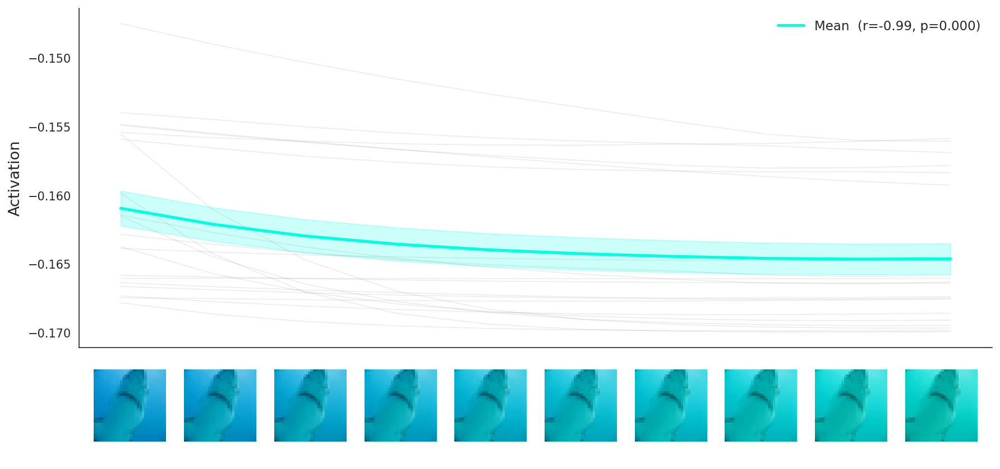

In [ ]:
# Extraer las imágenes
top_images = [filter_X_top[idx] for _, idx in top_min]

# Experimento de shift
all_acts, alphas, r, p = color_shift_experiment(
    neuron_idx  = neuron_idx,
    images      = top_images,
    preferred_wl= wl,   # wavelength preferido en nm
    n_steps     = 10,
    alpha_max   = 0.8,
    use_band_center=False
)

Processing images: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


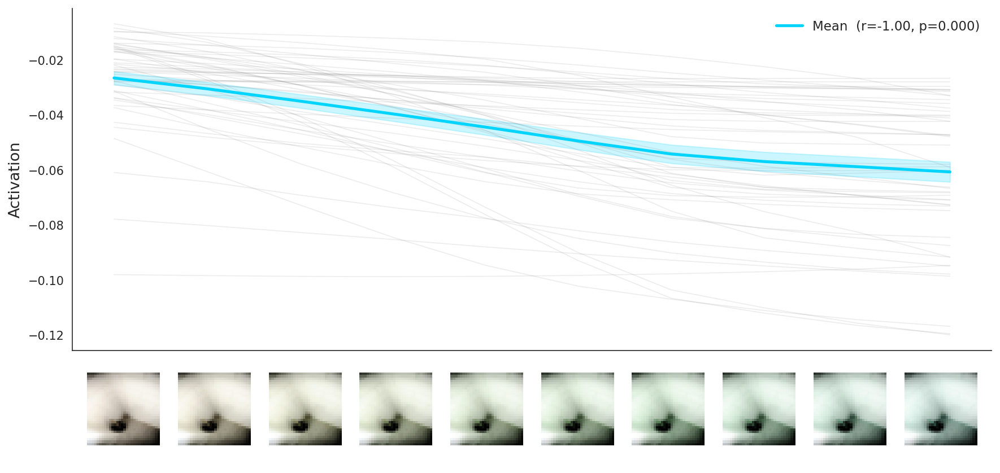

509.5


In [ ]:
top_g = random.sample(range(l_layer), 50)

# Extraer las imágenes
top_images = [dataset[test_ids[idx]][0] for idx in top_g]

# Experimento de shift
all_acts, alphas, r, p = color_shift_experiment(
    neuron_idx  = neuron_idx,
    images      = top_images,
    preferred_wl= wl2,   # wavelength preferido en nm
    n_steps     = 10,
    alpha_max   = 0.8,
    use_band_center=True
)
print(wl2)

Processing images: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


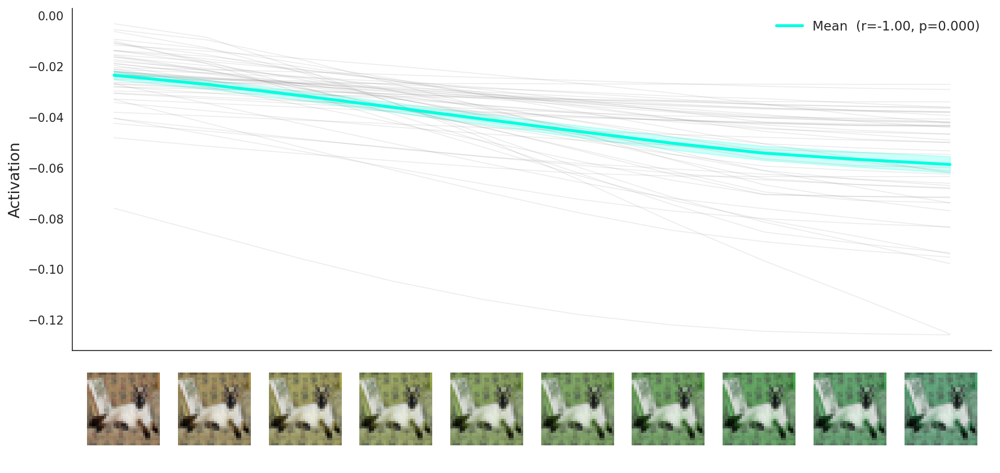

492.8813559322034 -0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


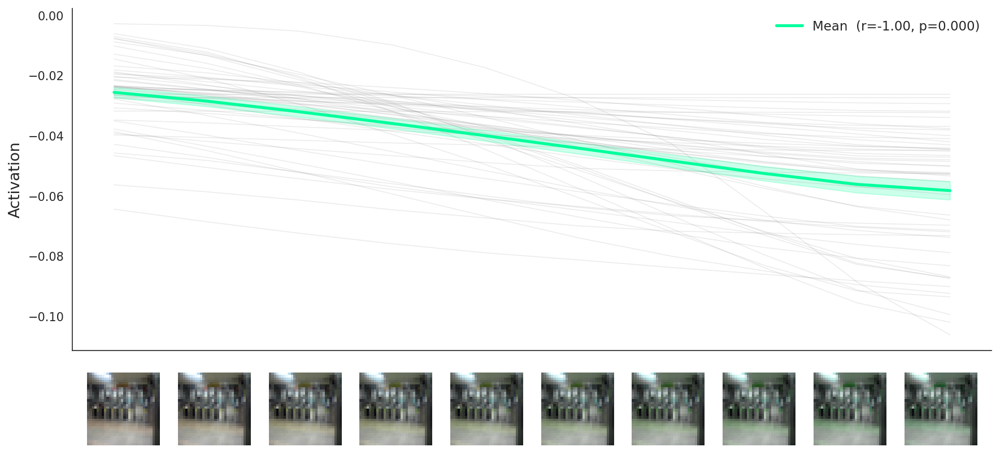

492.8813559322034 -0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


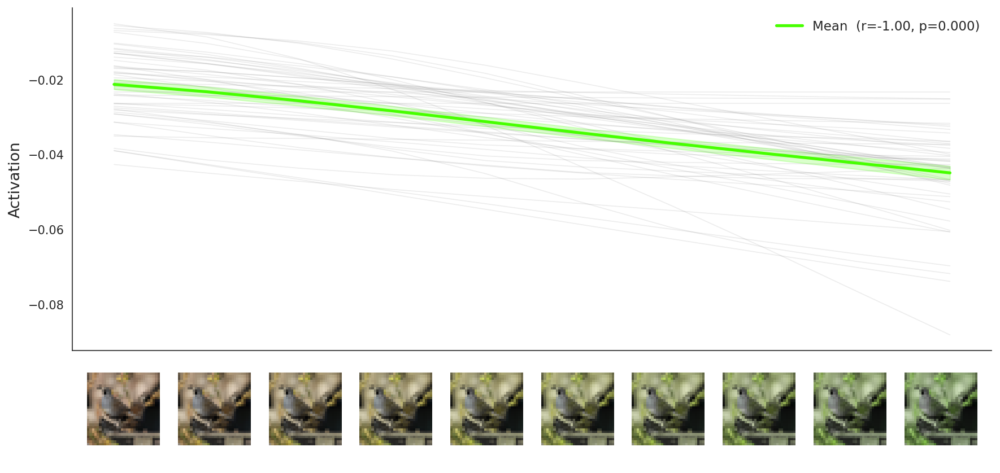

492.8813559322034 -0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


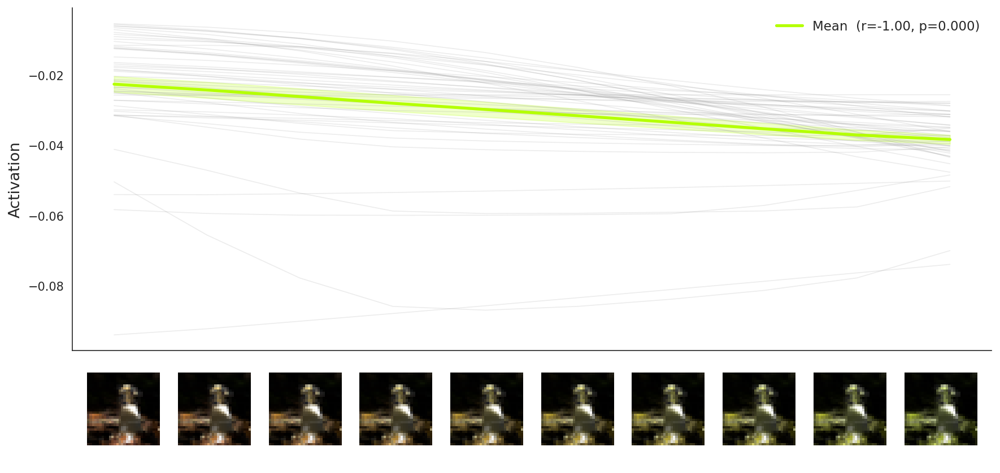

492.8813559322034 -0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]



=== Spearman (activation vs shift intensity) ===
  r = 1.000,  p = 0.0000  ✓ significant
  Interpretation: activation increases with preferred color


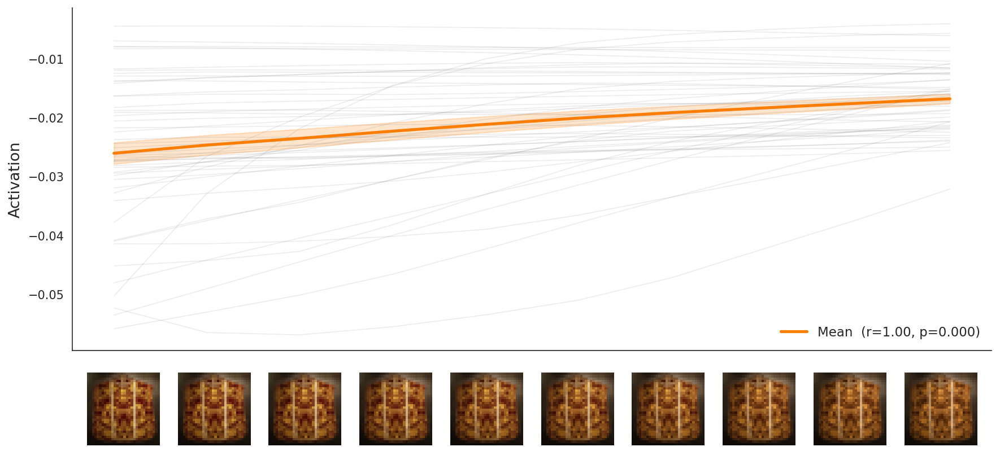

492.8813559322034 0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


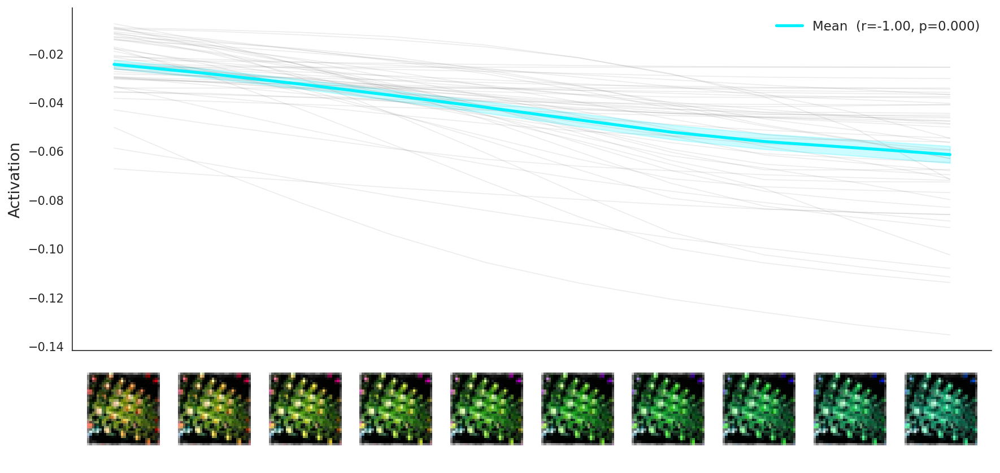

492.8813559322034 -0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]



=== Spearman (activation vs shift intensity) ===
  r = -1.000,  p = 0.0000  ✓ significant
  Interpretation: activation decreases


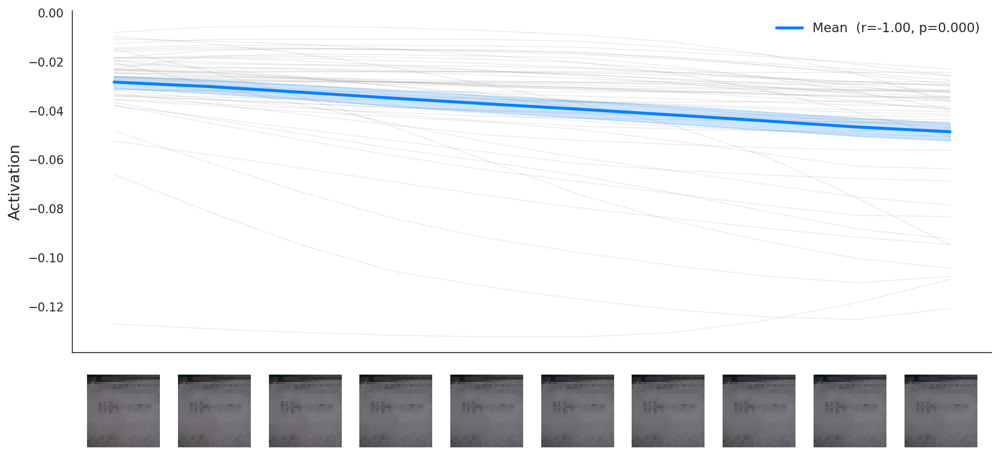

492.8813559322034 -0.9999999999999999 6.646897422032013e-64


Processing images: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]



=== Spearman (activation vs shift intensity) ===
  r = 0.964,  p = 0.0000  ✓ significant
  Interpretation: activation increases with preferred color


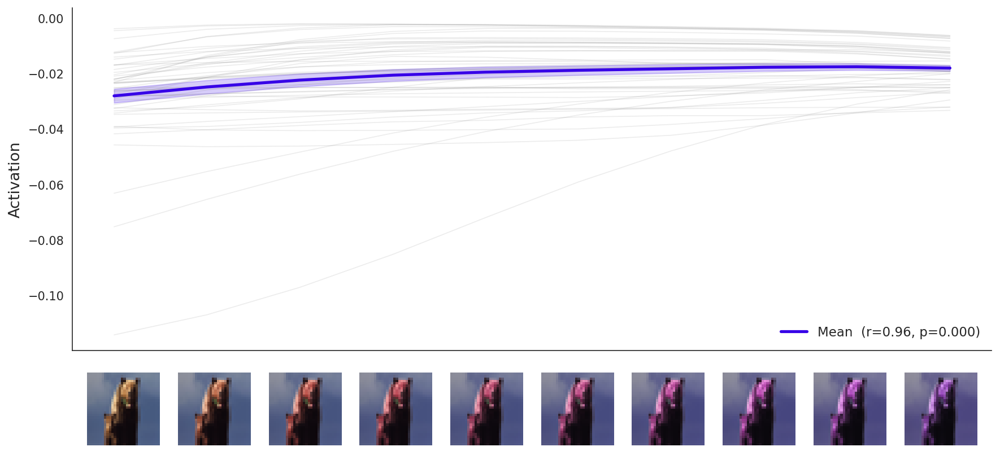

492.8813559322034 0.9636363636363635 7.320974809529922e-06


Processing images: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]



=== Spearman (activation vs shift intensity) ===
  r = 1.000,  p = 0.0000  ✓ significant
  Interpretation: activation increases with preferred color


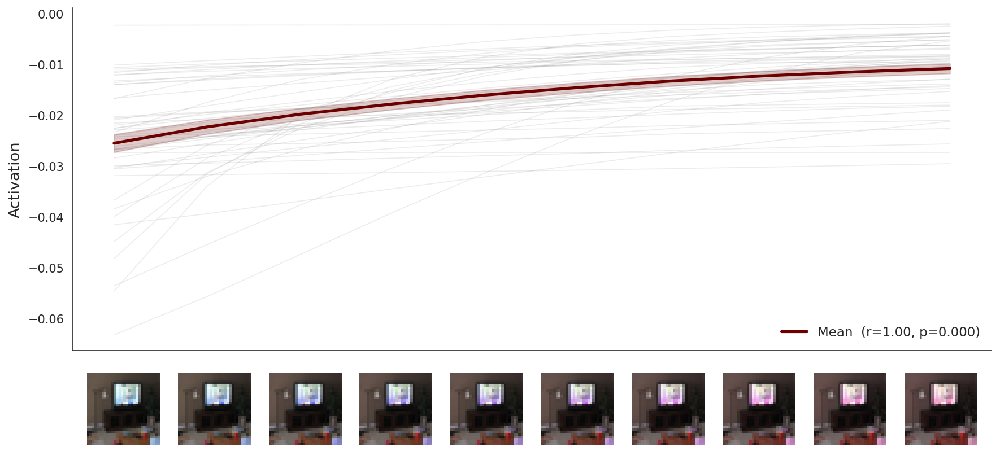

492.8813559322034 0.9999999999999999 6.646897422032013e-64


In [ ]:
# MOST RELEVANT

COLOR_SUM = [0,1,5,10,20,-1,-5,-10,-20]

Rs = []
Ps = []
WLs= []

for sum_color in COLOR_SUM:
    top_g = random.sample(range(l_layer), 50)

    # Extraer las imágenes
    top_images = [dataset[test_ids[idx]][0] for idx in top_g]

    # Experimento de shift
    all_acts, alphas, r, p = color_shift_experiment(
        neuron_idx  = neuron_idx,
        images      = top_images,
        preferred_wl= wavelengths[i_color+sum_color],   # wavelength preferido en nm
        n_steps     = 10,
        alpha_max   = 0.8,
        use_band_center=False
    )
    print(wl,r,p)
    Rs.append(r)
    Ps.append(p)
    WLs.append(wavelengths[i_color+sum_color])

In [ ]:
for i in range(len(Ps)):
    print(f"{int(WLs[i])}\t\t{round(Ps[i],4)}\t\t{round(Rs[i],4)}")

492		0.0		-1.0
499		0.0		-1.0
524		0.0		-1.0
555		0.0		-1.0
618		0.0		1.0
486		0.0		-1.0
461		0.0		-1.0
430		0.0		0.9636
743		0.0		1.0


### Stroop effect

In [ ]:
def stroop_experiment(neuron_idx, preferred_wl, show=True):
    """
    Genera dataset Stroop y testea si la palabra escrita afecta
    la activación de neuron_idx cuando el color físico es fijo.

    preferred_wl : wavelength preferido de la neurona (nm)
    """
    import cv2
    from scipy.stats import mannwhitneyu

    # --- Colores de spectral_ranges con lightness fija ---
    color_names = list(spectral_ranges.keys())
    n_colors    = len(color_names)

    def wl_to_bgr_fixed_lightness(wl, L=0.5):
        """Convierte wavelength a BGR con lightness HSL fija."""
        rgb = np.array(wavelength_to_rgb(wl)) / 255.0
        # RGB -> HLS (OpenCV usa HLS)
        rgb_u8 = (rgb * 255).astype(np.uint8).reshape(1, 1, 3)
        hls    = cv2.cvtColor(rgb_u8, cv2.COLOR_RGB2HLS).astype(float)
        hls[0, 0, 1] = L * 255  # fijar L
        hls_u8 = np.clip(hls, 0, 255).astype(np.uint8)
        rgb_fixed = cv2.cvtColor(hls_u8, cv2.COLOR_HLS2RGB)[0, 0]
        return tuple(int(x) for x in rgb_fixed[::-1])  # RGB -> BGR

    # Mapa color_name -> (wl_center, bgr)
    color_map = {}
    for name, (lo, hi) in spectral_ranges.items():
        wl   = (lo + hi) / 2
        bgr  = wl_to_bgr_fixed_lightness(wl)
        color_map[name] = {"wl": wl, "bgr": bgr}

    # --- Parámetros de imagen ---
    img_size   = (224, 224)
    bg_color   = (128, 128, 128)  # BGR gris medio
    base_scale = 1.0
    scales     = [0.7, 1.0, 1.3, 1.6]
    jitter     = 5
    font       = cv2.FONT_HERSHEY_DUPLEX  # sans-serif más limpia

    def generate_stroop_image(word, font_color_bgr, scale, jx, jy):
        img      = np.ones((img_size[1], img_size[0], 3), dtype=np.uint8)
        img[:]   = bg_color
        fs       = base_scale * scale
        thick    = max(1, int(fs * 2))
        (tw, th), _ = cv2.getTextSize(word, font, fs, thick)
        cx = img_size[0] // 2 - tw // 2 + jx
        cy = img_size[1] // 2 + th // 2 + jy
        cv2.putText(img, word, (cx, cy), font, fs,
                    font_color_bgr, thick, cv2.LINE_AA)
        # BGR -> RGB para PIL/N
        return Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # --- Generar dataset ---
    # Para cada (written_word, font_color) x 4 variantes
    rng = np.random.default_rng(42)
    records = []  # {word, font_color, congruent, img, act}

    # Color preferido de la neurona
    preferred_color = min(color_map.items(),
                          key=lambda x: abs(x[1]["wl"] - preferred_wl))
    preferred_name  = preferred_color[0]
    print(f"Color preferido: {preferred_name} "
          f"(wl={color_map[preferred_name]['wl']:.0f}nm)")

    print("Generando imágenes Stroop...")
    for font_color_name, fc_data in color_map.items():
        for word_name in color_names:
            word       = word_name.upper()
            font_bgr   = fc_data["bgr"]
            congruent  = (word_name == font_color_name)
            for scale in scales:
                jx = int(rng.integers(-jitter, jitter))
                jy = int(rng.integers(-jitter, jitter))
                img = generate_stroop_image(word, font_bgr, scale, jx, jy)
                act = N(img)[neuron_idx].cpu().item()
                records.append({
                    "word":       word_name,
                    "font_color": font_color_name,
                    "congruent":  congruent,
                    "act":        act,
                    "img":        img,
                })

    # --- Filtrar solo imágenes con font_color == preferred ---
    preferred_records = [r for r in records
                         if r["font_color"] == preferred_name]
    congruent_acts    = [r["act"] for r in preferred_records if r["congruent"]]
    incongruent_acts  = [r["act"] for r in preferred_records if not r["congruent"]]

    # --- Test Mann-Whitney ---
    stat, p = mannwhitneyu(congruent_acts, incongruent_acts,
                           alternative="two-sided")
    d_prime = ((np.mean(congruent_acts) - np.mean(incongruent_acts)) /
               np.sqrt((np.std(congruent_acts)**2 +
                        np.std(incongruent_acts)**2) / 2))

    print(f"\n=== Efecto Stroop — Neurona {neuron_idx} ===")
    print(f"  Color físico fijo: {preferred_name} ({preferred_wl:.0f}nm)")
    print(f"  Congruente   ('{preferred_name.upper()}' en {preferred_name}): "
          f"mean={np.mean(congruent_acts):.3f} ± {np.std(congruent_acts):.3f}")
    print(f"  Incongruente (otras palabras en {preferred_name}): "
          f"mean={np.mean(incongruent_acts):.3f} ± {np.std(incongruent_acts):.3f}")
    print(f"  Mann-Whitney: U={stat:.1f}, p={p:.4f} "
          f"{'✓ efecto semántico' if p < 0.05 else '✗ sin efecto semántico'}")
    print(f"  d' = {d_prime:.3f}")
    print(f"\n  Conclusión: la neurona {'SÍ' if p > 0.05 else 'NO'} es "
          f"puramente selectiva al color físico")

    if not show:
        return records, congruent_acts, incongruent_acts, p

    # --- Visualización ---
    fig = plt.figure(figsize=(14, 8), dpi=150)
    gs  = fig.add_gridspec(2, 1, height_ratios=[3, 1], hspace=0.0)
    ax      = fig.add_subplot(gs[0])
    ax_imgs = fig.add_subplot(gs[1])

    # Activaciones por palabra (font_color fijo = preferred)
    word_acts = {}
    for r in preferred_records:
        word_acts.setdefault(r["word"], []).append(r["act"])

    x_positions = np.arange(n_colors)
    half        = 0.3

    for i, wname in enumerate(color_names):
        acts   = np.array(word_acts.get(wname, []))
        is_con = (wname == preferred_name)
        color  = np.array(wavelength_to_rgb(color_map[wname]["wl"])) / 255.0
        jit    = np.random.uniform(-half * 0.4, half * 0.4, size=len(acts))

        ax.scatter(x_positions[i] + jit, acts,
                   color=color, s=30, alpha=0.6, edgecolor="none", zorder=2)
        ax.boxplot(acts, positions=[x_positions[i]], widths=half * 1.2,
                   patch_artist=True, manage_ticks=False,
                   medianprops=dict(color="black", linewidth=2),
                   boxprops=dict(facecolor=tuple(color), alpha=0.5),
                   whiskerprops=dict(linewidth=1.2),
                   capprops=dict(linewidth=1.2),
                   flierprops=dict(marker="", linestyle="none"),
                   zorder=3)

        # Marcar congruente
        if is_con:
            ax.axvspan(x_positions[i] - half, x_positions[i] + half,
                       alpha=0.1, color="gold", zorder=0)

    ax.set_ylabel("Activation", fontsize=13)
    ax.set_xticks([])
    #ax.set_title(f"Stroop — font color fijo: {preferred_name}  "
    #             f"(MW p={p:.4f}, d'={d_prime:.2f})", fontsize=11)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # --- Eje inferior: ejemplo de imagen por palabra ---
    ax_imgs.set_xlim(-0.5, n_colors - 0.5)
    ax_imgs.set_ylim(-1, 2)
    ax_imgs.axis("off")

    for i, wname in enumerate(color_names):
        # Tomar una imagen de ejemplo de este word con font_color = preferred
        ex = next((r["img"] for r in preferred_records
                   if r["word"] == wname), None)
        if ex is not None:
            thumb = np.array(ex.resize((30, 30)))
            ax_imgs.imshow(thumb,
                           extent=(x_positions[i] - half,
                                   x_positions[i] + half,
                                   -0.5, 1.4),
                           aspect="auto")
        ax_imgs.text(x_positions[i], -0.65, wname,
                     ha="center", va="top", fontsize=7)

    ax_imgs.set_xlabel(f"Word written  (font color = {preferred_name})",
                       fontsize=12)

    plt.savefig(path + "/figures/" + MODEL + "_" + layer_name + "_" +
                str(neuron_idx) + f"_stroop_{preferred_name}.png",
                bbox_inches="tight")
    plt.show()

    return records, congruent_acts, incongruent_acts, p

Color preferido: cyan (wl=510nm)
Generando imágenes Stroop...

=== Efecto Stroop — Neurona 1793 ===
  Color físico fijo: cyan (493nm)
  Congruente   ('CYAN' en cyan): mean=-0.042 ± 0.002
  Incongruente (otras palabras en cyan): mean=-0.040 ± 0.003
  Mann-Whitney: U=54.0, p=0.4451 ✗ sin efecto semántico
  d' = -0.608

  Conclusión: la neurona SÍ es puramente selectiva al color físico


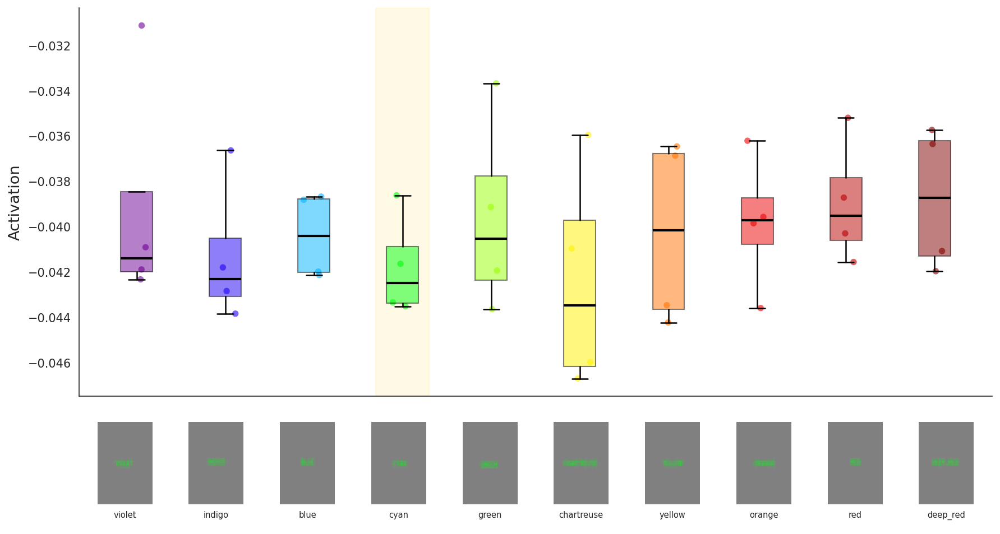

In [ ]:
records, con_acts, incon_acts, p = stroop_experiment(
    neuron_idx   = neuron_idx,
    preferred_wl = wl,   # wavelength preferido encontrado
)

# Kill Cell

In [ ]:
"""
Ocioso - Conjetura de Lemoine (corregida).
"Todo impar > 5 es p + 2q con p,q primos."
Incluye q=2 correctamente.
"""
import sympy as sp
import time, sys

def lemoine_check(limit):
    primes = [2] + list(sp.primerange(3, limit // 2 + 10))

    for n in tqdm(range(7, limit + 1, 2)):
        found = False
        for q in primes:
            if 2 * q >= n:
                break
            p = n - 2 * q
            if sp.isprime(p):
                found = True
                break
        if not found:
            return n
        if n % 50001 == 0:
            print(f"  Revisado n={n:,}...")
            sys.stdout.flush()
    return None

print("=== Conjetura de Lemoine - 'Todo impar > 5 es p + 2q' ===")
print("Buscando contraejemplo...\n")
start = time.time()
r = lemoine_check(100_000_000_000)
print(f"\nSin contraejemplo hasta 100_000_000_000 ({time.time()-start:.0f}s)")
print("Conjetura sigue viva desde 1894.")

=== Conjetura de Lemoine - 'Todo impar > 5 es p + 2q' ===
Buscando contraejemplo...



KeyboardInterrupt: 

In [ ]:
# KILL CELL
from google.colab import runtime
runtime.unassign()